<a href="https://colab.research.google.com/github/camille2019/Women-Capital-Trial-Analysis/blob/main/Keyword_Counts_with_Themes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd

import numpy as np
import sys
import re
import os

import seaborn as sns
import matplotlib.pyplot as plt

>[Raw Keyword Counts](#scrollTo=Y5qch0pRXF4s)

>[TFIDF overall and within gendered sets of documents](#scrollTo=mwW0k4NmRkZo)

>[Raw Keyword Counts by gender and theme](#scrollTo=bbqxulV9Xbx9)

>[Create tables summarizing statistics by keyword](#scrollTo=_sBM1P72aKOh)

>[Top 20 Keywords with highest Mean TFIDF and Mean Raw Counts](#scrollTo=hvz_svO9Asfl)

>[Findings from Overall Mean TF-IDF comparison with Themes](#scrollTo=hbUEPHr33WGX)

>[Findings from Co-Defendant Matches with Themes](#scrollTo=kJu3snDXz69W)

>[Findings from Race State and Crime Match with Themes](#scrollTo=D0y1FjDR1pV6)

>[Heatmaps of counts by Theme](#scrollTo=_tHPzcX-JvRi)

>[Create (updated) nationally representative sample](#scrollTo=kErIRin_cn_I)

>[Findings from Nationally Representatitive Sample with Themes](#scrollTo=ZAV7LyCHy2vY)

>[Contingency Table, Statistical Signficance Test](#scrollTo=-VGZLruBJ0ou)



#Raw Keyword Counts

In [ ]:
len(raw_counts[raw_counts['gender']=='man'].document_name.unique())

68

In [2]:
# 4 categories with gendered and neutral terms
hypersexualize_f = {'busty', 'bra', 'panty', 'lingerie', 'teddy', 'slut', 'whore', 'bimbo', 'floozy', 'bitch', 'jezebel', 'mistress', 'breast', 'cleavage', 'skank', 'cougar', 'temptress', 'short skirt', 'low cut', 'figure hugging', 'tight fitting'}

hypersexualize_m = {'boxers', 'womanizer'}

hypersexualize_n = {'flaunting', 'appealing', 'revealing', 'underwear',  'sex', 'tease', 'lure', 'entice', 'flirt', 'seduce', 'affair', 'adulterer', 'promiscu', 'charm', 'sexy', 'attractive', 'glamour', 'ass', 'booty', 'oversexed', 'immodest' }

all_hypersexualize = hypersexualize_f | hypersexualize_m | hypersexualize_n



sexuality_gender_f = { 'bitch', 'dyke', 'butch', 'lesbian','maternal', 'feminine', 'wife', 'lady', 'woman'}

sexuality_gender_m = {'masculine', 'manly', 'man', 'paternal', 'husband'}

sexuality_gender_n = {'virgin', 'pure', 'sacrificial', 'cold', 'uncaring', 'unfriendly', 'unemotional', 'abandonment', 'neglect', 'overbearing', 'selfish', 'unnatural', 'assertive',
'ugly', 'aggressive','confrontational', 'violent', 'unfeeling',
'bisexual', 'gay', 'queer', 'physically attractive','sex appeal', 'sexual appeal'}
all_sexuality_gender = sexuality_gender_f | sexuality_gender_m | sexuality_gender_n


black_racial_tropes_m = {'patriarch', 'baby daddy', 'gang'}
black_racial_tropes_f = {'mammy', 'matriarch', 'welfare queen', 'baby mama'}
black_racial_tropes_n = {'lazy', 'welfare'}

all_black_racial_tropes = black_racial_tropes_m | black_racial_tropes_f | black_racial_tropes_n


parenting_f = {'mother', 'mom', 'maternal', 'matriarch', 'bad mom', 'bad mother'  }

parenting_m = {'father' , 'dad' ,'paternal', 'patriarch', 'bad dad', 'bad father'}

parenting_n = {'nurture', 'homemaker', 'child abuse', 'emotionally abusive', 'family oriented' }

all_parenting = parenting_f | parenting_m | parenting_n


#6 categories with no gendered terms

immigration = { 'alien', 'foreign', 'backward', 'home', 'citizenship', 'wetback', 'illegal', 'dirty','untrustworthy','exotic', 'diverse', 'different', 'ethnic', 'accent', 'english', 'custom', 'culture',
'steal', 'infiltrat', 'border', 'unlawful presence', 'american hospitality', 'taking over'
}

discredit = {'liar', 'lie', 'manipulat', 'unbelievable', 'exaggerat',  'unreliable', 'inconsistent', 'hysteri', 'corroborate', 'atypical', 'make believe', 'cries wolf', 'if it happened', 'asking for it' , 'asked for it', 'had it coming'}

pathologize = {'calculated', 'cold', 'irrational', 'hysteri', 'inhuman', 'unnatural', 'unstable', 'scheming',  'fake', 'deranged', 'tears',  'cry', 'unemotional', 'uncaring', 'liar', 'manipulative', 'malinger',  'uncontrollable', 'angry', 'insincere', 'not crying', 'lack of empathy'}


rurality_poverty = {'poor', 'welfare', 'poverty', 'lazy', 'cheap',
'drugs', 'cocaine', 'speed', 'marijuana', 'heroin',
'dirty', 'disorganized', 'messy', 'greedy',
'materialistic', 'acquisitive', 'trailer trash',
'food stamps', 'lack of opportunity',
'contribution to society', 'contribute to society'}

racial_tropes_general = {'animal', 'ape', 'savage', 'wolves', 'hyena', 'jackal', 'negro', 'feral', 'lazy', 'brute',
'angry', 'untamable', 'gang', 'welfare', 'culture', 'customs', 'different', 'diverse',
'foreign', 'exotic'}

latinx_racial_tropes = {'culture', 'customs', 'different', 'diverse',
'foreign', 'exotic', 'accent', 'steal',
'english', 'foreign', 'backward',
'community', 'dirty', 'ethnic',
'infiltration', 'welfare', 'taking over'}


all_female_keywords = hypersexualize_f | sexuality_gender_f | black_racial_tropes_f | parenting_f
all_male_keywords = hypersexualize_m | sexuality_gender_m | black_racial_tropes_m | parenting_m
all_neutral_keywords = immigration | discredit | pathologize | rurality_poverty | racial_tropes_general | latinx_racial_tropes | parenting_n | black_racial_tropes_n | sexuality_gender_n | hypersexualize_n

all_keywords = all_neutral_keywords | all_male_keywords | all_female_keywords



In [ ]:
#count using built in str.count()

def keyword_count3(directory, file_name, word, get_passages=False):
  count = 0
  full_path = directory + '/' + file_name
  passages = []
  with open(full_path, 'r',errors='ignore') as f:
    read_file = f.read().lower()
    word_count = read_file.count(word)

    if get_passages:
      if word_count > 0 :
        target_index = read_file.index(word)
        #get 60 words before keyword
        start = max(0, target_index - 60)

                    #get 60 words after keyword
        end = min(len(read_file), target_index + 60 + 1)
        list_passage = read_file[start:end]
        passages.append("".join(list_passage))

  return word_count, passages

In [ ]:
def get_counts(transcript_path, gender_of_path, df10, passages_dict, cols_list, all_keywords, window = 60):
  for doc in os.listdir(transcript_path):
  # if (os.path.splitext(transcript_path)[1].lower() == '.txt'):
    title = doc
    print(title)
    if ".txt" in title:
      doc_path = transcript_path + '/' + doc

      with open(doc_path, "r" ,errors='ignore') as f:
          doc = f.read()
          doc = doc.lower()
      tokenized_doc = doc.split()

      # print(f"defendant\tkeyword\tkeyword_index\tparagraph")


      unordered =  'unordered' in title.lower()
      if unordered:
        get_passages = False
      else:
        get_passages = True


      for keyword in all_keywords:

        #print(keyword)
        count3, passages3= keyword_count3(transcript_path, title, keyword, get_passages)
        #print(count3)

        #save keyword counts

        #all_cols = columns=['document_name', 'gender', 'raw_keyword_count', 'keyword', 'pathologize_theme', 'hypersexualize_theme', 'discredit_theme', 'immigration_theme',
        #'parent_theme' , 'gender_sexuality_theme', 'rurality_poverty_theme', 'gen_racial_trope_theme',
        # 'black_racial_trope_theme', 'latina_racial_trope_theme', 'gendered_keyword_male', 'gendered_keyword_female', 'gender_neutral_keyword'  ]
        df2 = pd.DataFrame(columns=cols_list)

        df2['document_name'] = [title]
        df2['gender'] = [gender_of_path]
        df2['raw_keyword_count'] = [count3]
        df2['keyword'] = [keyword]


        #keyword themes
        dis = keyword in discredit
        hyp =keyword in all_hypersexualize
        pat =  keyword in pathologize
        imm =  keyword in immigration
        par = keyword in all_parenting
        rur = keyword in rurality_poverty
        rac = keyword in racial_tropes_general
        blk = keyword in all_black_racial_tropes
        ltx = keyword in latinx_racial_tropes
        sg = keyword in all_sexuality_gender
        gm =  keyword in all_male_keywords
        gf = keyword in all_female_keywords
        gn = keyword in all_neutral_keywords

        df2['hypersexualize_theme'] = [hyp]
        df2['pathologize_theme'] = [pat]
        df2['discredit_theme'] = dis
        df2['immigration_theme'] = imm
        df2['parent_theme'] = par
        df2['gender_sexuality_theme'] = [keyword in all_sexuality_gender]
        df2['rurality_poverty_theme'] = [keyword in rurality_poverty]
        df2['gen_racial_trope_theme'] = [keyword in racial_tropes_general]
        df2['black_racial_trope_theme'] = [keyword in all_black_racial_tropes]
        df2['latina_racial_trope_theme'] = [keyword in latinx_racial_tropes]
        df2['gendered_keyword_male'] = [keyword in all_male_keywords]
        df2['gendered_keyword_female'] =[ keyword in all_female_keywords]
        df2['gender_neutral_keyword'] = [keyword in all_neutral_keywords]


        df10 = pd.concat([df10, df2], ignore_index=True)



        #save passages from keyword counts

        if get_passages:
          m3_count = len(passages3)
          doc_name = [title] * m3_count
          k = [keyword] *m3_count

          current_doc_passages = pd.DataFrame({'document_name':doc_name, 'gender':gender_of_path, 'keyword': k, 'passage': passages3, 'pathologize_theme': [pat]  *m3_count, 'hypersexualize_theme': [hyp] * m3_count, 'discredit_theme': [dis]* m3_count , 'immigration_theme': [imm] * m3_count,
                                      'parent_theme': [par]  *m3_count , 'gender_sexuality_theme': [sg] *m3_count, 'rurality_poverty_theme': [rur] *m3_count, 'gen_racial_trope_theme': [rac] *m3_count,
                                      'black_racial_trope_theme': [blk] *m3_count, 'latina_racial_trope_theme': [ltx] *m3_count, 'gendered_keyword_male': [gm] *m3_count, 'gendered_keyword_female': [gf] *m3_count, 'gender_neutral_keyword': [gn] *m3_count
                                      })
          passages_dict = pd.concat([passages_dict, current_doc_passages], ignore_index=True)

  return df10, passages_dict


In [ ]:
all_cols = columns=['document_name', 'gender', 'raw_keyword_count', 'keyword', 'pathologize_theme', 'hypersexualize_theme', 'discredit_theme', 'immigration_theme', 'parent_theme' , 'gender_sexuality_theme', 'rurality_poverty_theme', 'gen_racial_trope_theme', 'black_racial_trope_theme', 'latina_racial_trope_theme', 'gendered_keyword_male', 'gendered_keyword_female', 'gender_neutral_keyword'  ]

In [ ]:
df = pd.DataFrame(columns=all_cols)

passage_df =  pd.DataFrame(columns=['document_name', 'gender', 'keyword', 'passage', 'pathologize_theme', 'hypersexualize_theme', 'discredit_theme', 'immigration_theme', 'parent_theme' , 'gender_sexuality_theme', 'rurality_poverty_theme', 'gen_racial_trope_theme', 'black_racial_trope_theme', 'latina_racial_trope_theme', 'gendered_keyword_male', 'gendered_keyword_female', 'gender_neutral_keyword'  ])


In [ ]:
d, passages = get_counts('/content/women_test', 'woman', df, passage_df, all_cols, all_keywords, window = 60)

In [ ]:
d, passages = get_counts('/content/women', 'woman', d, passages, all_cols, all_keywords, window = 60)

Maureen McDermott.txt
Valerie Martin.txt
Brooke Rottiers.txt
Tiffany Moss.txt
Blanche Taylor Moore.txt
Kimberly Cargill.txt
Susan Eubanks.txt
Tierra Capri Gobble.txt
Kerry Dalton.txt
Tiffany Cole.txt
Cherie Rhoades.txt
Patricia Blackmon.txt
Socorro Caro.txt
Taylor Parker.txt
Manling Williams.txt
Melissa Lucio.txt
Tanya Nelson.txt
Celeste Carrington.txt
.ipynb_checkpoints
Christie Michelle Scott.txt
Erica Sheppard.txt
Darlie Routier.txt
Brittany Holberg.txt
Lisa Chamberlin.txt
Maria Alfaro.txt
John Allen.txt
Carlette Parker.txt
Antoinette Frank.txt
Michelle Tharp.txt
Lorraine Hunter.txt
Tina Brown.txt
Shawna Forde.txt
Heather Keaton.txt
Donna Roberts.txt
Sammantha Allen.txt
Angelina Rodriguez.txt
Veronica Gonzales.txt
Lisa Graham.txt
Margaret Allen.txt
Brenda Andrew.txt
Christa Pike.txt


In [ ]:
d, passages = get_counts('/content/women', 'woman', d, passages, all_cols, all_keywords, window = 60)

In [ ]:
d, passages = get_counts('/content/men_test', 'man', d, passages, all_cols, all_keywords, window = 60)

Willie Terion Washington Combined Transcript.txt


In [ ]:
d, passages = get_counts('/content/men', 'man', d, passages, all_cols, all_keywords, window = 60)

Jason Delacerda Combined Transcript.txt
Isidro Miguel Delacruz Combined TranscriptOCR.txt
James Dickerson.txt
Darren Stanley Combined Transcript.txt
Ricky Blackwell Combined Transcript.txt
Dexter Johnson Combined Transcript.txt
Damon Matthews Combined Transcript.txt
Carlos Kennedy Combined TranscriptOCR.txt
Derrick Dearman Combined TranscriptOCR.txt
Albert Reid Combined Transcript.txt
Micheal_Bell_Unordered_Transcript.txt
Rodney San Nicolas Combined Transcript.txt
Eric Leonard Combined TranscriptOCR.txt
Robert Cowan Combined Transcript.txt
Obel Cruz Garcia Combined Transcript.txt
Charles Mamou Combined Transcript.txt
Danny Horning Combined Transcript.txt
Michael Slaughter Combined TranscriptOCR.txt
Dannie Hillhouse Combined Transcript.txt
Ramiro Ibarra Combined Transcript.txt
Paul Bolin Combined Transcript.txt
Clarence Ray Combined Transcript.txt
James Majors Combined TranscriptOCR.txt
David Leonard Wood Combined Transcript.txt
Dennis Ervine Combined Transcript OCR.txt
.ipynb_checkpoin

In [ ]:
d

NameError: name 'd' is not defined

In [ ]:
len(d['document_name'].unique())

110

In [ ]:
len(d[d['gender']=='woman']['document_name'].unique())

41

In [ ]:
len(d[d['gender']=='man']['document_name'].unique())

69

In [ ]:
d.to_csv('keyword_counts_11_21.csv')

In [ ]:
passages.to_csv('passages_keywords_11_21.csv')

In [ ]:
joint_df, joint_passages = get_counts('/content/jointly_tried', 'man and woman', df, passage_df, all_cols, all_keywords, window = 60)

Cathy Sarinana.txt
Janeen Snyder.txt
Belinda Magana.txt
Cynthia Coffman.txt
Virginia Caudill.txt
Michelle Michaud.txt


In [ ]:
joint_df

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,rurality_poverty_theme,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword
0,Cathy Sarinana.txt,man and woman,0,lingerie,False,True,False,False,False,False,False,False,False,False,False,True,False
1,Cathy Sarinana.txt,man and woman,0,flirt,False,True,False,False,False,False,False,False,False,False,False,False,True
2,Cathy Sarinana.txt,man and woman,0,negro,False,False,False,False,False,False,False,True,False,False,False,False,True
3,Cathy Sarinana.txt,man and woman,0,matriarch,False,False,False,False,True,False,False,False,True,False,False,True,False
4,Cathy Sarinana.txt,man and woman,234,mother,False,False,False,False,True,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,Michelle Michaud.txt,man and woman,3,neglect,False,False,False,False,False,True,False,False,False,False,False,False,True
1130,Michelle Michaud.txt,man and woman,32,border,False,False,False,True,False,False,False,False,False,False,False,False,True
1131,Michelle Michaud.txt,man and woman,2,hysteri,True,False,True,False,False,False,False,False,False,False,False,False,True
1132,Michelle Michaud.txt,man and woman,0,atypical,False,False,True,False,False,False,False,False,False,False,False,False,True


In [ ]:
joint_df.to_csv('jointly_tried_keyword_counts_11_21.csv')

In [ ]:
joint_passages.to_csv('jointly_tried_passages_11_21.csv')

In [ ]:
joint_passages

,document_name,gender,keyword,passage,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,rurality_poverty_theme,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword
0,Cathy Sarinana.txt,man and woman,mother,04. these brothers grew up in los angeles coun...,False,False,False,False,True,False,False,False,False,False,False,True,False
1,Cathy Sarinana.txt,man and woman,lack of opportunity,erstand. i am just pointing out that there is ...,False,False,False,False,False,False,True,False,False,False,False,False,True
2,Cathy Sarinana.txt,man and woman,cry,"to come over here."" ""what's your emergency?"" ...",True,False,False,False,False,False,False,False,False,False,False,False,True
3,Cathy Sarinana.txt,man and woman,sex,-1-1 and reported conrad as a runaway and that...,False,True,False,False,False,False,False,False,False,False,False,False,True
4,Cathy Sarinana.txt,man and woman,messy,"idence itself appear to be neat and tidy, or w...",False,False,False,False,False,False,True,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
542,Michelle Michaud.txt,man and woman,pure,"harged, which is not supported by physical evi...",False,False,False,False,False,True,False,False,False,False,False,False,True
543,Michelle Michaud.txt,man and woman,lady,"t, the dna of james daveggio is on her face. t...",False,False,False,False,False,True,False,False,False,False,False,True,False
544,Michelle Michaud.txt,man and woman,neglect,sample? a. no. q. the other thing i wanted to...,False,False,False,False,False,True,False,False,False,False,False,False,True
545,Michelle Michaud.txt,man and woman,border,"of sacramento, california. their terror reach...",False,False,False,True,False,False,False,False,False,False,False,False,True


In [ ]:
#create a seperate dataframe of just joint transcripts

In [ ]:
passages

,document_name,gender,keyword,passage,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,rurality_poverty_theme,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword
0,Wendi Andriano.txt,woman,flirt,nd how was she with the other men that were 16...,False,True,False,False,False,False,False,False,False,False,False,False,True
1,Wendi Andriano.txt,woman,mother,ing they could do for him. he was going . \ to...,False,False,False,False,True,False,False,False,False,False,False,True,False
2,Wendi Andriano.txt,woman,cry,"been drinking, and that when drinking, he woul...",True,False,False,False,False,False,False,False,False,False,False,False,True
3,Wendi Andriano.txt,woman,asking for it,"september 22nd, if he's already told you that,...",False,False,True,False,False,False,False,False,False,False,False,False,True
4,Wendi Andriano.txt,woman,sex,ble. she wants him comfortable because they be...,False,True,False,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,Christa Pike.txt,woman,virgin,"te credit hours in criminal justice, from the ...",False,False,False,False,False,True,False,False,False,False,False,False,True
2887,Christa Pike.txt,woman,corroborate,"tatement of ms. pike, this is, as to the box c...",False,False,True,False,False,False,False,False,False,False,False,False,True
2888,Christa Pike.txt,woman,lady,oing at your office? a one of these missing pe...,False,False,False,False,False,True,False,False,False,False,False,True,False
2889,Christa Pike.txt,woman,border,r or rip the skin open. we have lacerations he...,False,False,False,True,False,False,False,False,False,False,False,False,True


#TFIDF overall and within gendered sets of documents

In [ ]:
women_path = '/content/women/'

men_path = '/content/men/'

w_file_counts = {}

m_file_counts = {}

for file in os.listdir(women_path):

  with open(women_path +file) as f:
    data = f.read()

    w = data.split()

    word_count = len(w)

    unique_count = len(list(set(w)))

    w_file_counts[file] = (word_count, unique_count)


NameError: name 'os' is not defined

#Raw Keyword Counts by gender and theme

In [124]:
keyword_theme_columns = [ 'hypersexualize_theme', 'discredit_theme', 'immigration_theme', 'parent_theme' , 'gender_sexuality_theme', 'rurality_poverty_theme', 'gen_racial_trope_theme', 'black_racial_trope_theme', 'latina_racial_trope_theme', 'gendered_keyword_male', 'gendered_keyword_female', 'gender_neutral_keyword'  ]
gender_groups = ['gendered_keyword_male', 'gendered_keyword_female', 'gender_neutral_keyword'  ]
theme_types =  [ 'hypersexualize_theme', 'discredit_theme', 'immigration_theme', 'parent_theme' , 'gender_sexuality_theme', 'rurality_poverty_theme', 'gen_racial_trope_theme', 'black_racial_trope_theme', 'latina_racial_trope_theme']


In [9]:
raw_counts = pd.read_csv('/content/keyword_counts_11_21.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/keyword_counts_11_21.csv'

In [ ]:
raw_counts

,Unnamed: 0,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,rurality_poverty_theme,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword
0,0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,False,False,False,False,False,True,False
1,1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,False,False,False,False,False,False,True
2,2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,False,True,False,False,False,False,True
3,3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,False,False,True,False,False,True,False
4,4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,False,False,False,False,False,False,True
20786,20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,False,False,False,False,False,False,True
20787,20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,False,False,False,False,False,False,True
20788,20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,False,False,False,False,False,False,True


In [ ]:
sorted(list(raw_counts[raw_counts['gender']=='woman'].document_name.unique()))

['Angelina Rodriguez.txt',
 'Antoinette Frank.txt',
 'Blanche Taylor Moore.txt',
 'Brenda Andrew.txt',
 'Brittany Holberg.txt',
 'Brooke Rottiers.txt',
 'Carlette Parker.txt',
 'Celeste Carrington.txt',
 'Cherie Rhoades.txt',
 'Christa Pike.txt',
 'Christie Michelle Scott.txt',
 'Darlie Routier.txt',
 'Donna Roberts.txt',
 'Erica Sheppard.txt',
 'Heather Keaton.txt',
 'John Allen.txt',
 'Kerry Dalton.txt',
 'Kimberly Cargill.txt',
 'Lisa Chamberlin.txt',
 'Lisa Graham.txt',
 'Lorraine Hunter.txt',
 'Manling Williams.txt',
 'Margaret Allen.txt',
 'Maria Alfaro.txt',
 'Maureen McDermott.txt',
 'Melissa Lucio.txt',
 'Michelle Tharp.txt',
 'Patricia Blackmon.txt',
 'Sammantha Allen.txt',
 'Shawna Forde.txt',
 'Socorro Caro.txt',
 'Susan Eubanks.txt',
 'Tanya Nelson.txt',
 'Taylor Parker.txt',
 'Tierra Capri Gobble.txt',
 'Tiffany Cole.txt',
 'Tiffany Moss.txt',
 'Tina Brown.txt',
 'Valerie Martin.txt',
 'Veronica Gonzales.txt',
 'Wendi Andriano.txt']

In [ ]:
sorted(list(raw_counts[raw_counts['gender']=='man'].document_name.unique()))

['Albert Gaxiola Combined Transcript.txt',
 'Albert Reid Combined Transcript.txt',
 'Andrew Lackey Combined TranscriptOCR.txt',
 'Blaine Milam Combined Transcript OCR.txt',
 'Carlos Kennedy Combined TranscriptOCR.txt',
 'Cedric Ricks Combined Transcript.txt',
 'Charles Mamou Combined Transcript.txt',
 'Christopher Sepulvado Combined Transcript.txt',
 'Clarence Ray Combined Transcript.txt',
 'Damon Matthews Combined Transcript.txt',
 'Daniel Whalen Combined Transcript.txt',
 'Dannie Hillhouse Combined Transcript.txt',
 'Danny Horning Combined Transcript.txt',
 'Darren Stanley Combined Transcript.txt',
 'David Leonard Wood Combined Transcript.txt',
 'Dennis Ervine Combined Transcript OCR.txt',
 'Dennis Lawley Combined Transcript.txt',
 'Derek Chappell Combined Transcript.txt',
 'Derrick Dearman Combined TranscriptOCR.txt',
 'Dexter Johnson Combined Transcript.txt',
 'Eric Leonard Combined TranscriptOCR.txt',
 'Fabian Hernandez Combined Transcript.txt',
 'Hector Acosta Combined Transcript

In [ ]:
co_defendant_match = { 'Heather Keaton.txt', 'Sammantha Allen.txt',
                      'John DeBlase Combined Transcript - No PP Vols.txt',  'John Allen Combined Transcript.txt',
                       'Erica Sheppard.txt',  'James Dickerson.txt',
                       'Brenda Andrew.txt',  'James Pavatt.txt'
}



race_state_crime_match =  {'Cherie Rhoades.txt',
 'Shawna Forde.txt','Manling Williams.txt', 'Brooke Rottiers.txt','Erica Sheppard.txt',  'Darlie Routier.txt', 'Taylor Parker.txt',  'Kimberly Cargill.txt',  'Sammantha Allen.txt',  'Brenda Andrew.txt',  'Melissa Lucio.txt',
 'Wendi Andriano.txt', 'Maureen McDermott.txt',  'Susan Eubanks.txt',  'Valerie Martin.txt',  'Christie Michelle Scott.txt',



 'Clarence Ray Combined Transcript.txt',  'Jason Bush Combined Transcript.txt',  'Rodney San Nicolas Combined Transcript.txt',  'Eric Leonard Combined TranscriptOCR.txt',  'James Dickerson.txt',  'Willie Terion Washington Combined Transcript.txt',
                            'Danny Horning Combined Transcript.txt',  'John DeBlase Combined Transcript - No PP Vols.txt',  'Blaine Milam Combined Transcript OCR.txt',  'Robert Roberson Combined Transcript.txt',  'Damon Matthews Combined Transcript.txt',  'John Allen Combined Transcript.txt',
                            'James Pavatt.txt',  'Manuel Velez Combined Transcript.txt',  'Juan Ramon Meza Segundo Combined Transcript.txt',  'Thomas Lenart Combined Transcript.txt',  'Derek Chappell Combined Transcript.txt',  'Richard Vieira Combined Transcript.txt'}


In [ ]:
raw_counts = raw_counts.drop(columns= 'Unnamed: 0')

In [ ]:
sorted(raw_counts[raw_counts['gender']=='man'].document_name.unique())

['Albert Gaxiola Combined Transcript.txt',
 'Albert Reid Combined Transcript.txt',
 'Andrew Lackey Combined TranscriptOCR.txt',
 'Blaine Milam Combined Transcript OCR.txt',
 'Carlos Kennedy Combined TranscriptOCR.txt',
 'Cedric Ricks Combined Transcript.txt',
 'Charles Mamou Combined Transcript.txt',
 'Christopher Sepulvado Combined Transcript.txt',
 'Clarence Ray Combined Transcript.txt',
 'Damon Matthews Combined Transcript.txt',
 'Daniel Whalen Combined Transcript.txt',
 'Dannie Hillhouse Combined Transcript.txt',
 'Danny Horning Combined Transcript.txt',
 'Darren Stanley Combined Transcript.txt',
 'David Leonard Wood Combined Transcript.txt',
 'Dennis Ervine Combined Transcript OCR.txt',
 'Dennis Lawley Combined Transcript.txt',
 'Derek Chappell Combined Transcript.txt',
 'Derrick Dearman Combined TranscriptOCR.txt',
 'Dexter Johnson Combined Transcript.txt',
 'Eric Leonard Combined TranscriptOCR.txt',
 'Fabian Hernandez Combined Transcript.txt',
 'Hector Acosta Combined Transcript

In [ ]:
#remove duplicates
raw_counts = raw_counts[raw_counts['document_name'] != "James Dickerson_Combined Transcript - OCR'd.txt"]



In [ ]:
raw_counts.loc[raw_counts['document_name'].isin(co_defendant_match), 'co_defendant_match'] = True

raw_counts.loc[raw_counts['document_name'].isin(race_state_crime_match), 'race_state_crime_match'] = True

raw_counts

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,rurality_poverty_theme,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword,co_defendant_match,race_state_crime_match
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,False,False,False,False,False,True,False,NaN,True
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,False,False,False,False,False,False,True,NaN,True
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,False,True,False,False,False,False,True,NaN,True
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,False,False,True,False,False,True,False,NaN,True
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,False,False,False,False,False,True,False,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,False,False,False,False,False,False,True,NaN,True
20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,False,False,False,False,False,False,True,NaN,True
20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,False,False,False,False,False,False,True,NaN,True
20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,False,False,False,False,False,False,True,NaN,True


In [ ]:
raw_counts['co_defendant_match'] = raw_counts['co_defendant_match'].fillna(False)
raw_counts['race_state_crime_match'] = raw_counts['race_state_crime_match'].fillna(False)
raw_counts

/tmp/ipython-input-3620405496.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  raw_counts['co_defendant_match'] = raw_counts['co_defendant_match'].fillna(False)
/tmp/ipython-input-3620405496.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  raw_counts['race_state_crime_match'] = raw_counts['race_state_crime_match'].fillna(False)


,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,rurality_poverty_theme,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword,co_defendant_match,race_state_crime_match
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,False,False,False,False,False,True,False,False,True
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,False,False,False,False,False,False,True,False,True
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,False,True,False,False,False,False,True,False,True
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,False,False,False,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,False,False,False,False,False,False,True,False,True
20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,False,False,False,False,False,False,True,False,True
20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,False,False,False,False,False,False,True,False,True
20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True


In [ ]:

import matplotlib.pyplot as plt
import numpy as np

/tmp/ipython-input-467286614.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


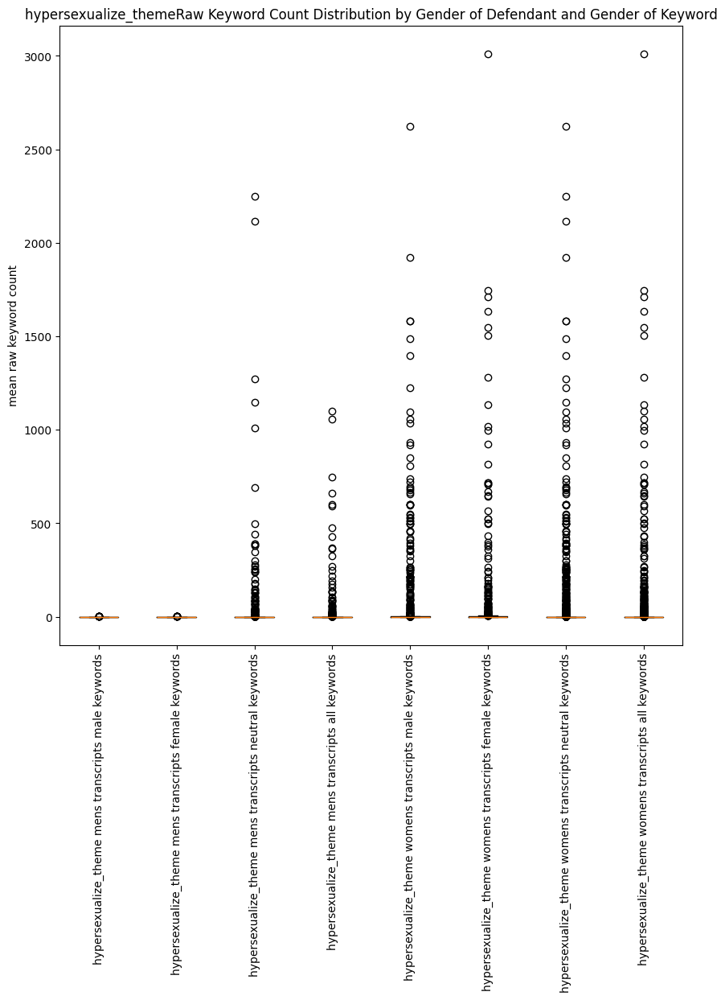

/tmp/ipython-input-467286614.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


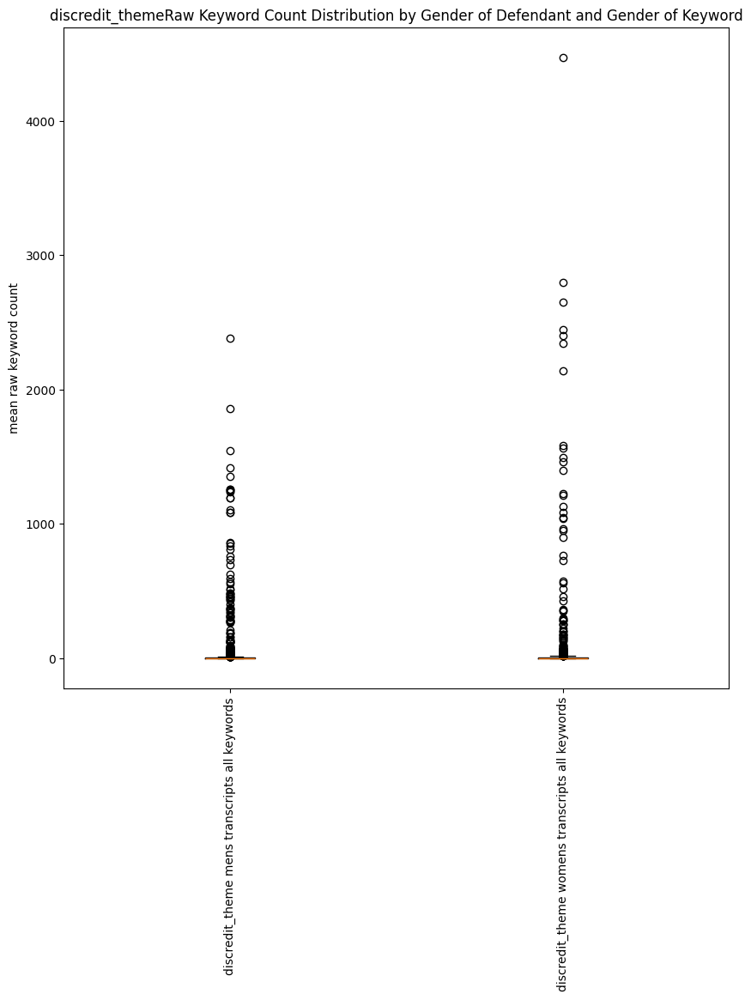

/tmp/ipython-input-467286614.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


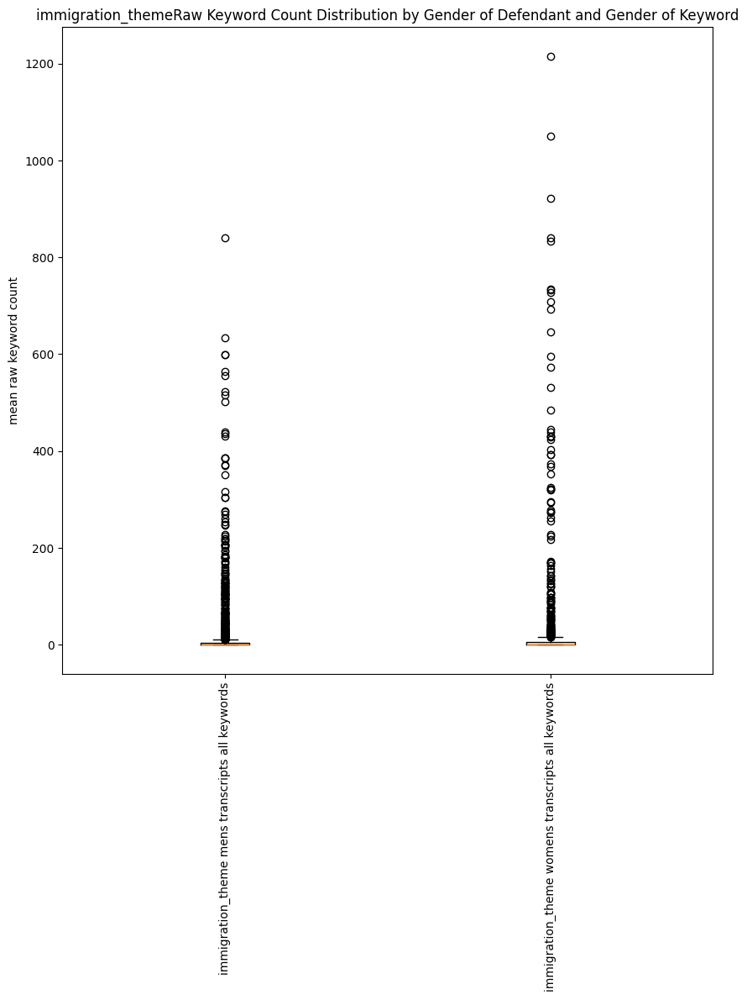

/tmp/ipython-input-467286614.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


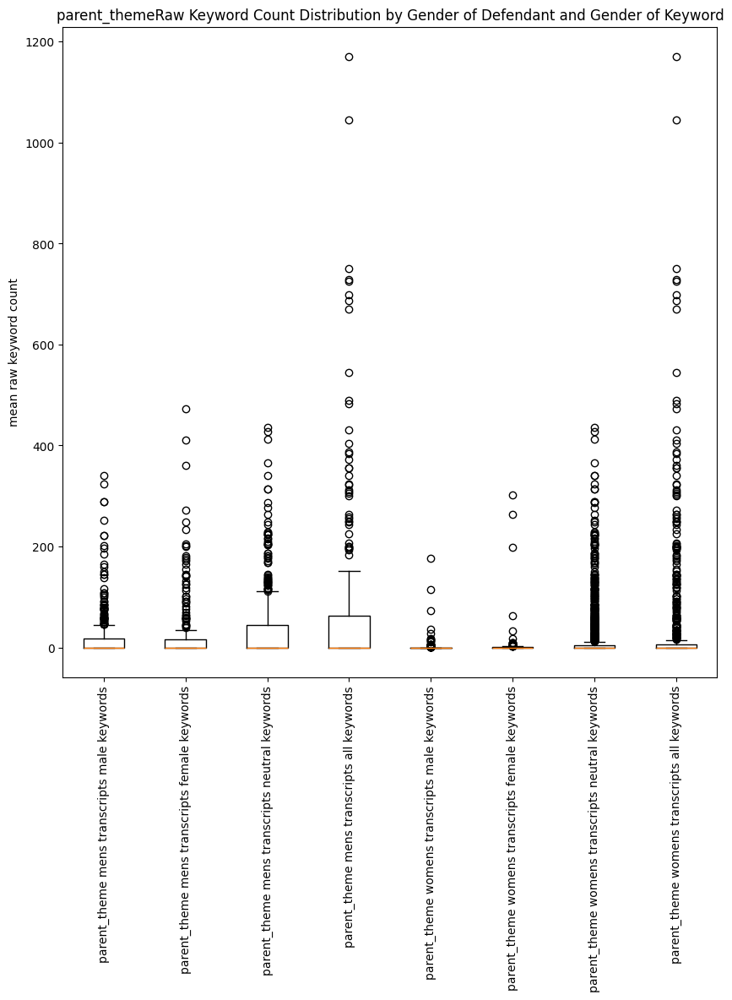

/tmp/ipython-input-467286614.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


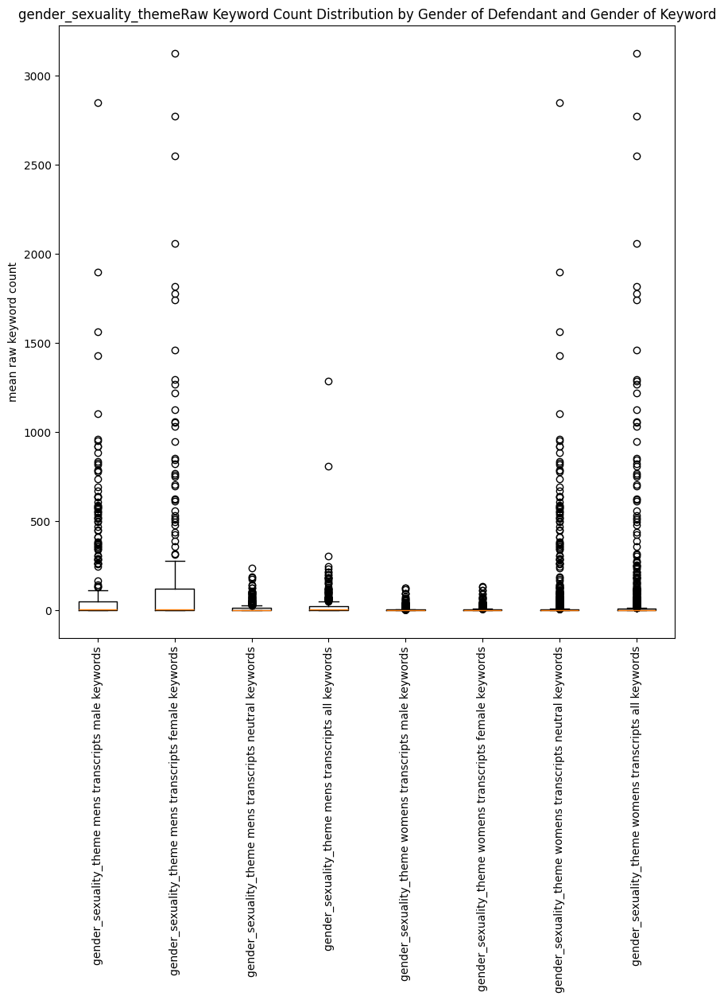

/tmp/ipython-input-467286614.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


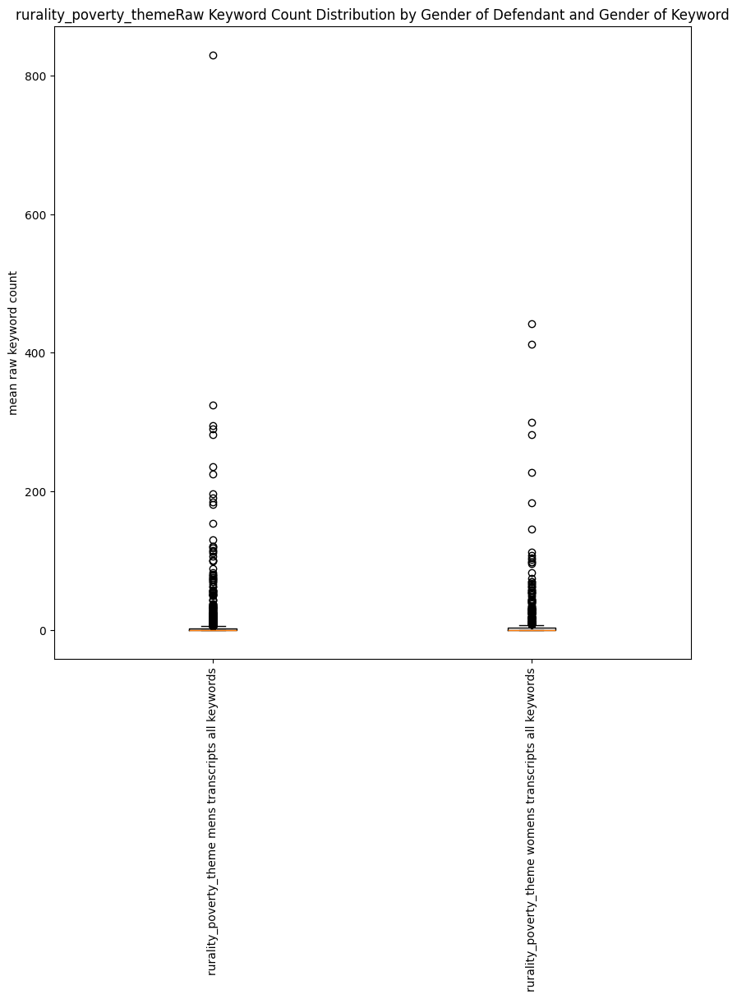

/tmp/ipython-input-467286614.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


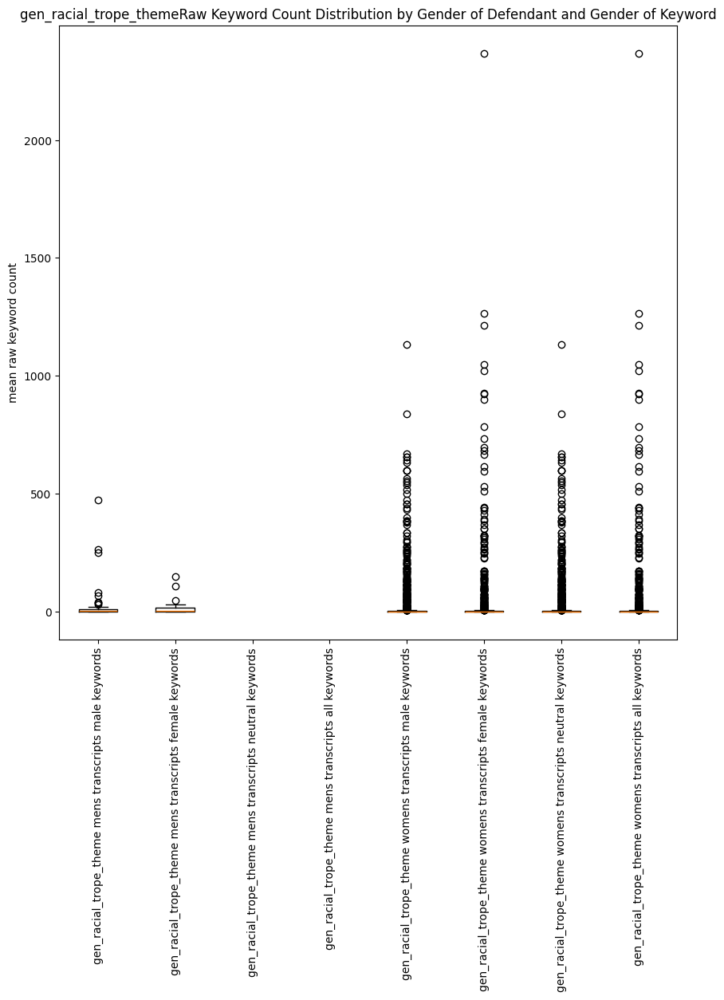

/tmp/ipython-input-467286614.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


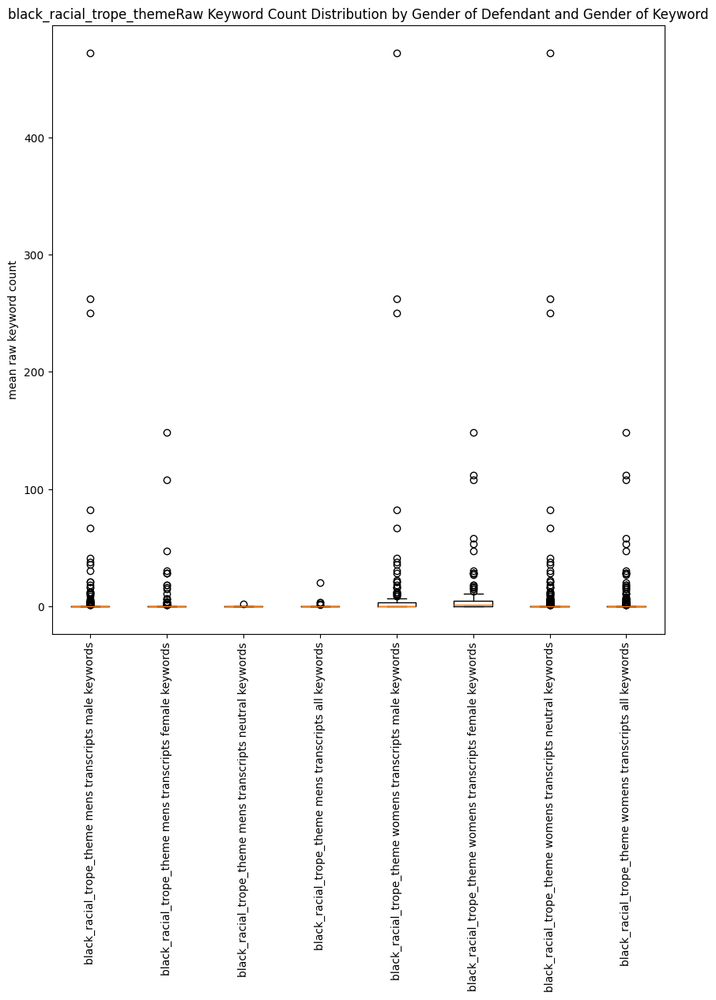

/tmp/ipython-input-467286614.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


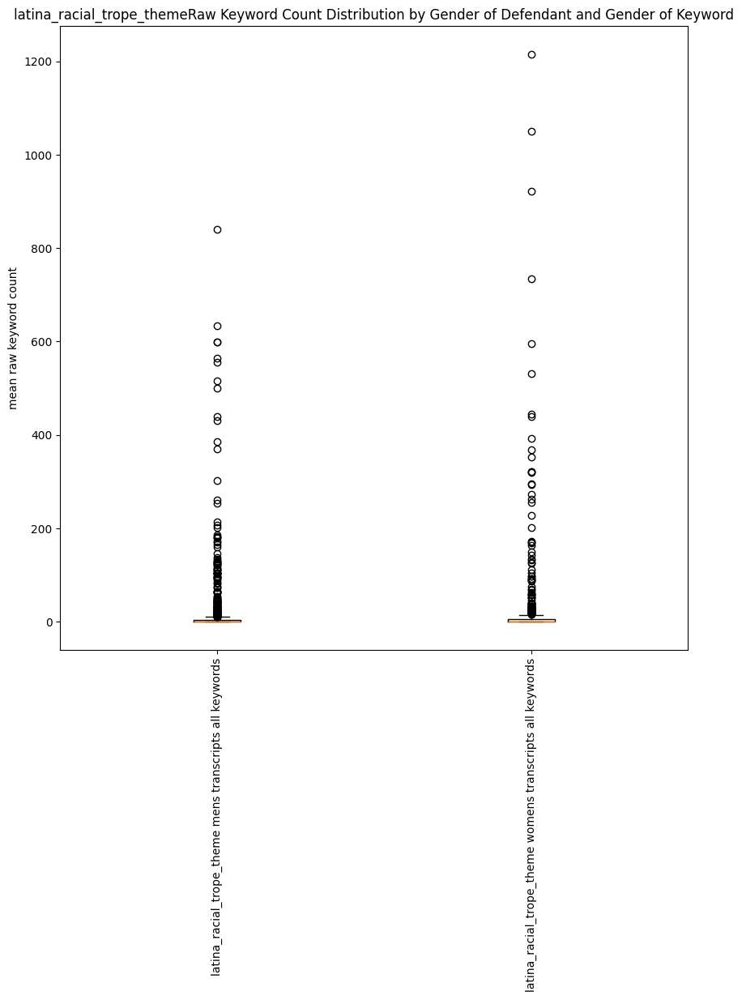

In [ ]:
for col in theme_types:
  men = raw_counts[raw_counts['gender']== 'man']
  women = raw_counts[raw_counts['gender']== 'woman']

  #mean count of each theme by gender

  men_theme_m =  men[(men[col]==True) & men['gendered_keyword_male'] == True]['raw_keyword_count']
  men_theme_f = men[(men[col]==True) & men['gendered_keyword_female'] == True]['raw_keyword_count']
  men_theme_n = men[(men[col]==True) & men['gender_neutral_keyword'] == True]['raw_keyword_count']
  men_theme_all = men[(men[col]==True)]['raw_keyword_count']


  women_theme_m = women[(women[col]==True) & women['gendered_keyword_male'] == True]['raw_keyword_count']
  women_theme_f = women[(women[col]==True) & women['gendered_keyword_female'] == True]['raw_keyword_count']
  women_theme_n = women[(women[col]==True) & women['gender_neutral_keyword'] == True]['raw_keyword_count']
  women_theme_all = women[(women[col]==True)]['raw_keyword_count']


  plt.figure(figsize=(10, 10))

  if len(men_theme_m) > 0:

    plt.boxplot([men_theme_m, women_theme_m,
                men_theme_f,  women_theme_f ,
                men_theme_n, women_theme_n,
                men_theme_all, women_theme_all], labels=[col + ' mens transcripts ' + 'male keywords',
                                                                                                              col + ' mens transcripts ' + 'female keywords',
                                                                                                              col + ' mens transcripts ' + 'neutral keywords',
                                                                                                              col + ' mens transcripts ' + 'all keywords',
                                                                                                              col + ' womens transcripts ' + 'male keywords',
                                                                                                              col + ' womens transcripts ' + 'female keywords',
                                                                                                              col + ' womens transcripts ' + 'neutral keywords',
                                                                                                              col + ' womens transcripts ' + 'all keywords']
    )




    plt.xticks(rotation=90)

    # Adding a title and labels
    plt.title(col + 'Raw Keyword Count Distribution by Gender of Defendant and Gender of Keyword')
    plt.ylabel('mean raw keyword count')

    # Display the plot
    plt.show()

  else:

    plt.boxplot([


                men_theme_all, women_theme_all], labels=[
                                                                                                              col + ' mens transcripts ' + 'all keywords',

                                                                                                              col + ' womens transcripts ' + 'all keywords']
    )




    plt.xticks(rotation=90)

    # Adding a title and labels
    plt.title(col + 'Raw Keyword Count Distribution by Gender of Defendant and Gender of Keyword')
    plt.ylabel('mean raw keyword count')

    # Display the plot
    plt.show()

Calculate TFIDF with docs

In [ ]:
raw_counts['document_word_count'] = [False] * 20601

In [ ]:
raw_counts['document_unique_word_count'] = [False] * 20601

In [ ]:
file_counts ={}

for file in raw_counts.document_name.unique():

  with open('/content/' +file, errors='ignore') as f:
    data = f.read()

    w = data.split()

    word_count = len(w)

    unique_count = len(list(set(w)))

    file_counts[file] = (word_count, unique_count)


    # Set 'NewColumn' to 100 where 'Category' is 'A'
    # raw_counts.loc[raw_counts['document_name'] == file, 'document_word_count'] = word_count
    # raw_counts.loc[raw_counts['document_name'] == file, 'document_unique_word_count'] = unique_count

In [ ]:
raw_counts

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,gen_racial_trope_theme,black_racial_trope_theme,latina_racial_trope_theme,gendered_keyword_male,gendered_keyword_female,gender_neutral_keyword,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,False,False,False,True,False,False,True,1078612,26789
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,False,False,False,False,False,True,False,True,1078612,26789
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,True,False,False,False,False,True,False,True,1078612,26789
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,True,False,False,True,False,False,True,1078612,26789
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,False,False,False,True,False,False,True,1078612,26789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,...,False,False,False,False,False,True,False,True,920115,30899
20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,...,False,False,False,False,False,True,False,True,920115,30899
20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,...,False,False,False,False,False,True,False,True,920115,30899
20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,...,False,False,False,False,False,True,False,True,920115,30899


In [ ]:
file_counts

{'Wendi Andriano.txt': (1078612, 26789),
 'Maureen McDermott.txt': (1430217, 46806),
 'Valerie Martin.txt': (593480, 24092),
 'Brooke Rottiers.txt': (739572, 28190),
 'Tiffany Moss.txt': (151358, 10777),
 'Blanche Taylor Moore.txt': (517945, 30105),
 'Kimberly Cargill.txt': (800318, 28853),
 'Susan Eubanks.txt': (590834, 27644),
 'Tierra Capri Gobble.txt': (150541, 11982),
 'Kerry Dalton.txt': (459919, 19873),
 'Tiffany Cole.txt': (225102, 13747),
 'Cherie Rhoades.txt': (270773, 17170),
 'Patricia Blackmon.txt': (129598, 12111),
 'Socorro Caro.txt': (2091311, 53511),
 'Taylor Parker.txt': (1157376, 36444),
 'Manling Williams.txt': (1211606, 33635),
 'Melissa Lucio.txt': (199926, 12023),
 'Tanya Nelson.txt': (490076, 29370),
 'Celeste Carrington.txt': (633515, 25354),
 'Christie Michelle Scott.txt': (632062, 22773),
 'Erica Sheppard.txt': (134451, 9838),
 'Darlie Routier.txt': (917420, 27988),
 'Brittany Holberg.txt': (291955, 20928),
 'Lisa Chamberlin.txt': (121490, 9001),
 'Maria Alfa

In [ ]:
raw_counts["document_word_count"]

,document_word_count
0,1078612
1,1078612
2,1078612
3,1078612
4,1078612
...,...
20785,920115
20786,920115
20787,920115
20788,920115


In [ ]:
raw_counts['term_frequency'] = raw_counts['raw_keyword_count']/ raw_counts['document_word_count']

total_womens_docs = len(raw_counts[raw_counts['gender']=='woman'].document_name.unique())
total_mens_docs = len(raw_counts[raw_counts['gender']=='man'].document_name.unique())

total_docs = len(raw_counts.document_name.unique())

In [ ]:
raw_counts['term_frequency']

,term_frequency
0,0.0
1,0.000028
2,0.0
3,0.0
4,0.000453
...,...
20785,0.000004
20786,0.000073
20787,0.0
20788,0.000002


In [ ]:
N_womens_docs_with_K = dict()

#get number of docs with term t for each term
k = raw_counts.keyword.unique()


women_only = raw_counts[raw_counts['gender']=='woman']

for keyword in k:

  #need to also specify keyword_theme otherwise the keyword will be counted multiple times for each theme/ or specify only one row per document_name

  docs_with_term = len(women_only[(women_only['keyword']==keyword)  & (women_only['raw_keyword_count'] > 0) ].drop_duplicates(subset=['document_name'], keep='first'))
  # print(keyword)
  # print(docs_with_term)

  N_womens_docs_with_K[keyword] = docs_with_term


In [ ]:
N_mens_docs_with_K = dict()

#get number of docs with term t for each term
k = raw_counts.keyword.unique()


men_only = raw_counts[raw_counts['gender']=='man']

for keyword in k:

  #need to also specify keyword_theme otherwise the keyword will be counted multiple times for each theme/ or specify only one row per document_name

  docs_with_term = len(men_only[(men_only['keyword']==keyword)  & (men_only['raw_keyword_count'] > 0) ].drop_duplicates(subset=['document_name'], keep='first'))
  # print(keyword)
  # print(docs_with_term)

  N_mens_docs_with_K[keyword] = docs_with_term

In [ ]:
N_docs_with_K = dict()

#get number of docs with term t for each term
k = raw_counts.keyword.unique()


copy = raw_counts

for keyword in k:

  #need to also specify keyword_theme otherwise the keyword will be counted multiple times for each theme/ or specify only one row per document_name

  docs_with_term = len(copy[(copy['keyword']==keyword)  & (copy['raw_keyword_count'] > 0) ].drop_duplicates(subset=['document_name'], keep='first'))
  # print(keyword)
  # print(docs_with_term)

  N_docs_with_K[keyword] = docs_with_term

In [ ]:
raw_counts['women_only_tfidf_11_25']

,women_only_tfidf_11_25
0,0.000000
1,0.000037
2,0.000000
3,0.000000
4,0.000000
...,...
20785,0.000000
20786,0.000000
20787,0.000000
20788,0.000000


In [ ]:
N_docs_with_K['lie']

109

In [ ]:
41/5

In [ ]:


raw_counts['women_only_tfidf_11_25'] = np.where( (raw_counts['keyword'].map(N_womens_docs_with_K) ==0) | (raw_counts['gender']=='man') , 0, raw_counts['term_frequency'] * np.log( total_womens_docs / raw_counts['keyword'].map(N_womens_docs_with_K) ))

In [ ]:
raw_counts['men_only_tfidf_11_25'] = np.where( (raw_counts['keyword'].map(N_mens_docs_with_K) ==0) | (raw_counts['gender']=='woman') , 0, raw_counts['term_frequency'] * np.log( total_mens_docs / raw_counts['keyword'].map(N_mens_docs_with_K) ))

In [ ]:
raw_counts['overall_tfidf_11_25'] = np.where( (raw_counts['keyword'].map(N_docs_with_K) ==0), 0, raw_counts['term_frequency'] * np.log( total_docs / raw_counts['keyword'].map(N_docs_with_K) ))

In [ ]:
raw_counts['women_only_tfidf_11_25'] = raw_counts['women_only_tfidf_11_25'].astype(int)


In [ ]:
# raw_counts['women_only_tfidf_11_25'].to_numeric()
raw_counts['women_only_tfidf_11_25'] = raw_counts['women_only_tfidf_11_25'].astype(float)
raw_counts['men_only_tfidf_11_25'] = raw_counts['men_only_tfidf_11_25'].astype(float)
raw_counts['overall_tfidf_11_25'] = raw_counts['overall_tfidf_11_25'].astype(float)

In [ ]:
# raw_counts['overall_tfidf_11_24'] = np.where( (raw_counts['keyword'].map(N_docs_with_K) ==0)  , 0, raw_counts['term_frequency'] * np.log( total_docs / raw_counts['keyword'].map(N_docs_with_K) ))

/tmp/ipython-input-811171270.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_counts['overall_tfidf_11_24'] = np.where( (raw_counts['keyword'].map(N_docs_with_K) ==0)  , 0, raw_counts['term_frequency'] * np.log( total_docs / raw_counts['keyword'].map(N_docs_with_K) ))


In [ ]:
# raw_counts['men_only_tfidf_11_24'] = np.where( (raw_counts['keyword'].map(N_mens_docs_with_K) ==0) | (raw_counts['gender']=='woman') , 0, raw_counts['term_frequency'] * np.log( total_mens_docs / raw_counts['keyword'].map(N_mens_docs_with_K) ))

/tmp/ipython-input-4286530620.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_counts['men_only_tfidf_11_24'] = np.where( (raw_counts['keyword'].map(N_mens_docs_with_K) ==0) | (raw_counts['gender']=='woman') , 0, raw_counts['term_frequency'] * np.log( total_mens_docs / raw_counts['keyword'].map(N_mens_docs_with_K) ))


In [ ]:
raw_counts.to_csv('raw_tfidf_11_25.csv')

In [10]:
keyword_counts = pd.read_csv('/content/raw_tfidf_11_25.csv')

Add Nationally Representative Sample

In [11]:
keyword_counts.columns

Index(['Unnamed: 0', 'document_name', 'gender', 'raw_keyword_count', 'keyword',
       'pathologize_theme', 'hypersexualize_theme', 'discredit_theme',
       'immigration_theme', 'parent_theme', 'gender_sexuality_theme',
       'rurality_poverty_theme', 'gen_racial_trope_theme',
       'black_racial_trope_theme', 'latina_racial_trope_theme',
       'gendered_keyword_male', 'gendered_keyword_female',
       'gender_neutral_keyword', 'co_defendant_match',
       'race_state_crime_match', 'document_word_count',
       'document_unique_word_count', 'term_frequency',
       'women_only_tfidf_11_24', 'women_only_tfidf_11_25',
       'men_only_tfidf_11_25', 'overall_tfidf_11_25'],
      dtype='object')

In [12]:
national_match = W_national_rep | M_national_rep

In [20]:
keyword_counts['national_rep_sample'] = keyword_counts['document_name'].isin(national_match)

,Unnamed: 0,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,...,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count,term_frequency,women_only_tfidf_11_24,women_only_tfidf_11_25,men_only_tfidf_11_25,overall_tfidf_11_25,national_rep_sample
0,0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
1,1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,...,False,True,1078612,26789,0.000028,0.000037,0.000037,0.000000,0.000041,True
2,2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
3,3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
4,4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,...,False,True,1078612,26789,0.000453,0.000000,0.000000,0.000000,0.000000,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20596,20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,...,False,True,920115,30899,0.000004,0.000000,0.000000,0.000002,0.000001,True
20597,20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,...,False,True,920115,30899,0.000073,0.000000,0.000000,0.000020,0.000020,True
20598,20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,...,False,True,920115,30899,0.000000,0.000000,0.000000,0.000000,0.000000,True
20599,20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,...,False,True,920115,30899,0.000002,0.000000,0.000000,0.000003,0.000003,True


In [22]:
keyword_counts = keyword_counts.drop(columns=['Unnamed: 0'])

In [23]:
keyword_counts.to_csv('keyword_counts_with_samples_12_1.csv')

#Create tables summarizing statistics by keyword

In [29]:
summary_keyword_vals = pd.read_csv('/content/contingency_table_11_25.csv')

In [56]:
summary_keyword_vals

,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,women_mean_tfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,7.812451e-07
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,1.807143e-06
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,2.309586e-06
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,1.009209e-06
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,2.102950e-06
...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,5.095892e-06
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,7.373084e-06
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,3.672810e-06
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,2.001455e-06


In [31]:
summary_keyword_vals['total_sum_raw_wordcount'] = summary_keyword_vals['women_above_500k'] + summary_keyword_vals['women_below_500k'] + summary_keyword_vals['men_above_500k'] + summary_keyword_vals['men_below_500k']

summary_keyword_vals['women_sum_raw_wordcount'] = summary_keyword_vals['women_above_500k'] + summary_keyword_vals['women_below_500k']

summary_keyword_vals['men_sum_raw_wordcount'] = summary_keyword_vals['men_above_500k'] + summary_keyword_vals['men_below_500k']


In [47]:
# keyword_counts ['overall_tfidf_11_25'].groupby('keyword')
keyword_counts[keyword_counts['gender']=='woman'].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)

/tmp/ipython-input-3490518376.py:2: FutureWarning: The provided callable <function mean at 0x7a5ff51b4220> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  keyword_counts[keyword_counts['gender']=='woman'].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)


,overall_tfidf_11_25
keyword,
abandonment,7.282476e-06
accent,2.497083e-06
acquisitive,0.000000e+00
adulterer,1.221348e-07
affair,5.740236e-06
...,...
whore,3.374884e-06
wife,1.133099e-06
wolves,1.278830e-06


In [57]:
 summary_keyword_vals = pd.merge( summary_keyword_vals,keyword_counts[keyword_counts['gender']=='woman'].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean), left_on='keyword',right_index=True,how='left')

/tmp/ipython-input-1914460628.py:1: FutureWarning: The provided callable <function mean at 0x7a5ff51b4220> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  summary_keyword_vals = pd.merge( summary_keyword_vals,keyword_counts[keyword_counts['gender']=='woman'].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean), left_on='keyword',right_index=True,how='left')


In [59]:
summary_keyword_vals['women_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']


TypeError: 'method' object is not subscriptable

In [61]:
summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])

In [63]:
summary_keyword_vals = pd.merge( summary_keyword_vals,keyword_counts[keyword_counts['gender']=='man'].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean), left_on='keyword',right_index=True,how='left')

/tmp/ipython-input-4240705101.py:1: FutureWarning: The provided callable <function mean at 0x7a5ff51b4220> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  summary_keyword_vals = pd.merge( summary_keyword_vals,keyword_counts[keyword_counts['gender']=='man'].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean), left_on='keyword',right_index=True,how='left')


In [65]:
summary_keyword_vals[ 'men_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

In [66]:
summary_keyword_vals

,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,women_mean_tfidf,overall_tfidf_11_25,men_mean_tfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,7.175869e-07,8.196272e-07,8.196272e-07
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,4.804355e-06,0.000000e+00,0.000000e+00
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,2.565678e-06,2.155178e-06,2.155178e-06
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,9.929652e-07,1.019004e-06,1.019004e-06
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,5.590769e-06,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,8.737491e-06,2.900223e-06,2.900223e-06
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,6.444950e-06,7.932693e-06,7.932693e-06
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,5.497641e-06,2.572544e-06,2.572544e-06
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,7.868993e-07,2.733760e-06,2.733760e-06


In [73]:
keyword_counts

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count,term_frequency,women_only_tfidf_11_24,women_only_tfidf_11_25,men_only_tfidf_11_25,overall_tfidf_11_25,national_rep_sample
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,False,True,1078612,26789,0.000028,0.000037,0.000037,0.000000,0.000041,True
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,True,1078612,26789,0.000453,0.000000,0.000000,0.000000,0.000000,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20596,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,...,False,True,920115,30899,0.000004,0.000000,0.000000,0.000002,0.000001,True
20597,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,...,False,True,920115,30899,0.000073,0.000000,0.000000,0.000020,0.000020,True
20598,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,...,False,True,920115,30899,0.000000,0.000000,0.000000,0.000000,0.000000,True
20599,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,...,False,True,920115,30899,0.000002,0.000000,0.000000,0.000003,0.000003,True


In [74]:
men_matchedl1_tfidf= keyword_counts[(keyword_counts['gender']=='man') & (keyword_counts['co_defendant_match'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
women_matchedl1_tfidf = keyword_counts[(keyword_counts['gender']=='woman') & (keyword_counts['co_defendant_match'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
total_matchedl1_tfidf = keyword_counts[keyword_counts['co_defendant_match'] ==True].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)


a= keyword_counts[(keyword_counts['gender']=='man') & (keyword_counts['race_state_crime_match'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
women_matchedl2_tfidf = keyword_counts[(keyword_counts['gender']=='woman') & (keyword_counts['race_state_crime_match'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
total_matchedl2_tfidf = keyword_counts[keyword_counts['race_state_crime_match'] ==True].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)

men_national_tfidf= keyword_counts[(keyword_counts['gender']=='man') & (keyword_counts['national_rep_sample'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
women_national_tfidf = keyword_counts[(keyword_counts['gender']=='woman') & (keyword_counts['national_rep_sample'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
total_national_tfidf = keyword_counts[keyword_counts['national_rep_sample'] ==True].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)

women_womenonlytfidf_mean = keyword_counts[(keyword_counts['gender']=='woman') ].groupby('keyword')['women_only_tfidf_11_25'].agg(np.mean)
women_matchedl1_womenonlytfidf_mean = keyword_counts[(keyword_counts['gender']=='woman') & (keyword_counts['co_defendant_match'] ==True)].groupby('keyword')['women_only_tfidf_11_25'].agg(np.mean)
women_matchedl2_womenonlytfidf_mean = keyword_counts[(keyword_counts['gender']=='woman') & (keyword_counts['race_state_crime_match'] ==True)].groupby('keyword')['women_only_tfidf_11_25'].agg(np.mean)

men_menonlytfidf_mean = keyword_counts[(keyword_counts['gender']=='man') ].groupby('keyword')['men_only_tfidf_11_25'].agg(np.mean)
men_matchedl1_menonlytfidf_mean = keyword_counts[(keyword_counts['gender']=='man') & (keyword_counts['co_defendant_match'] ==True)].groupby('keyword')['men_only_tfidf_11_25'].agg(np.mean)
men_matchedl2_menonlytfidf_mean = keyword_counts[(keyword_counts['gender']=='man') & (keyword_counts['race_state_crime_match'] ==True)].groupby('keyword')['men_only_tfidf_11_25'].agg(np.mean)



/tmp/ipython-input-3654307387.py:1: FutureWarning: The provided callable <function mean at 0x7a5ff51b4220> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  men_matchedl1_tfidf= keyword_counts[(keyword_counts['gender']=='man') & (keyword_counts['co_defendant_match'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
/tmp/ipython-input-3654307387.py:2: FutureWarning: The provided callable <function mean at 0x7a5ff51b4220> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  women_matchedl1_tfidf = keyword_counts[(keyword_counts['gender']=='woman') & (keyword_counts['co_defendant_match'] ==True)].groupby('keyword')['overall_tfidf_11_25'].agg(np.mean)
/tmp/ipython-input-3654307387.py:3: FutureWarning: The provided callable <function me

In [82]:
summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25_x', 'overall_tfidf_11_25_y'])

In [83]:
summary_keyword_vals = pd.merge( summary_keyword_vals,men_matchedl1_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['men_codefendant_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])



summary_keyword_vals = pd.merge( summary_keyword_vals,women_matchedl1_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['women_codefendant_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])



summary_keyword_vals = pd.merge( summary_keyword_vals,total_matchedl1_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['total_codefendant_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])


summary_keyword_vals


,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,women_mean_tfidf,men_mean_tfidf,women_mean_WomenOnlytfidf,men_mean_MenOnlytfidf,men_codefendant_mean_tfidf,women_codefendant_mean_tfidf,total_codefendant_mean_tfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,7.175869e-07,8.196272e-07,6.320842e-07,8.955616e-07,0.000000,0.000000,0.000000
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,4.804355e-06,0.000000e+00,3.383022e-06,0.000000e+00,0.000000,0.000002,0.000001
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,2.565678e-06,2.155178e-06,2.292474e-06,2.313220e-06,0.000004,0.000005,0.000005
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,9.929652e-07,1.019004e-06,1.041073e-06,9.918854e-07,0.000000,0.000000,0.000000
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,5.590769e-06,0.000000e+00,3.817025e-06,0.000000e+00,0.000000,0.000034,0.000017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,8.737491e-06,2.900223e-06,4.469401e-06,3.870872e-06,0.000003,0.000008,0.000005
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,6.444950e-06,7.932693e-06,6.612339e-06,7.809171e-06,0.000009,0.000006,0.000007
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,5.497641e-06,2.572544e-06,1.773071e-06,4.093522e-06,0.000001,0.000002,0.000001
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,7.868993e-07,2.733760e-06,9.711824e-07,2.425983e-06,0.000006,0.000002,0.000004


In [84]:
summary_keyword_vals = pd.merge( summary_keyword_vals,men_matchedl2_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['men_l2match_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])



summary_keyword_vals = pd.merge( summary_keyword_vals,women_matchedl2_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['women_l2match_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])



summary_keyword_vals = pd.merge( summary_keyword_vals,total_matchedl2_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['total_l2matcht_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])


summary_keyword_vals


,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,women_mean_tfidf,men_mean_tfidf,women_mean_WomenOnlytfidf,men_mean_MenOnlytfidf,men_codefendant_mean_tfidf,women_codefendant_mean_tfidf,total_codefendant_mean_tfidf,men_l2match_mean_tfidf,women_l2match_mean_tfidf,total_l2matcht_mean_tfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,7.175869e-07,8.196272e-07,6.320842e-07,8.955616e-07,0.000000,0.000000,0.000000,0.000000,5.490631e-07,2.583826e-07
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,4.804355e-06,0.000000e+00,3.383022e-06,0.000000e+00,0.000000,0.000002,0.000001,0.000000,5.174249e-07,2.434941e-07
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,2.565678e-06,2.155178e-06,2.292474e-06,2.313220e-06,0.000004,0.000005,0.000005,0.000002,5.388971e-06,3.468349e-06
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,9.929652e-07,1.019004e-06,1.041073e-06,9.918854e-07,0.000000,0.000000,0.000000,0.000000,1.089923e-07,5.129052e-08
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,5.590769e-06,0.000000e+00,3.817025e-06,0.000000e+00,0.000000,0.000034,0.000017,0.000000,9.666297e-06,4.548846e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,8.737491e-06,2.900223e-06,4.469401e-06,3.870872e-06,0.000003,0.000008,0.000005,0.000002,9.359013e-06,5.368365e-06
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,6.444950e-06,7.932693e-06,6.612339e-06,7.809171e-06,0.000009,0.000006,0.000007,0.000009,1.090374e-05,1.013399e-05
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,5.497641e-06,2.572544e-06,1.773071e-06,4.093522e-06,0.000001,0.000002,0.000001,0.000003,4.496298e-06,3.569225e-06
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,7.868993e-07,2.733760e-06,9.711824e-07,2.425983e-06,0.000006,0.000002,0.000004,0.000003,7.988197e-07,2.137260e-06


In [85]:
summary_keyword_vals = pd.merge( summary_keyword_vals,men_national_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['men_national_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])



summary_keyword_vals = pd.merge( summary_keyword_vals,women_national_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['women_national_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])



summary_keyword_vals = pd.merge( summary_keyword_vals,total_national_tfidf, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['total_national_mean_tfidf'] = summary_keyword_vals['overall_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['overall_tfidf_11_25'])


summary_keyword_vals


,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,...,men_mean_MenOnlytfidf,men_codefendant_mean_tfidf,women_codefendant_mean_tfidf,total_codefendant_mean_tfidf,men_l2match_mean_tfidf,women_l2match_mean_tfidf,total_l2matcht_mean_tfidf,men_national_mean_tfidf,women_national_mean_tfidf,total_national_mean_tfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,...,8.955616e-07,0.000000,0.000000,0.000000,0.000000,5.490631e-07,2.583826e-07,0.000001,4.935481e-07,9.417569e-07
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,...,0.000000e+00,0.000000,0.000002,0.000001,0.000000,5.174249e-07,2.434941e-07,0.000000,5.793487e-06,2.558163e-06
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,...,2.313220e-06,0.000004,0.000005,0.000005,0.000002,5.388971e-06,3.468349e-06,0.000002,2.721057e-06,2.327926e-06
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,...,9.918854e-07,0.000000,0.000000,0.000000,0.000000,1.089923e-07,5.129052e-08,0.000001,4.713927e-07,7.824972e-07
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,...,0.000000e+00,0.000000,0.000034,0.000017,0.000000,9.666297e-06,4.548846e-06,0.000000,6.434974e-06,2.841417e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,...,3.870872e-06,0.000003,0.000008,0.000005,0.000002,9.359013e-06,5.368365e-06,0.000003,7.706282e-06,4.925927e-06
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,...,7.809171e-06,0.000009,0.000006,0.000007,0.000009,1.090374e-05,1.013399e-05,0.000009,7.556392e-06,8.204481e-06
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,...,4.093522e-06,0.000001,0.000002,0.000001,0.000003,4.496298e-06,3.569225e-06,0.000003,6.114473e-06,4.263446e-06
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,...,2.425983e-06,0.000006,0.000002,0.000004,0.000003,7.988197e-07,2.137260e-06,0.000004,8.170851e-07,2.513291e-06


In [75]:
summary_keyword_vals = pd.merge( summary_keyword_vals,women_womenonlytfidf_mean, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['women_mean_WomenOnlytfidf'] = summary_keyword_vals['women_only_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['women_only_tfidf_11_25'])




summary_keyword_vals = pd.merge( summary_keyword_vals,men_menonlytfidf_mean, left_on='keyword',right_index=True,how='left')

summary_keyword_vals['men_mean_MenOnlytfidf'] = summary_keyword_vals['men_only_tfidf_11_25']

summary_keyword_vals = summary_keyword_vals.drop(columns=['men_only_tfidf_11_25'])


In [76]:
summary_keyword_vals

,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,women_mean_tfidf,overall_tfidf_11_25,men_mean_tfidf,women_mean_WomenOnlytfidf,men_mean_MenOnlytfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,7.175869e-07,8.196272e-07,8.196272e-07,6.320842e-07,8.955616e-07
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,4.804355e-06,0.000000e+00,0.000000e+00,3.383022e-06,0.000000e+00
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,2.565678e-06,2.155178e-06,2.155178e-06,2.292474e-06,2.313220e-06
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,9.929652e-07,1.019004e-06,1.019004e-06,1.041073e-06,9.918854e-07
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,5.590769e-06,0.000000e+00,0.000000e+00,3.817025e-06,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,8.737491e-06,2.900223e-06,2.900223e-06,4.469401e-06,3.870872e-06
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,6.444950e-06,7.932693e-06,7.932693e-06,6.612339e-06,7.809171e-06
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,5.497641e-06,2.572544e-06,2.572544e-06,1.773071e-06,4.093522e-06
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,7.868993e-07,2.733760e-06,2.733760e-06,9.711824e-07,2.425983e-06


In [77]:
summary_keyword_vals.drop(columns=['Unnamed: 0', 'women_above_500k', 'men_above_500k', 'women_below_500k', 'men_below_500k'])


,keyword,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,women_mean_tfidf,overall_tfidf_11_25,men_mean_tfidf,women_mean_WomenOnlytfidf,men_mean_MenOnlytfidf
0,untrustworthy,22,12,10,7.812451e-07,7.175869e-07,8.196272e-07,8.196272e-07,6.320842e-07,8.955616e-07
1,lingerie,29,29,0,1.807143e-06,4.804355e-06,0.000000e+00,0.000000e+00,3.383022e-06,0.000000e+00
2,flirt,107,67,40,2.309586e-06,2.565678e-06,2.155178e-06,2.155178e-06,2.292474e-06,2.313220e-06
3,negro,22,7,15,1.009209e-06,9.929652e-07,1.019004e-06,1.019004e-06,1.041073e-06,9.918854e-07
4,matriarch,29,29,0,2.102950e-06,5.590769e-06,0.000000e+00,0.000000e+00,3.817025e-06,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
185,neglect,650,396,254,5.095892e-06,8.737491e-06,2.900223e-06,2.900223e-06,4.469401e-06,3.870872e-06
186,border,1511,554,957,7.373084e-06,6.444950e-06,7.932693e-06,7.932693e-06,6.612339e-06,7.809171e-06
187,hysteri,332,215,117,3.672810e-06,5.497641e-06,2.572544e-06,2.572544e-06,1.773071e-06,4.093522e-06
188,atypical,89,14,75,2.001455e-06,7.868993e-07,2.733760e-06,2.733760e-06,9.711824e-07,2.425983e-06


In [88]:
summary_keyword_vals.columns

Index(['Unnamed: 0', 'keyword', 'women_above_500k', 'men_above_500k',
       'women_below_500k', 'men_below_500k', 'total_sum_raw_wordcount',
       'women_sum_raw_wordcount', 'men_sum_raw_wordcount', 'total_mean_tfidf',
       'women_mean_tfidf', 'men_mean_tfidf', 'women_mean_WomenOnlytfidf',
       'men_mean_MenOnlytfidf', 'men_codefendant_mean_tfidf',
       'women_codefendant_mean_tfidf', 'total_codefendant_mean_tfidf',
       'men_l2match_mean_tfidf', 'women_l2match_mean_tfidf',
       'total_l2matcht_mean_tfidf', 'men_national_mean_tfidf',
       'women_national_mean_tfidf', 'total_national_mean_tfidf'],
      dtype='object')

In [86]:
summary_keyword_vals.to_csv('keywords_summary_12_1.csv')

<Axes: title={'center': 'Mean TFIDF of each Keyword by Gender'}, xlabel='keyword'>

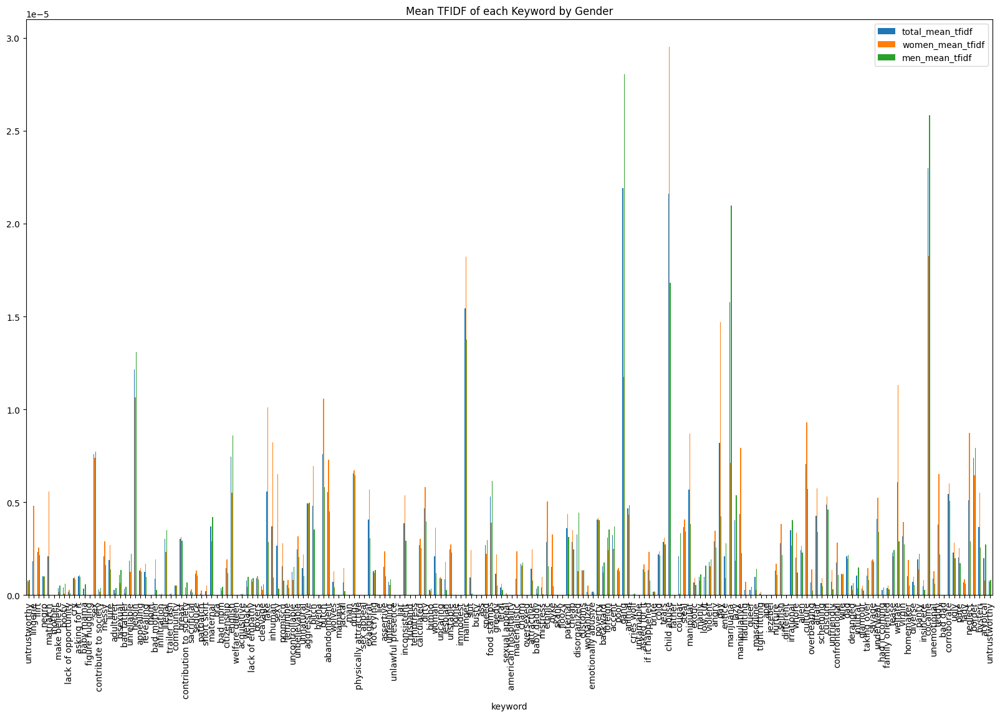

In [94]:
summary_keyword_vals[['keyword','total_mean_tfidf',
       'women_mean_tfidf', 'men_mean_tfidf']].plot(x='keyword',
        kind='bar',
        stacked=False,
        title='Mean TFIDF of each Keyword by Gender', figsize=(20, 12))

<Axes: title={'center': 'Mean TFIDF of each Keyword by Gender for Codefendant Match sample'}, xlabel='keyword'>

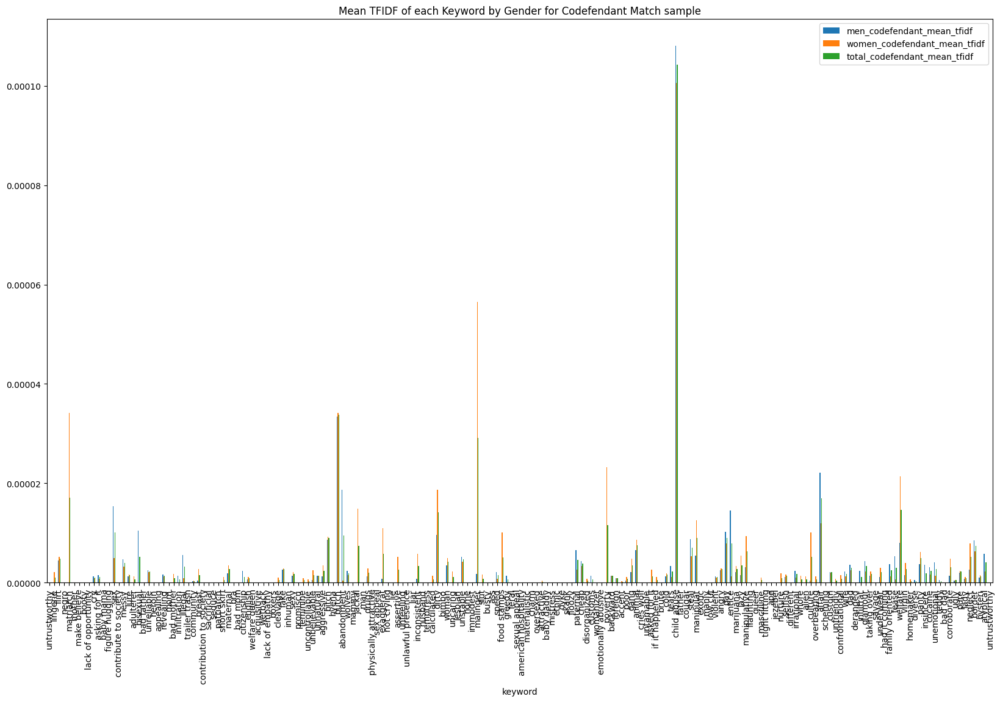

In [95]:
summary_keyword_vals[['keyword','men_codefendant_mean_tfidf',
       'women_codefendant_mean_tfidf', 'total_codefendant_mean_tfidf']].plot(x='keyword',
        kind='bar',
        stacked=False,
        title='Mean TFIDF of each Keyword by Gender for Codefendant Match sample', figsize=(20, 12))


In [98]:
excuded = {'make believe', 'booty', 'lack of opportunity', 'baby mama', 'figure hugging', 'contribute to society', 'adulterer', 'bisexual', 'bad father', 'infiltration', 'trailer trash', 'contribution to society', 'sacrificial', 'patriarch', 'short skirt', 'bad mom', 'welfare queen', 'acquisitive', 'wetback', 'cleavage', 'hyena', 'wolves', 'mammy', 'jackal', 'physically attractive', 'sex appeal', 'unfeeling', 'unlawful presence', 'temptress', 'bimbo', 'lesbian', 'immodest', 'busty', 'feral', 'sexual appeal', 'american hospitality', 'oversexed', 'baby daddy', 'mistress', 'dyke', 'skank', 'floozy', 'womanizer', 'emotionally abusive', 'cries wolf', 'untamable', 'brute', 'low cut', 'flaunting', 'queer', 'tight fitting', 'jezebel', 'overbearing', 'deranged', 'infiltrat', 'glamour', 'had it coming', 'family oriented', 'insincere', 'bad dad'}

In [127]:
summary_keyword_vals

,Unnamed: 0,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k,total_sum_raw_wordcount,women_sum_raw_wordcount,men_sum_raw_wordcount,total_mean_tfidf,...,men_mean_MenOnlytfidf,men_codefendant_mean_tfidf,women_codefendant_mean_tfidf,total_codefendant_mean_tfidf,men_l2match_mean_tfidf,women_l2match_mean_tfidf,total_l2matcht_mean_tfidf,men_national_mean_tfidf,women_national_mean_tfidf,total_national_mean_tfidf
0,0,untrustworthy,11,3,1,7,22,12,10,7.812451e-07,...,8.955616e-07,0.000000,0.000000,0.000000,0.000000,5.490631e-07,2.583826e-07,0.000001,4.935481e-07,9.417569e-07
1,1,lingerie,9,0,20,0,29,29,0,1.807143e-06,...,0.000000e+00,0.000000,0.000002,0.000001,0.000000,5.174249e-07,2.434941e-07,0.000000,5.793487e-06,2.558163e-06
2,2,flirt,62,21,5,19,107,67,40,2.309586e-06,...,2.313220e-06,0.000004,0.000005,0.000005,0.000002,5.388971e-06,3.468349e-06,0.000002,2.721057e-06,2.327926e-06
3,3,negro,6,9,1,6,22,7,15,1.009209e-06,...,9.918854e-07,0.000000,0.000000,0.000000,0.000000,1.089923e-07,5.129052e-08,0.000001,4.713927e-07,7.824972e-07
4,4,matriarch,5,0,24,0,29,29,0,2.102950e-06,...,0.000000e+00,0.000000,0.000034,0.000017,0.000000,9.666297e-06,4.548846e-06,0.000000,6.434974e-06,2.841417e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,neglect,200,117,196,137,650,396,254,5.095892e-06,...,3.870872e-06,0.000003,0.000008,0.000005,0.000002,9.359013e-06,5.368365e-06,0.000003,7.706282e-06,4.925927e-06
186,186,border,372,623,182,334,1511,554,957,7.373084e-06,...,7.809171e-06,0.000009,0.000006,0.000007,0.000009,1.090374e-05,1.013399e-05,0.000009,7.556392e-06,8.204481e-06
187,187,hysteri,158,65,57,52,332,215,117,3.672810e-06,...,4.093522e-06,0.000001,0.000002,0.000001,0.000003,4.496298e-06,3.569225e-06,0.000003,6.114473e-06,4.263446e-06
188,188,atypical,13,60,1,15,89,14,75,2.001455e-06,...,2.425983e-06,0.000006,0.000002,0.000004,0.000003,7.988197e-07,2.137260e-06,0.000004,8.170851e-07,2.513291e-06


In [119]:
k =summary_keyword_vals[~summary_keyword_vals['keyword'].isin(excuded)]['keyword'].to_list()

keywords = [k[i:i + 26] for i in range(0, len(k), 52)]


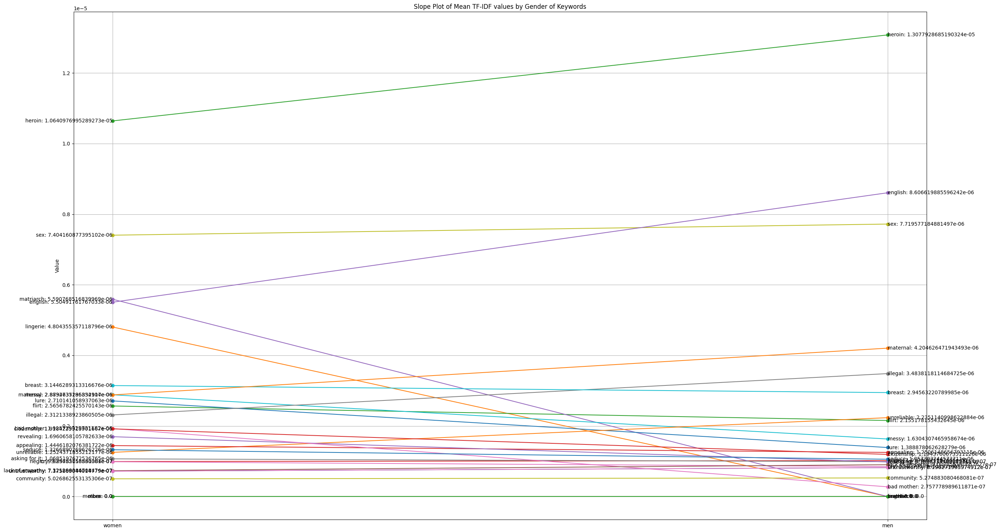

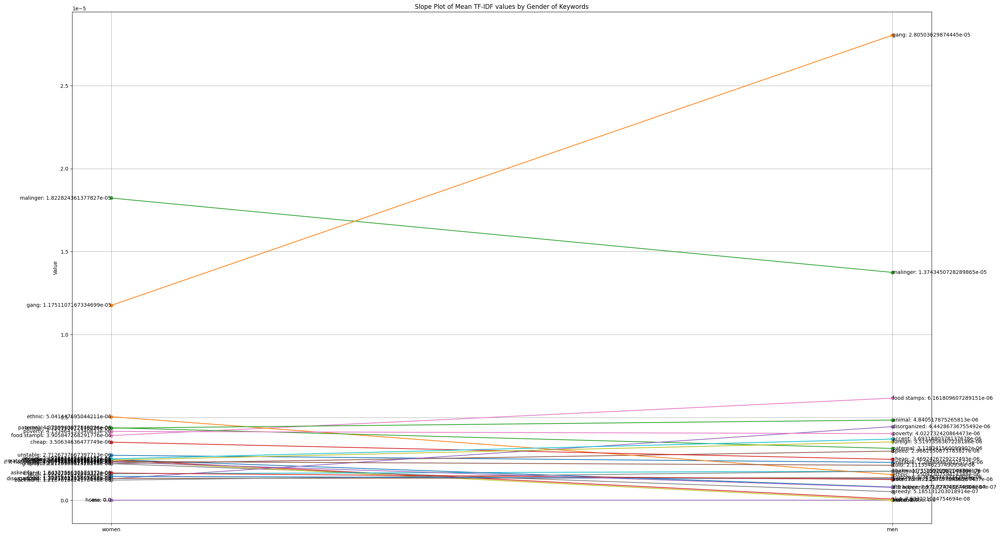

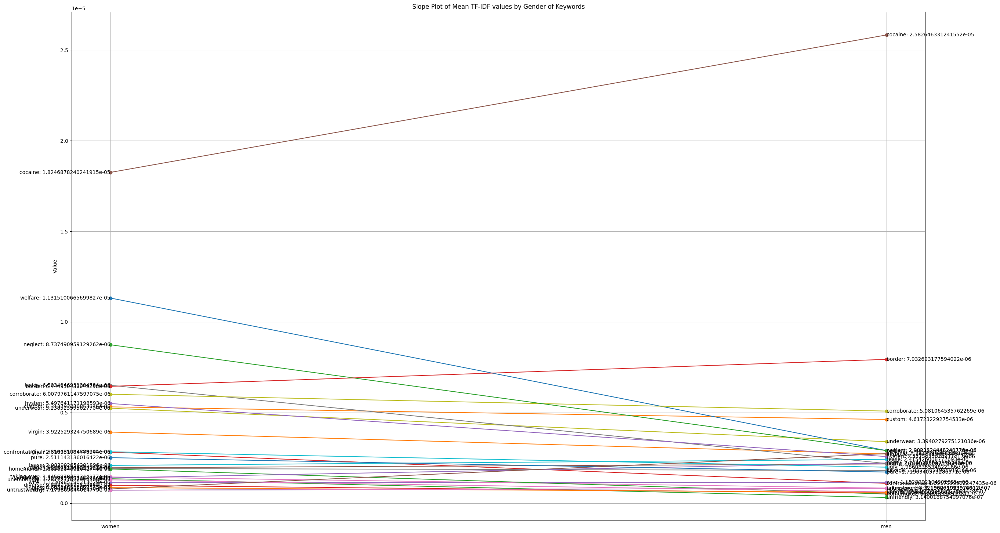

In [120]:
for keyword_sublist in keywords:
  data = summary_keyword_vals[['keyword',
       'women_mean_tfidf', 'men_mean_tfidf']]
  data = data[~data['keyword'].isin(excuded)]
  data = data[data['keyword'].isin(keyword_sublist)]

  df = pd.DataFrame(data)

  plt.figure(figsize=(30, 18))

  for index, row in df.iterrows():
      plt.plot([0, 1], [row['women_mean_tfidf'], row['men_mean_tfidf']], marker='o', label=row['keyword'])
      plt.text(0, row['women_mean_tfidf'], f"{row['keyword']}: {row['women_mean_tfidf']}", ha='right', va='center')
      plt.text(1, row['men_mean_tfidf'], f"{row['keyword']}: {row['men_mean_tfidf']}", ha='left', va='center')

  plt.xticks([0, 1], ['women', 'men'])
  plt.ylabel('Value')
  plt.title('Slope Plot of Mean TF-IDF values by Gender of Keywords')
  plt.grid(True)
  plt.show()

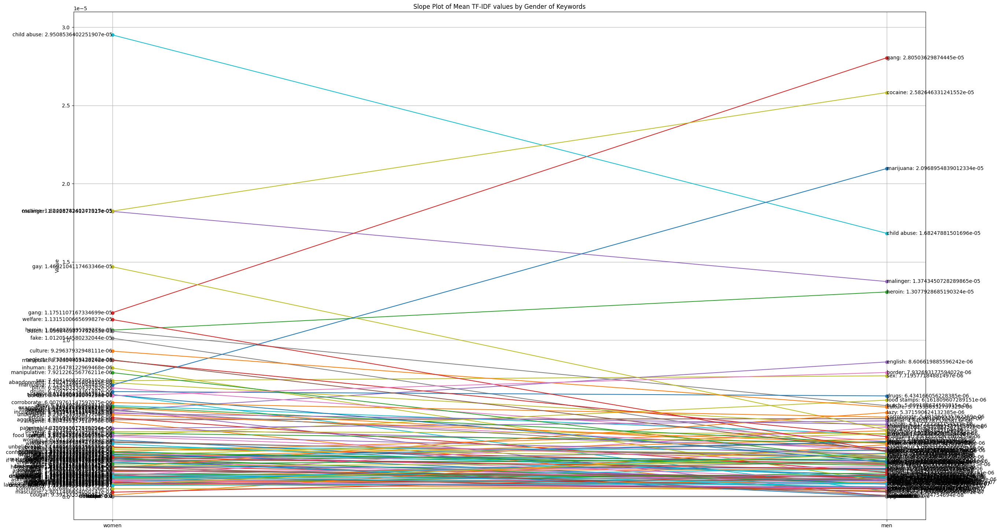

In [103]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample Data
data = summary_keyword_vals[['keyword',
       'women_mean_tfidf', 'men_mean_tfidf']]
data = data[~data['keyword'].isin(excuded)]

df = pd.DataFrame(data)

plt.figure(figsize=(30, 18))

for index, row in df.iterrows():
    plt.plot([0, 1], [row['women_mean_tfidf'], row['men_mean_tfidf']], marker='o', label=row['keyword'])
    plt.text(0, row['women_mean_tfidf'], f"{row['keyword']}: {row['women_mean_tfidf']}", ha='right', va='center')
    plt.text(1, row['men_mean_tfidf'], f"{row['keyword']}: {row['men_mean_tfidf']}", ha='left', va='center')

plt.xticks([0, 1], ['women', 'men'])
plt.ylabel('Value')
plt.title('Slope Plot of Mean TF-IDF values by Gender of Keywords')
plt.grid(True)
plt.show()

#Top 20 Keywords with highest Mean TFIDF and Mean Raw Counts

Raw word counts overall

Women only raw word counts

Men only raw word counts

Overall TF-IDF (most significant words in our corpus)

Women only TF-IDF (most significant words in women only corpus)

Men only TF-IDF (most significant in men only corpus)


In [ ]:
g = raw_counts.groupby('keyword', sort=True)['raw_keyword_count'].mean().nlargest(20)
g

,raw_keyword_count
keyword,
lie,787.899083
man,723.366972
ass,621.917431
ape,299.908257
bra,241.633028
different,224.761468
home,206.091743
mother,164.678899
mom,156.055046


In [ ]:
raw_counts[raw_counts['gender']=='woman'].groupby('keyword', sort=True)['raw_keyword_count'].mean().nlargest(20)


,raw_keyword_count
keyword,
lie,1064.536585
man,938.731707
ass,694.121951
ape,399.780488
home,299.780488
different,282.804878
mother,245.341463
bra,235.097561
mom,226.926829


In [ ]:
raw_counts[raw_counts['gender']=='man'].groupby('keyword', sort=True)['raw_keyword_count'].mean().nlargest(20)


,raw_keyword_count
keyword,
lie,621.102941
man,593.514706
ass,578.382353
bra,245.573529
ape,239.691176
different,189.764706
home,149.602941
mother,116.044118
mom,113.323529


In [ ]:
raw_counts[raw_counts['gender']=='woman'].groupby('keyword', sort=True)['women_only_tfidf_11_25'].mean().nlargest(20)


,women_only_tfidf_11_25
keyword,
child abuse,0.000022
cocaine,0.000017
malinger,0.000017
gay,0.000015
gang,0.000013
heroin,0.000011
marijuana,0.000011
drugs,0.000011
butch,0.000009


In [ ]:
raw_counts[raw_counts['gender']=='man'].groupby('keyword', sort=True)['men_only_tfidf_11_25'].mean().nlargest(20)


,men_only_tfidf_11_25
keyword,
gang,0.000027
cocaine,0.000027
child abuse,0.000020
marijuana,0.000015
malinger,0.000014
heroin,0.000013
english,0.000009
sex,0.000008
border,0.000008


In [ ]:

raw_counts['overall_tfidf_11_25'] = raw_counts['overall_tfidf_11_25'].astype(float)
raw_counts.groupby('keyword', sort=True)['overall_tfidf_11_25'].mean().nlargest(20)


,overall_tfidf_11_25
keyword,
cocaine,0.000023
gang,0.000022
child abuse,0.000022
marijuana,0.000016
malinger,0.000015
heroin,0.000012
gay,0.000008
sex,0.000008
butch,0.000008


In [ ]:
raw_counts['overall_tfidf_11_25'] = raw_counts['overall_tfidf_11_25'].astype(float)

raw_counts[raw_counts['gender']=='woman'].groupby('keyword', sort=True)['overall_tfidf_11_25'].mean().nlargest(20)


,overall_tfidf_11_25
keyword,
child abuse,0.000030
cocaine,0.000018
malinger,0.000018
gay,0.000015
gang,0.000012
welfare,0.000011
heroin,0.000011
butch,0.000011
fake,0.000010


In [ ]:
raw_counts[raw_counts['gender']=='man'].groupby('keyword', sort=True)['overall_tfidf_11_25'].mean().nlargest(20)


,overall_tfidf_11_25
keyword,
gang,0.000028
cocaine,0.000026
marijuana,0.000021
child abuse,0.000017
malinger,0.000014
heroin,0.000013
english,0.000009
border,0.000008
sex,0.000008


In [ ]:
raw_counts[raw_counts['gender']=='woman'].groupby('keyword', sort=True)['overall_tfidf_11_25'].mean().nlargest(20)


,overall_tfidf_11_25
keyword,
child abuse,0.000030
cocaine,0.000018
malinger,0.000018
gay,0.000015
gang,0.000012
welfare,0.000011
heroin,0.000011
butch,0.000011
fake,0.000010


In [ ]:
raw_counts

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,co_defendant_match,race_state_crime_match,word_count,unique_word_count,doc_word_count,doc_unique_word_count,term_frequency,women_only_tfidf_11_24,men_only_tfidf_11_24,overall_tfidf_11_24
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,True,1078612,26789,1078612,26789,0.000000,0.000000,0.000000,0.000000
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,False,True,1078612,26789,1078612,26789,0.000028,0.000037,0.000000,0.000041
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,False,True,1078612,26789,1078612,26789,0.000000,0.000000,0.000000,0.000000
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,True,1078612,26789,1078612,26789,0.000000,0.000000,0.000000,0.000000
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,True,1078612,26789,1078612,26789,0.000453,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,...,False,True,920115,30899,920115,30899,0.000004,0.000000,0.000002,0.000001
20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,...,False,True,920115,30899,920115,30899,0.000073,0.000000,0.000020,0.000020
20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,...,False,True,920115,30899,920115,30899,0.000000,0.000000,0.000000,0.000000
20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,...,False,True,920115,30899,920115,30899,0.000002,0.000000,0.000003,0.000003


#Findings from Overall Mean TF-IDF comparison with Themes


*   Discredit higher for women than men
*   Gender and sexuality theme higher for women than men
* hypersexualizing keywords slightly higher for women than men

* general racial tropes higher for men than women




/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


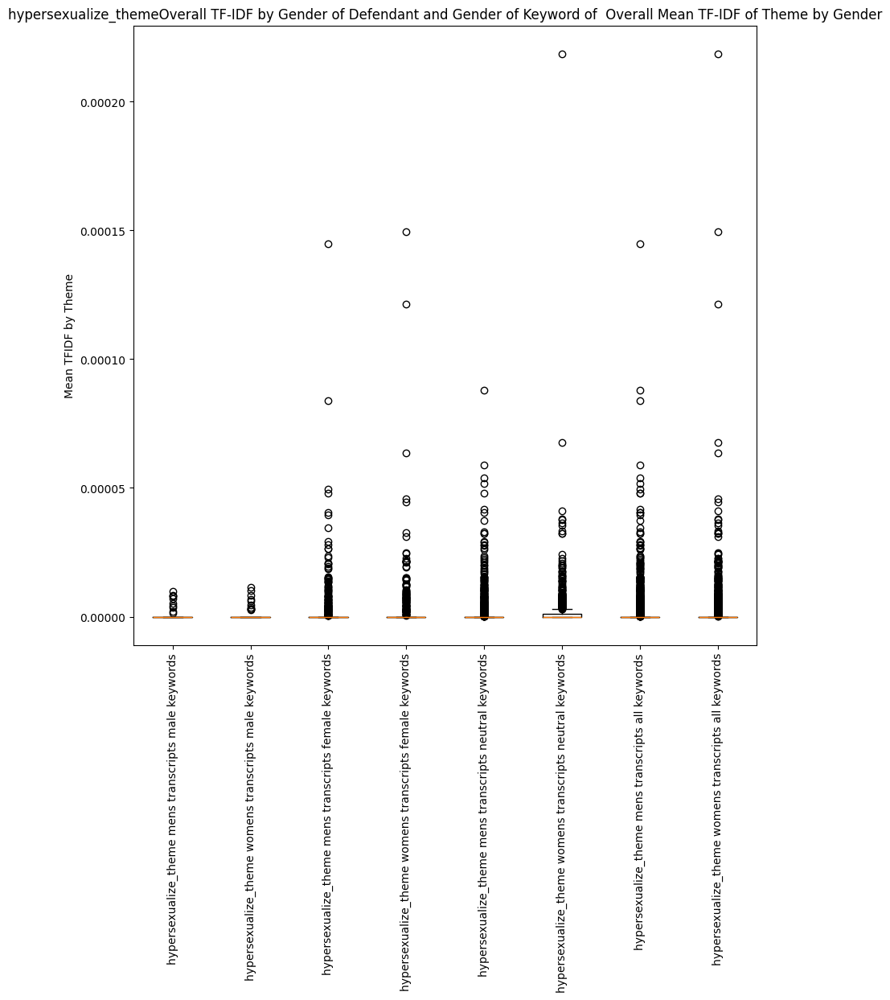

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


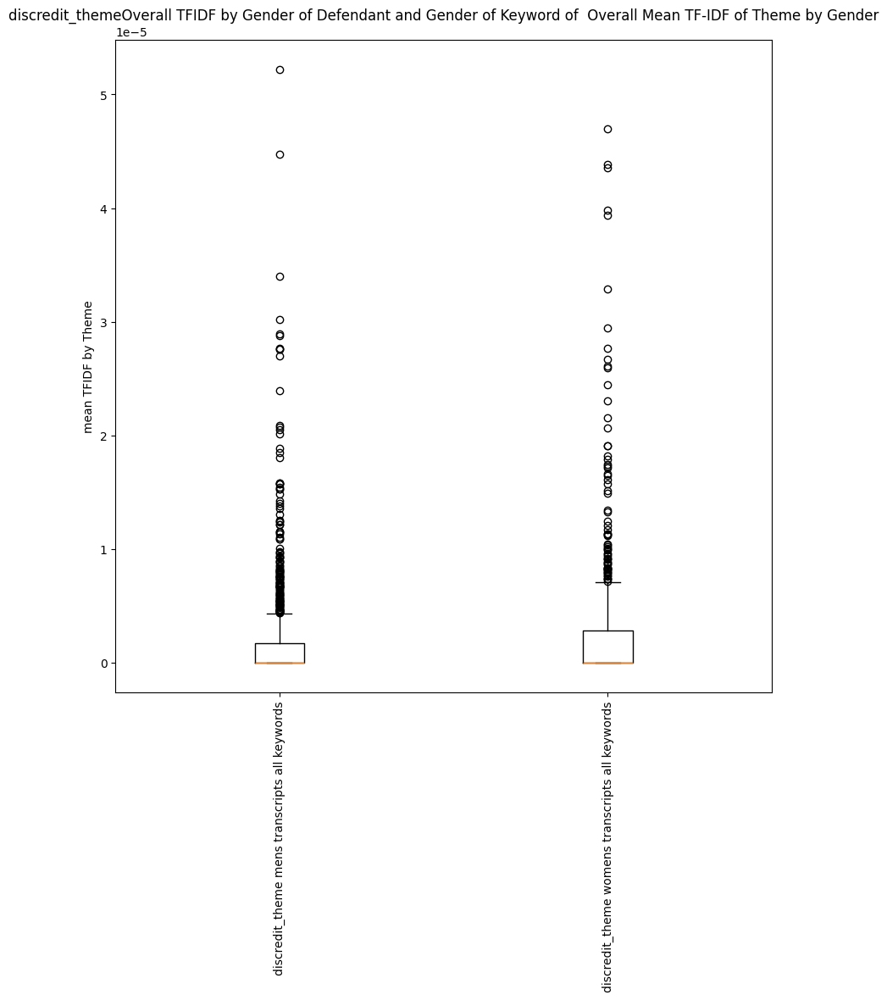

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


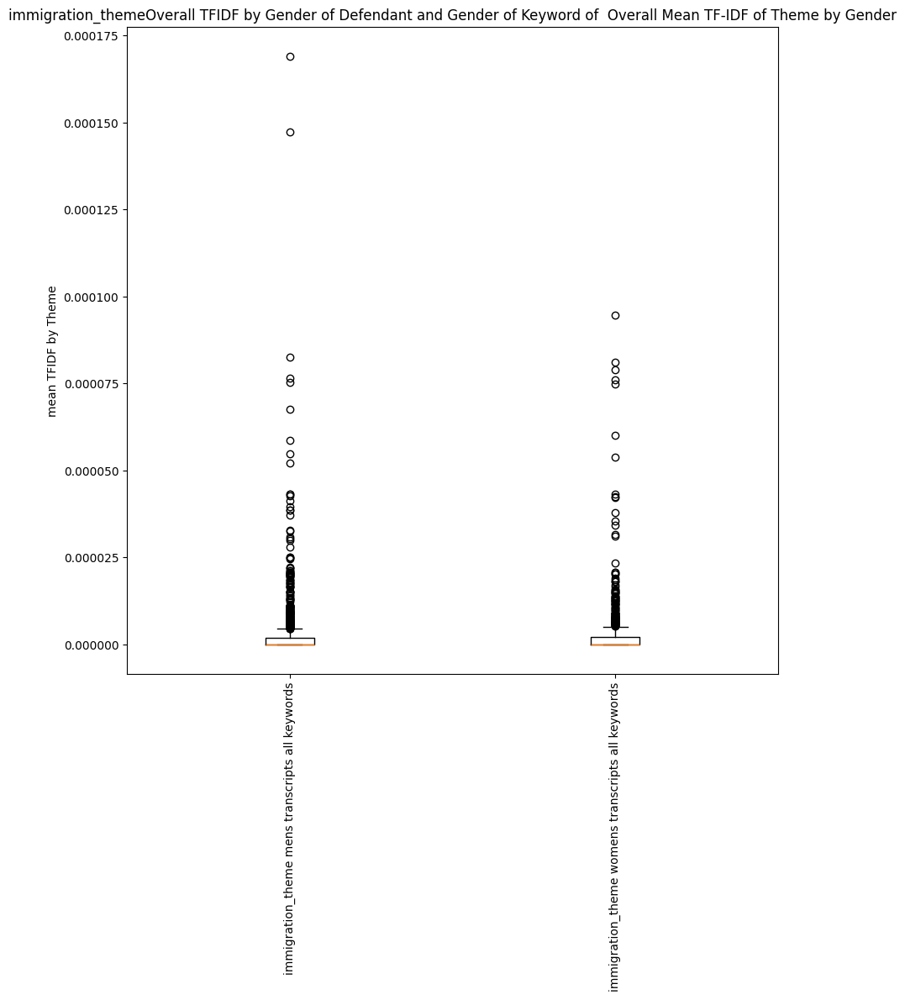

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


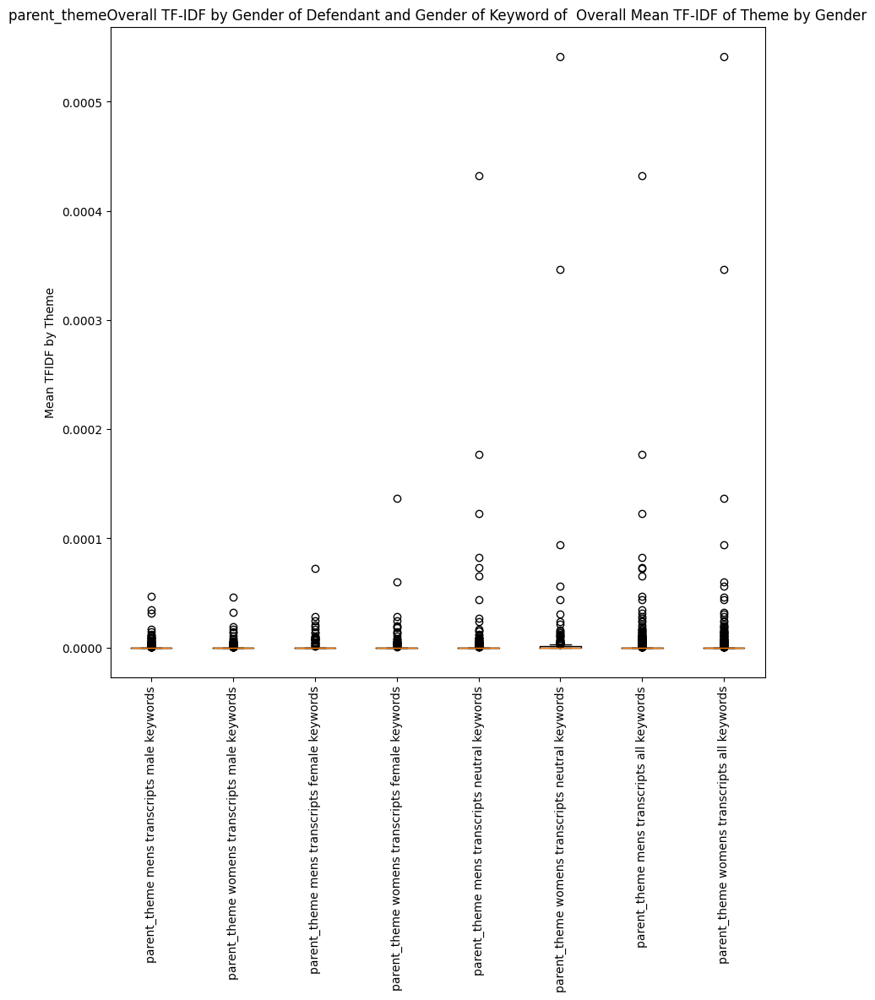

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


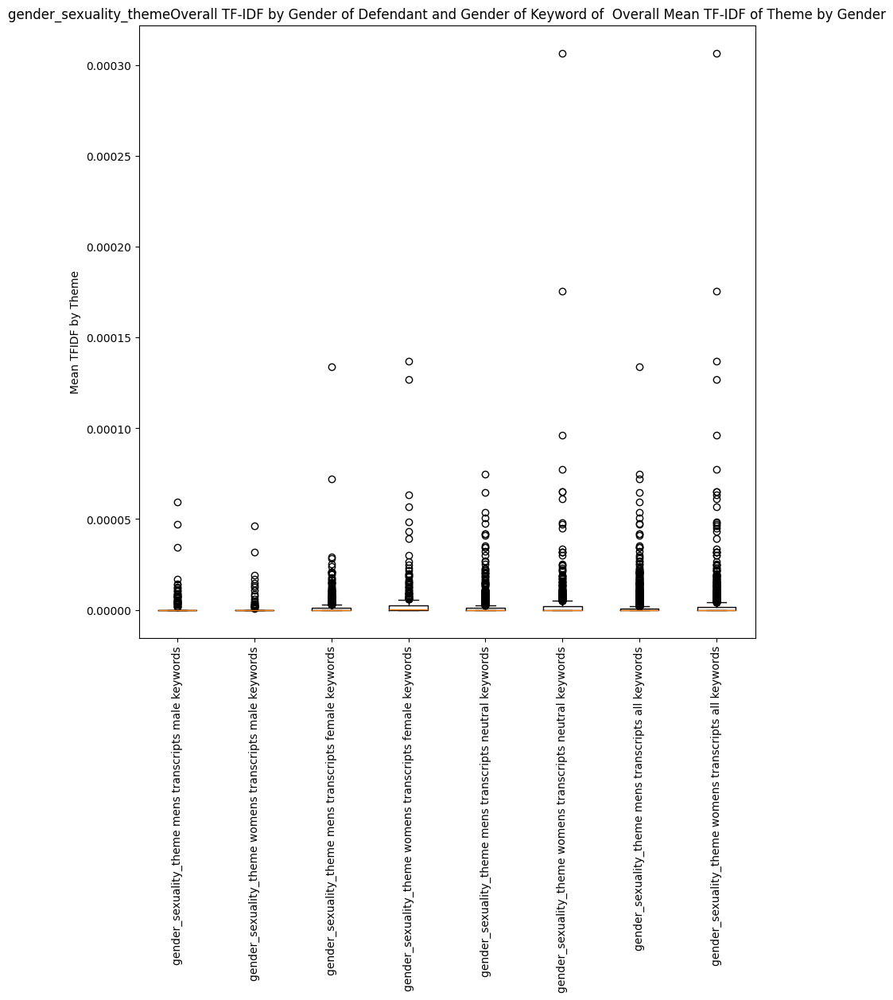

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


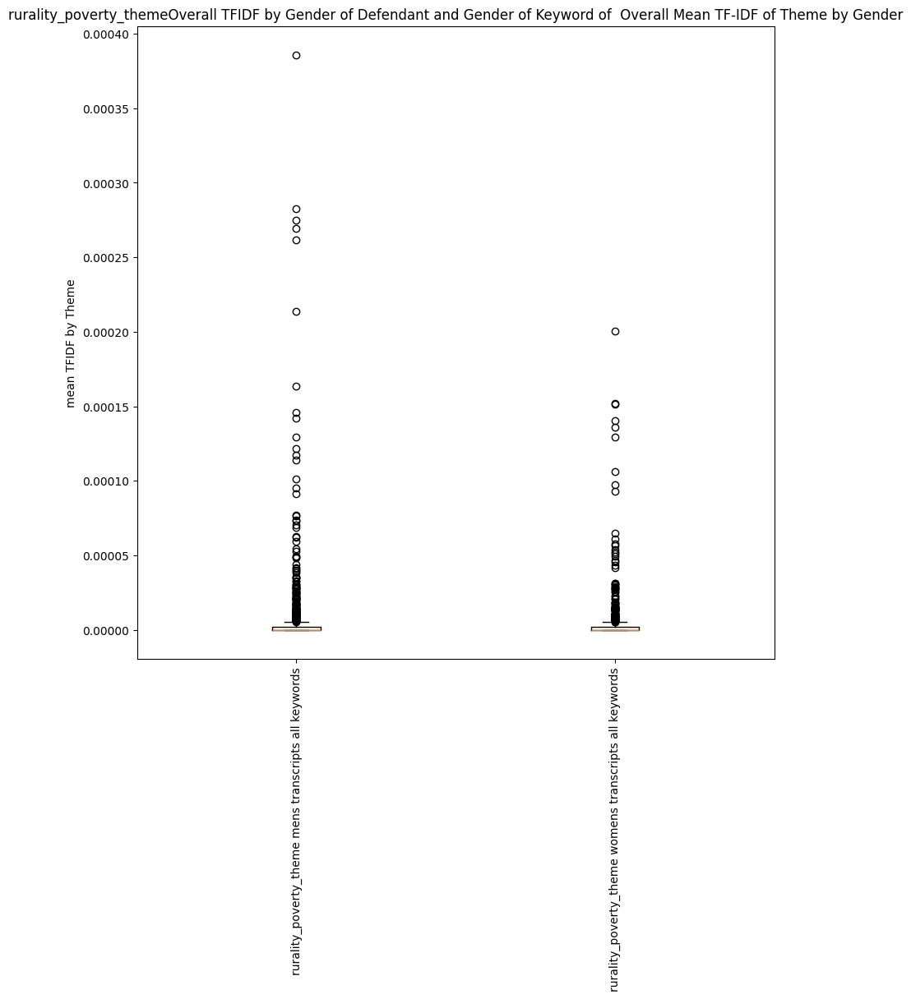

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


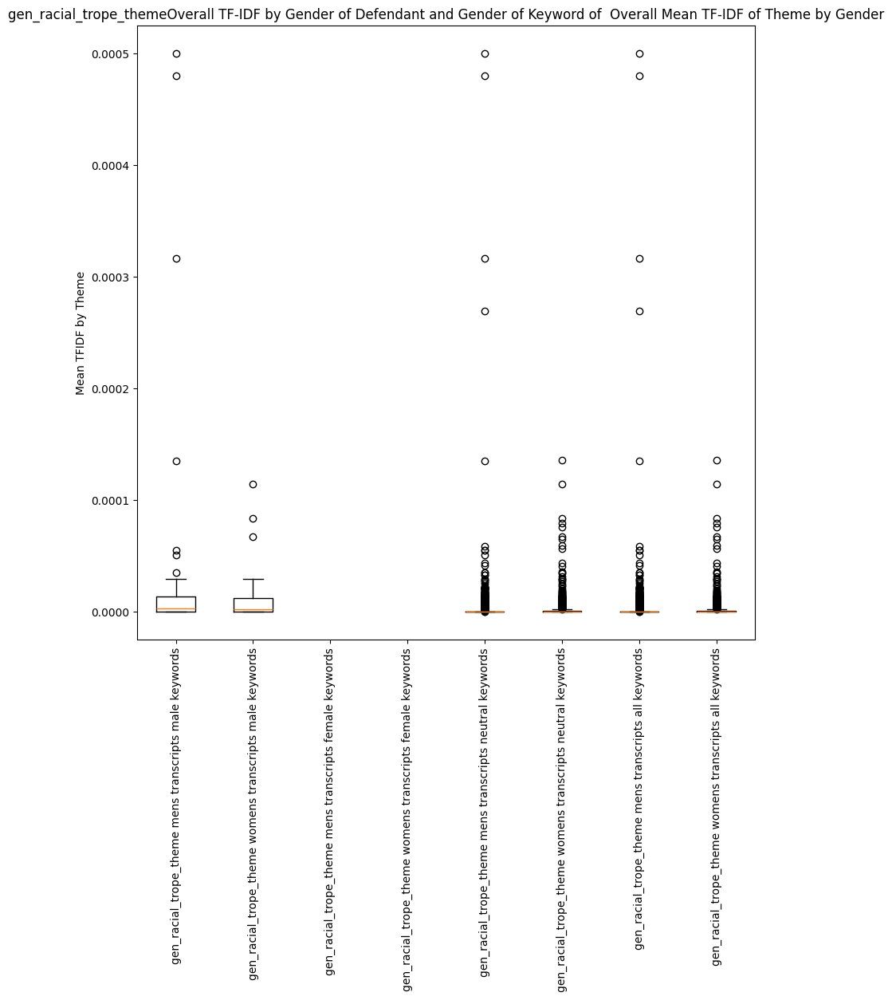

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


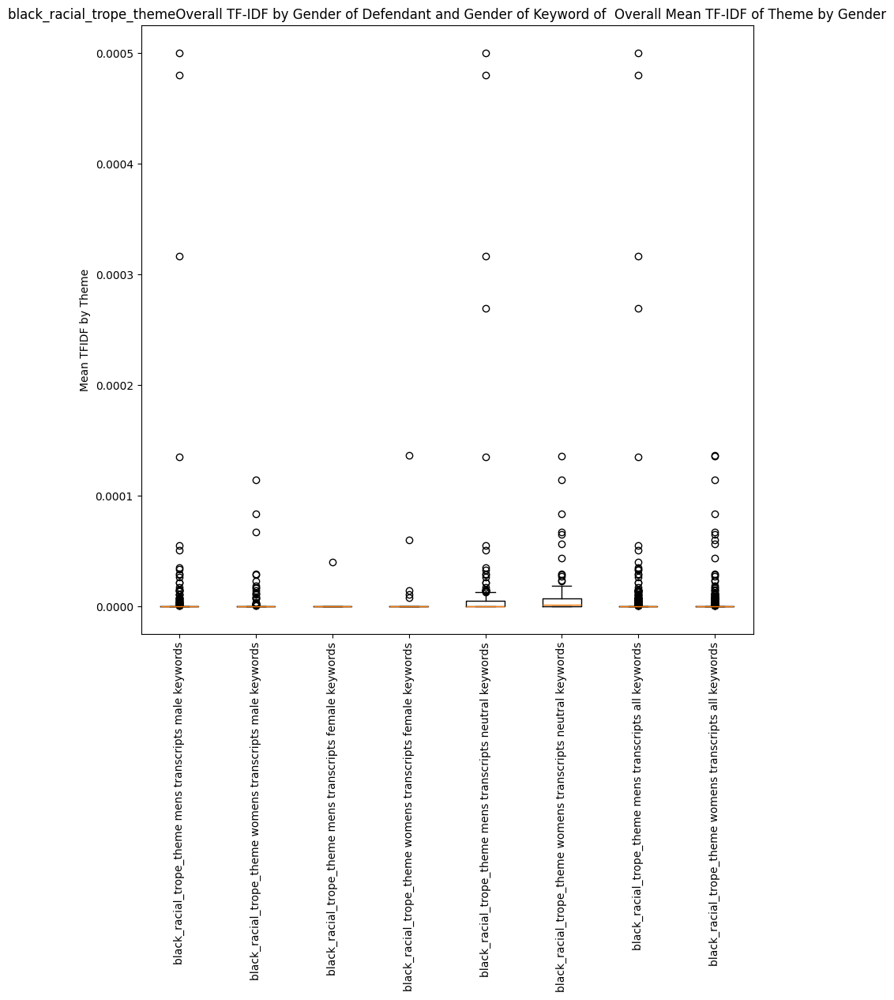

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


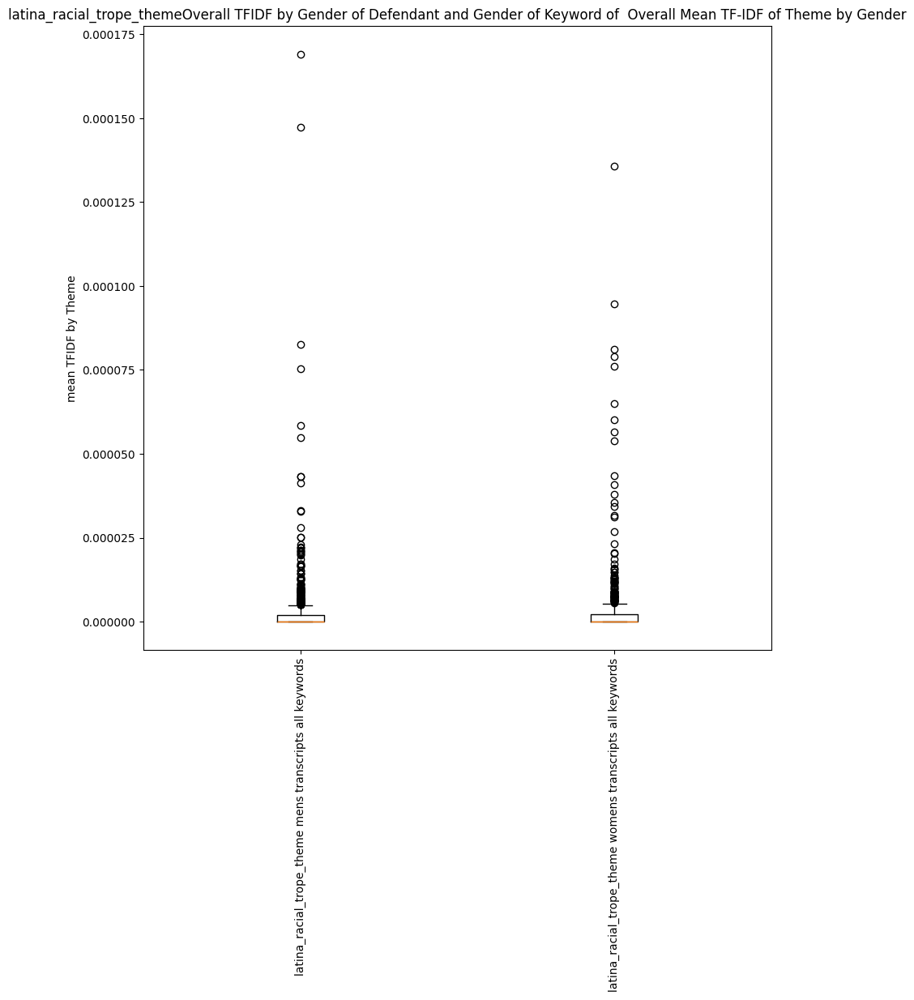

In [126]:
generate_boxplots( keyword_counts , theme_types, 'overall_tfidf_11_25', ' Overall Mean TF-IDF of Theme by Gender' )


#Findings from Co-Defendant Matches with Themes




*   hypersexualize keywords higher for women
*   discrediting keywords higher for women
* gender and sexuality keywords higher for women
* rurality and poverty keywords higer for women
* general racial tropes higher for women
* black specific racial tropes much higher for women (follows intuitively, one pair include white male and black female codefendant, few black people in male codefendants)


Generate Boxplots of Raw and TF-IDF Counts

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


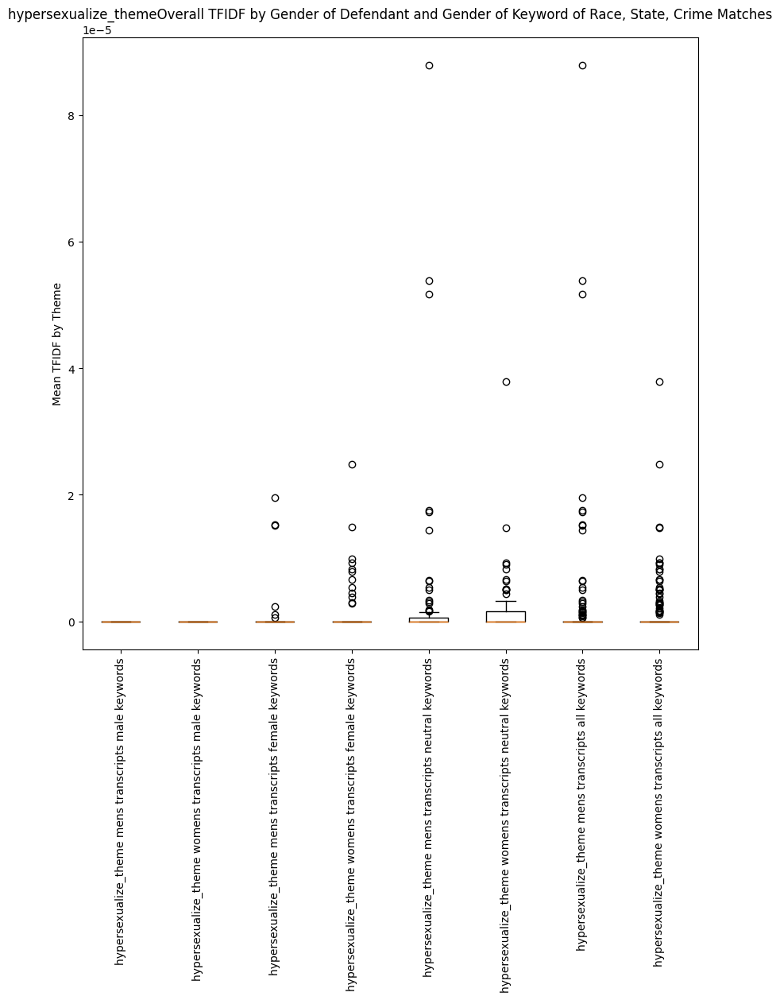

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


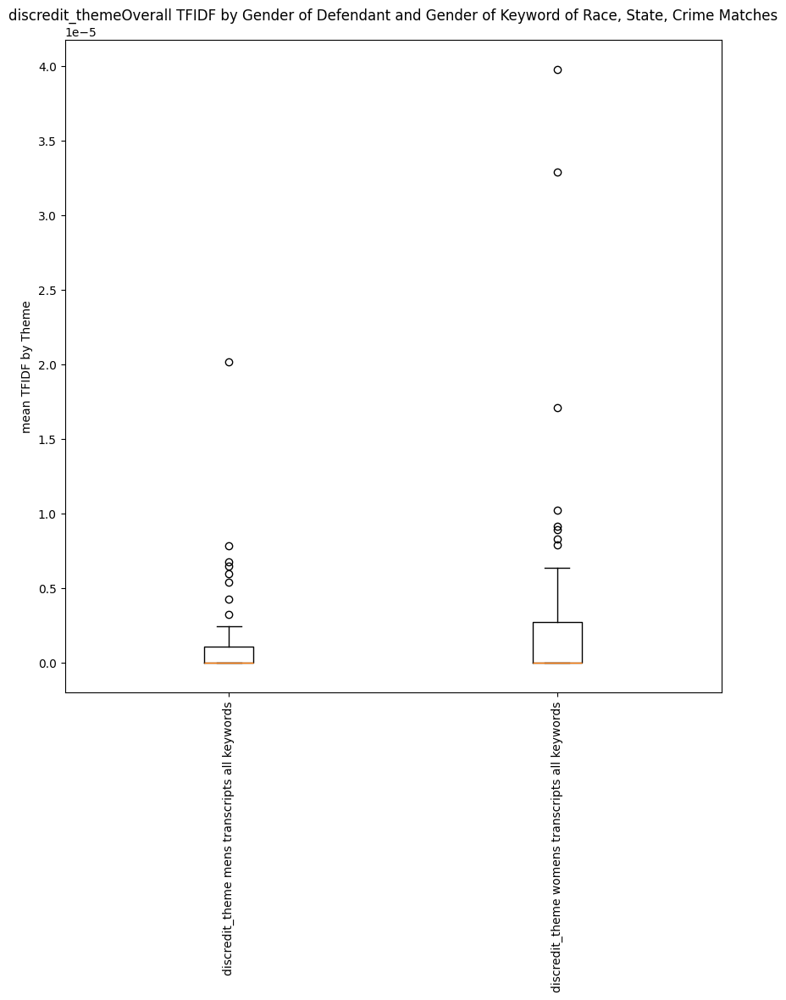

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


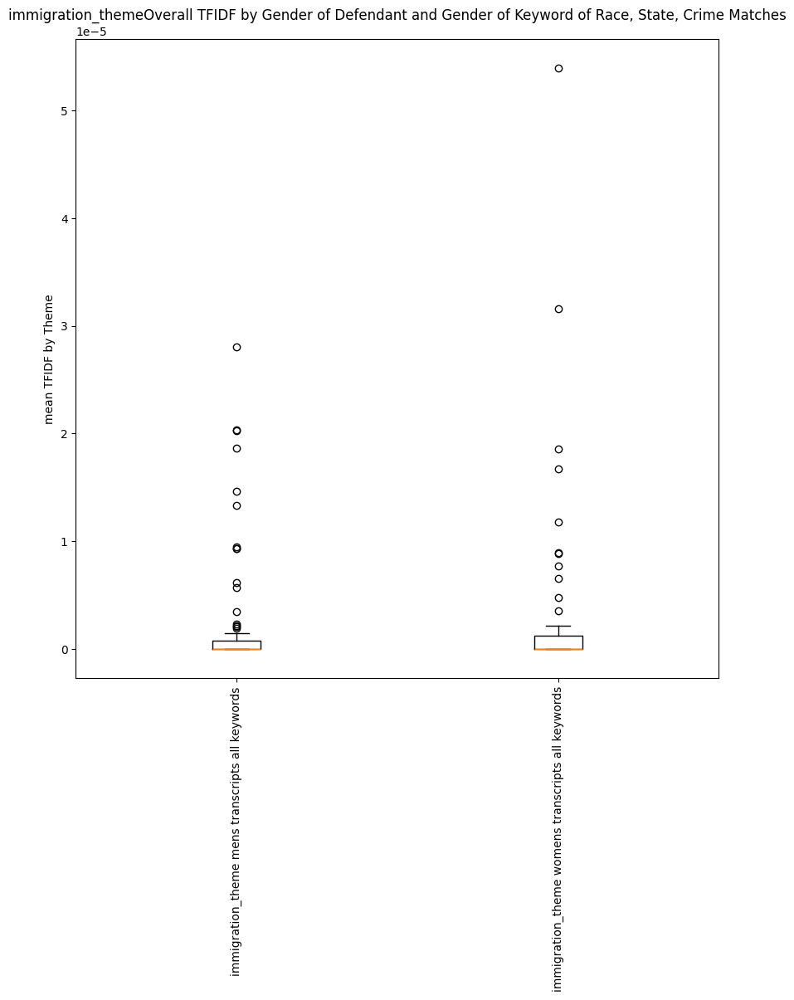

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


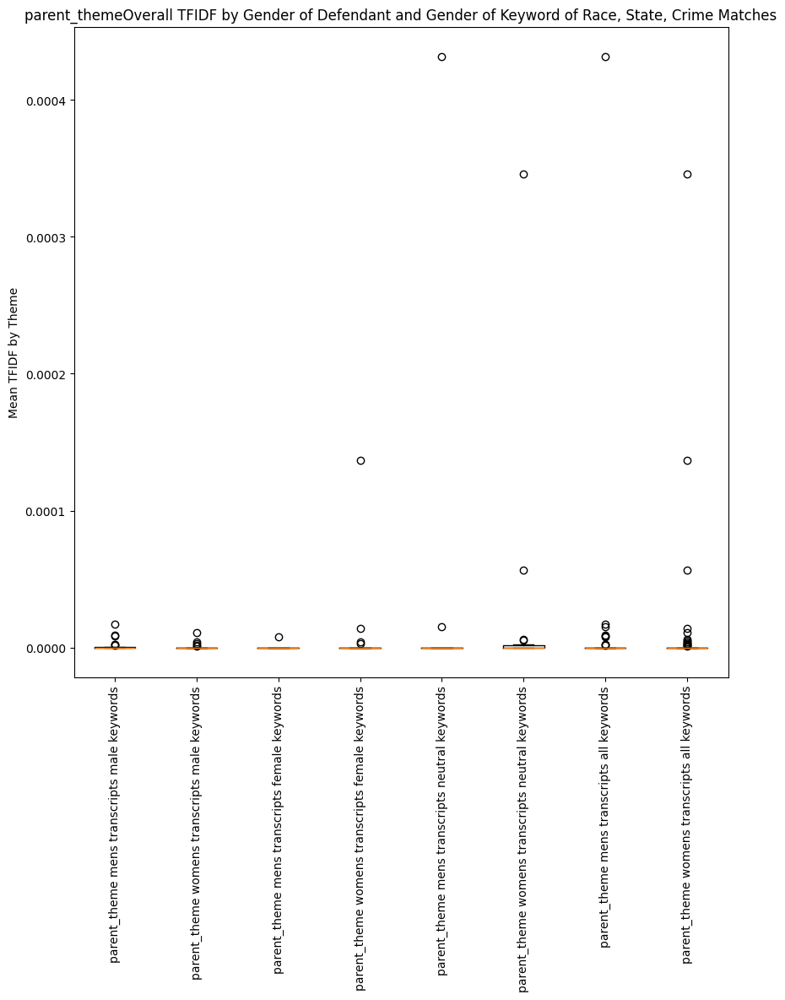

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


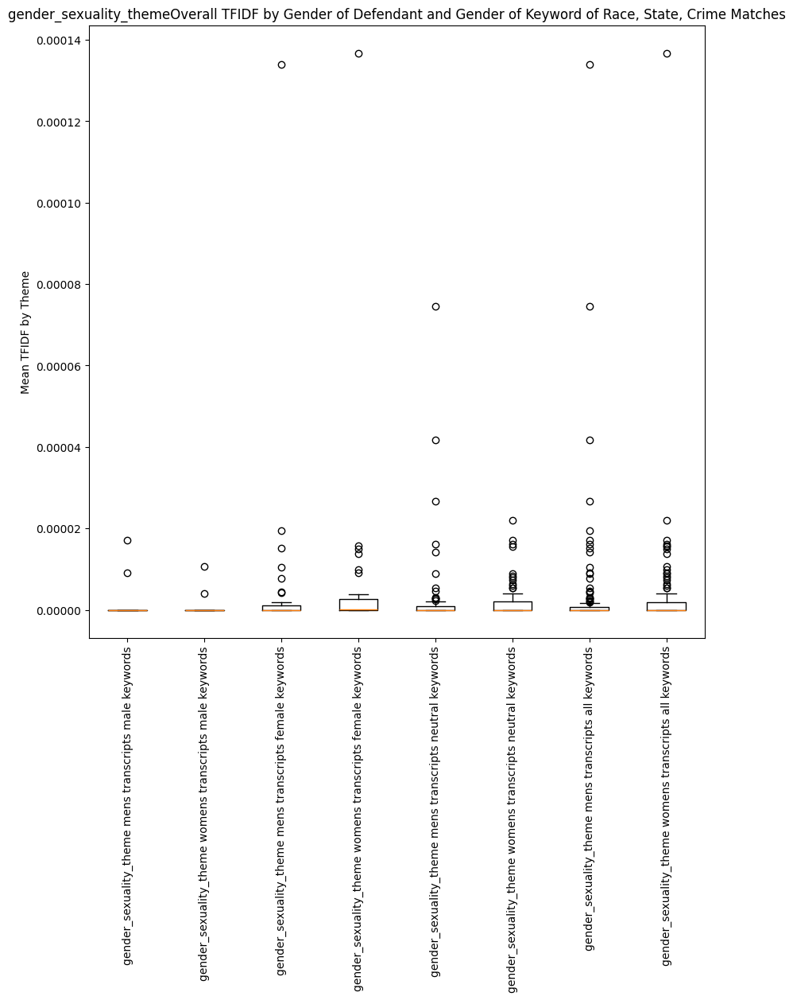

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


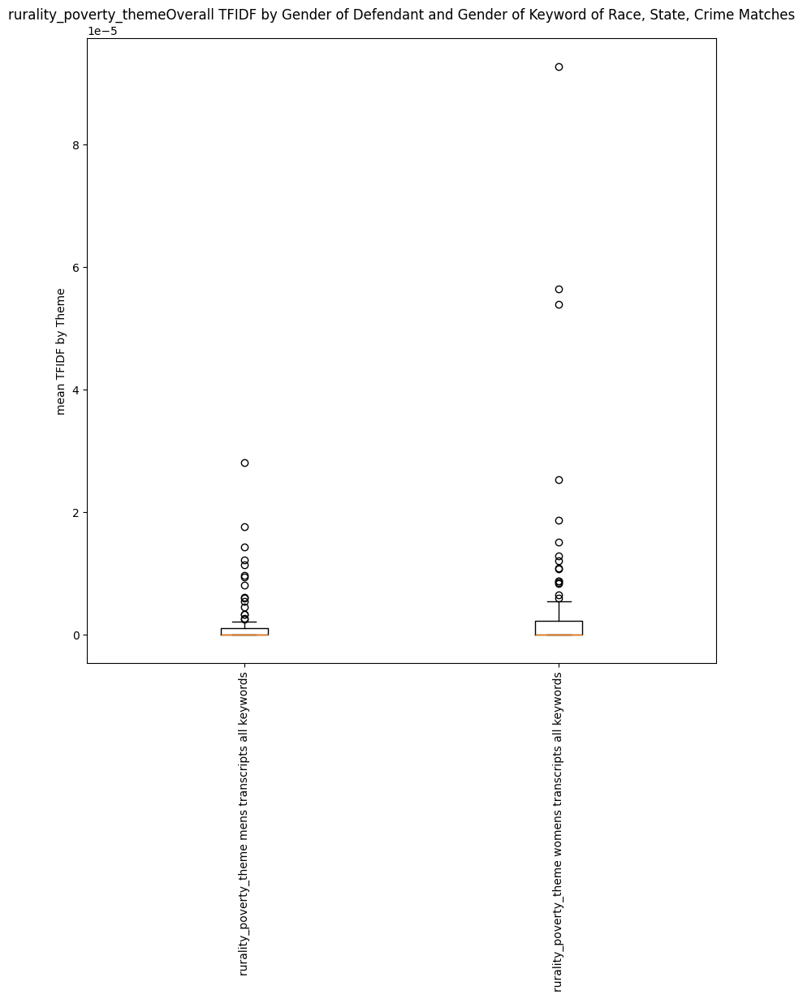

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


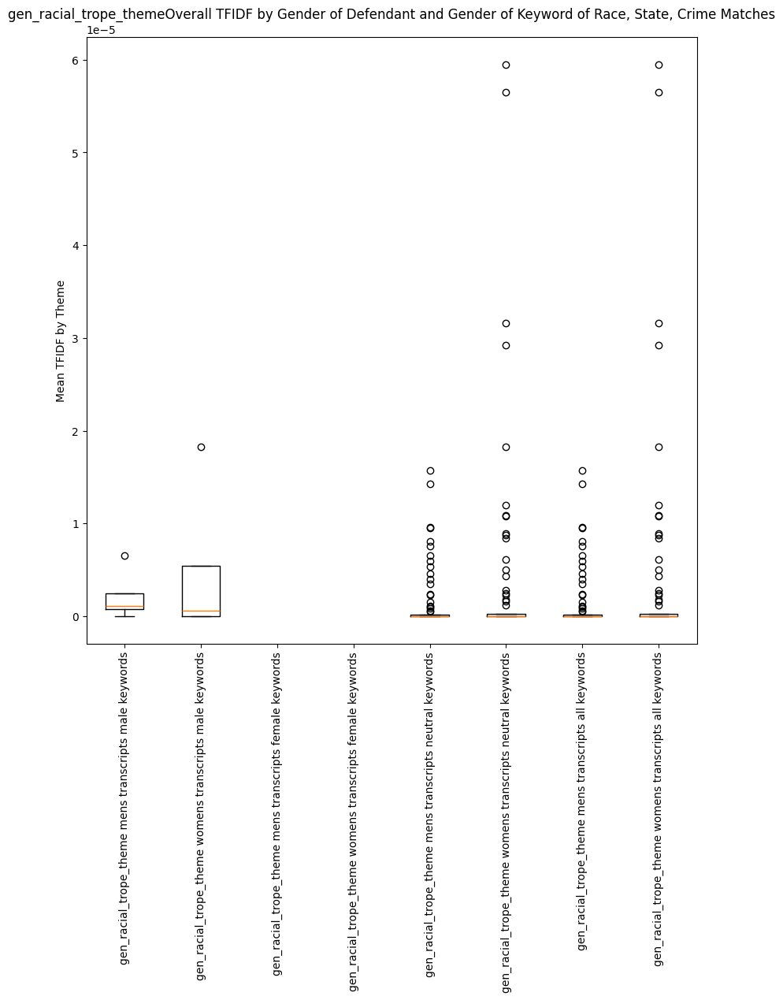

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


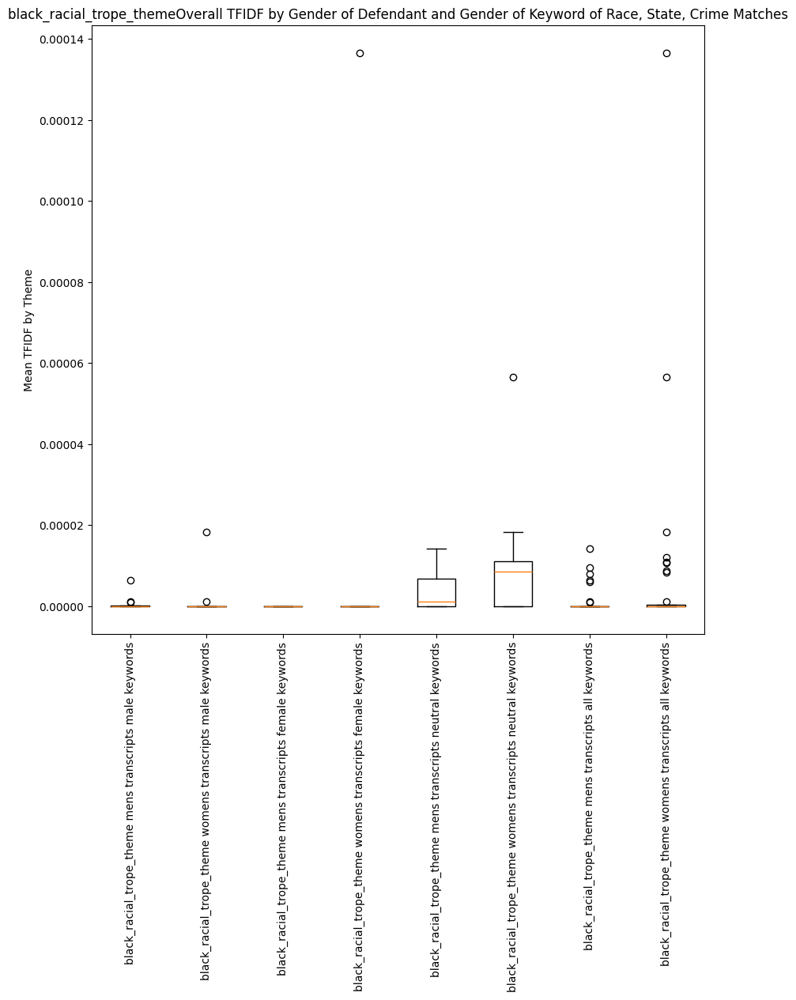

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


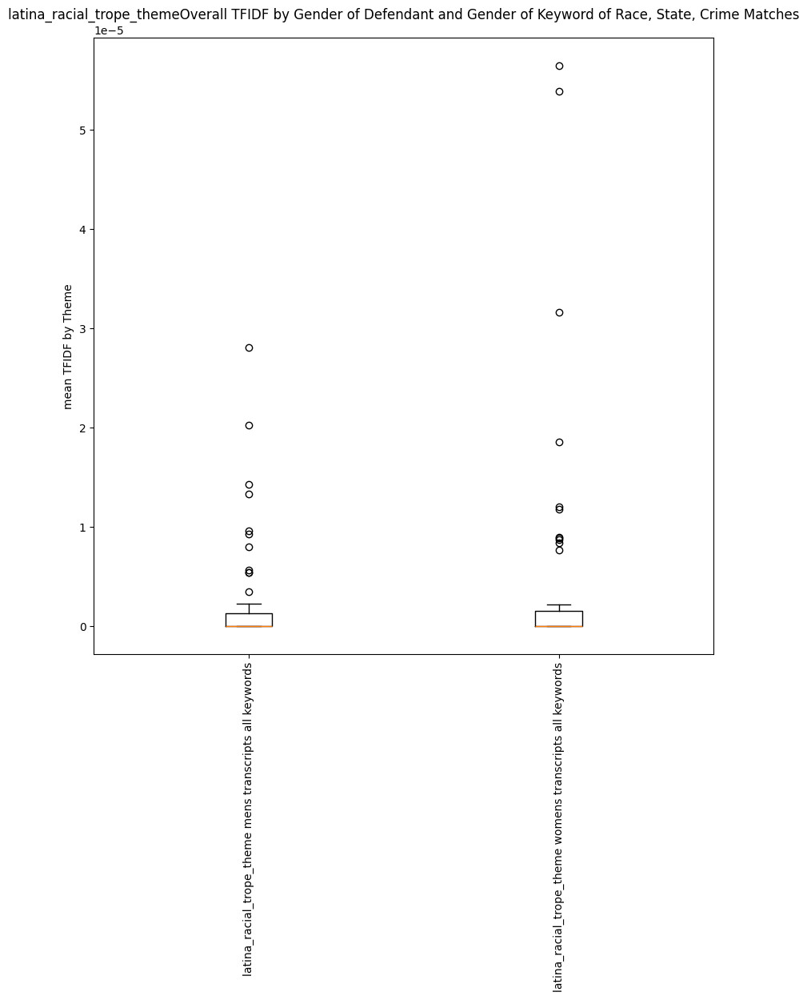

In [ ]:
generate_boxplots( raw_counts[raw_counts['co_defendant_match']== True] , theme_types, 'overall_tfidf_11_25', 'Race, State, Crime Matches')


#Findings from Race State and Crime Match with Themes



*   hypersexualizing keywords higher for women than men
*   discrediting keywords higher for women than men
* gender and sexuality keywords higher for women than men


* general racial tropes higher for men than women


/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


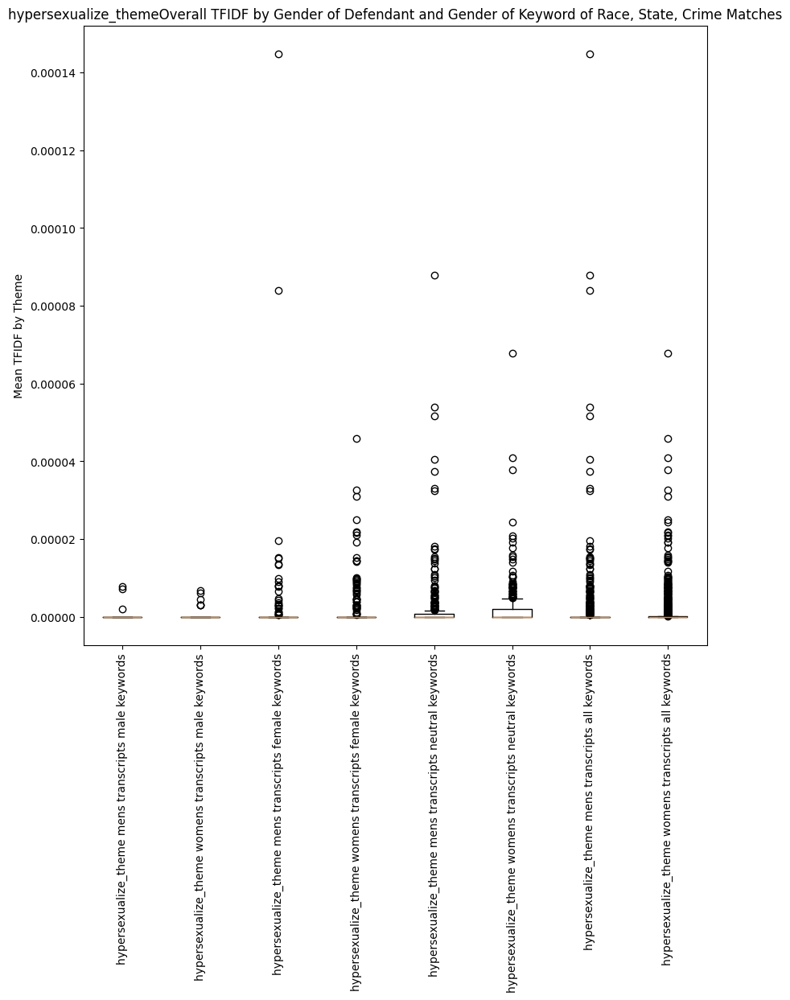

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


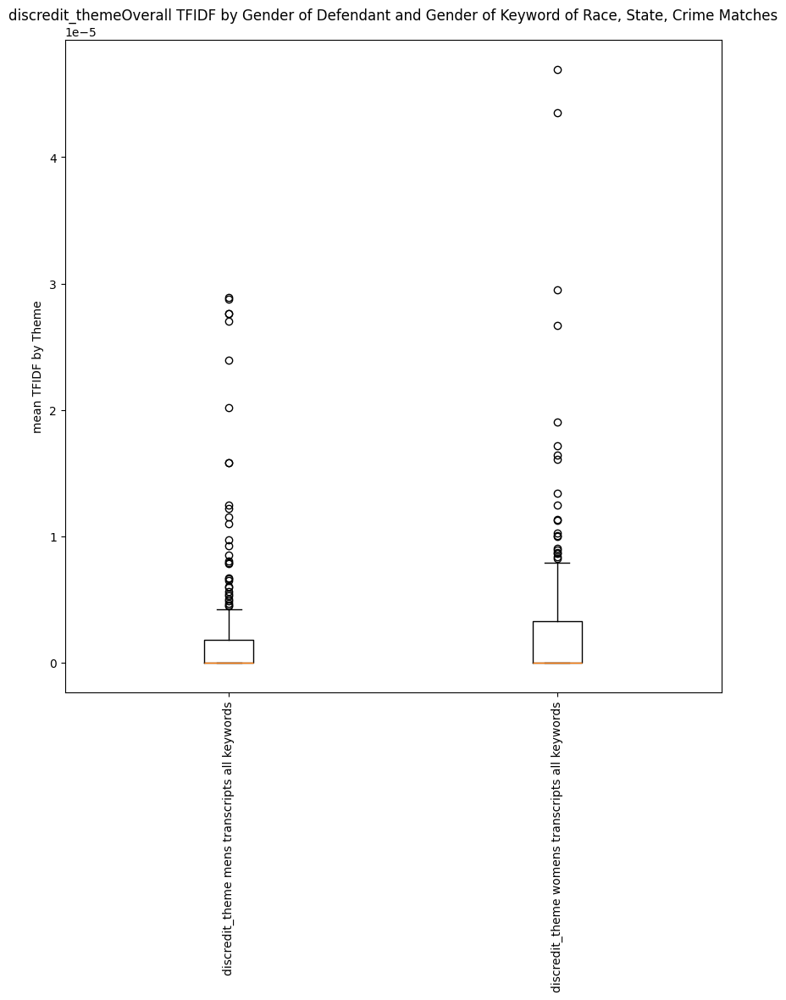

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


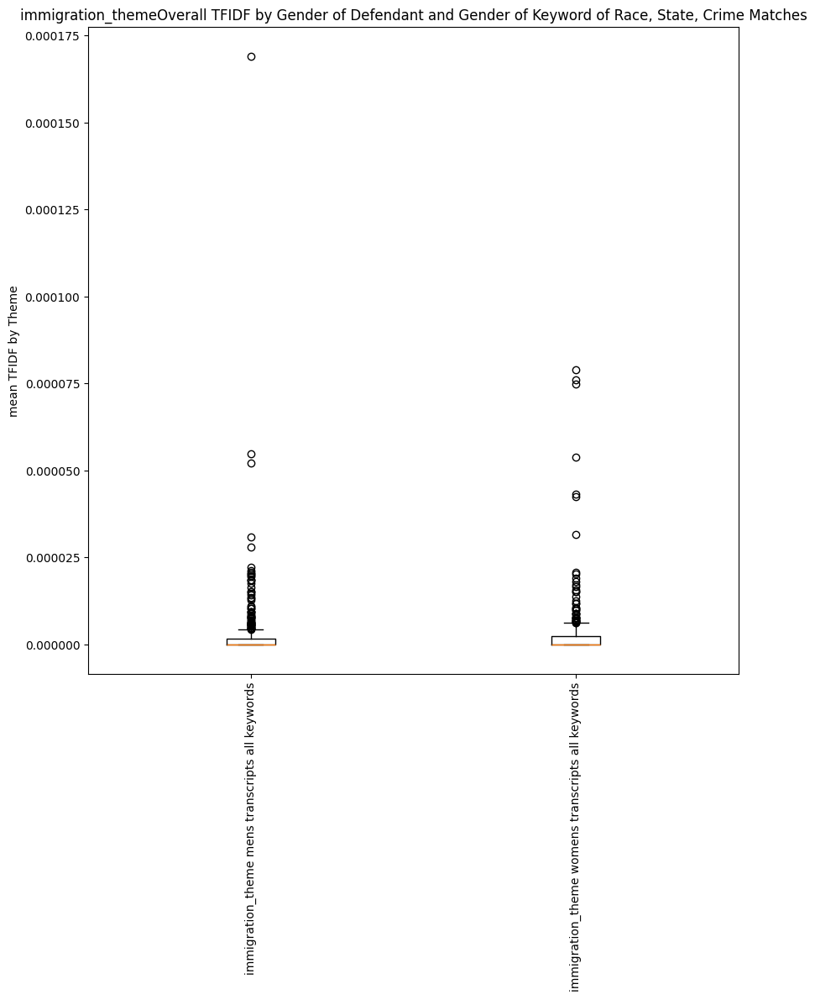

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


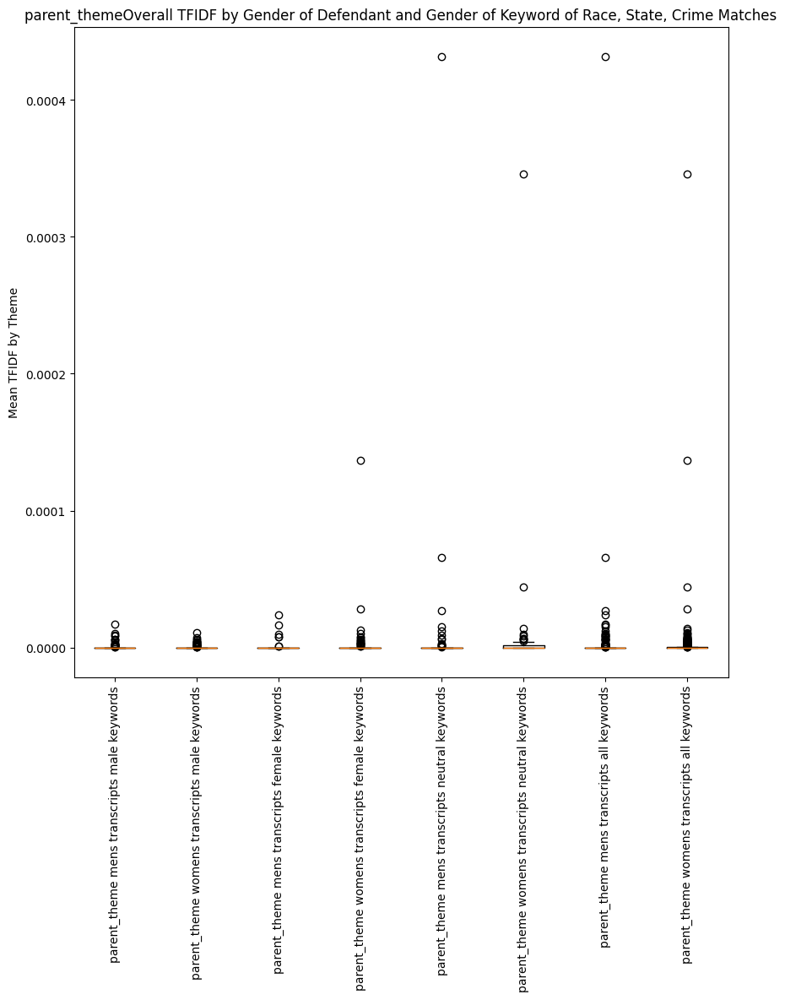

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


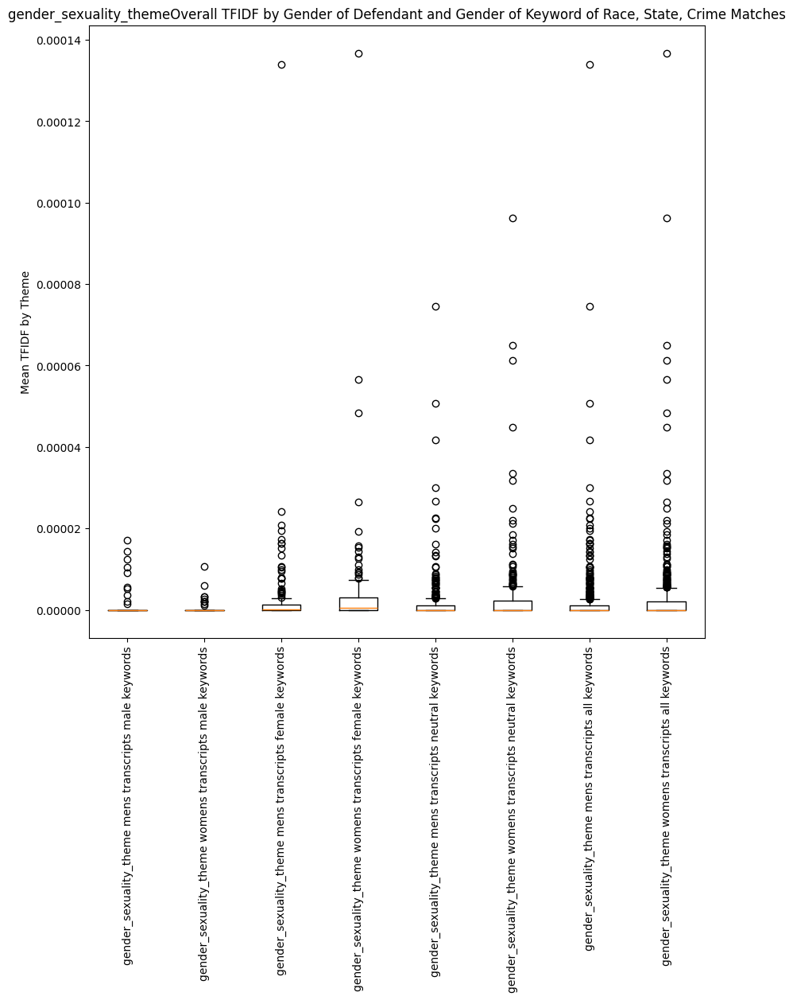

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


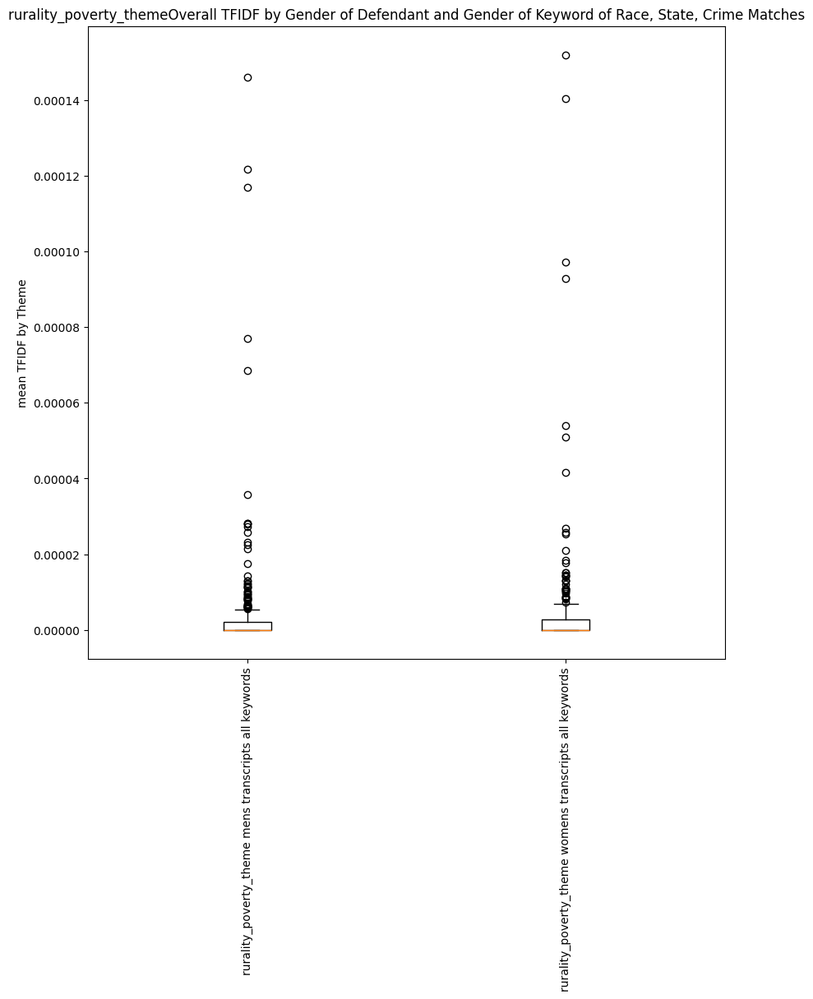

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


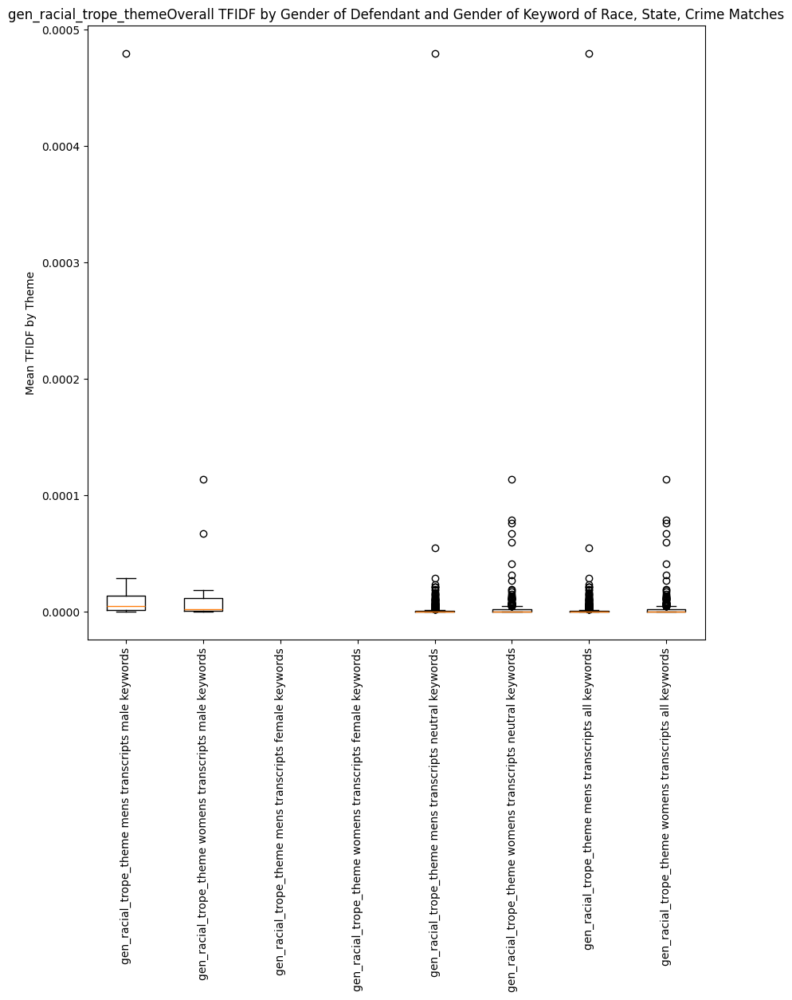

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


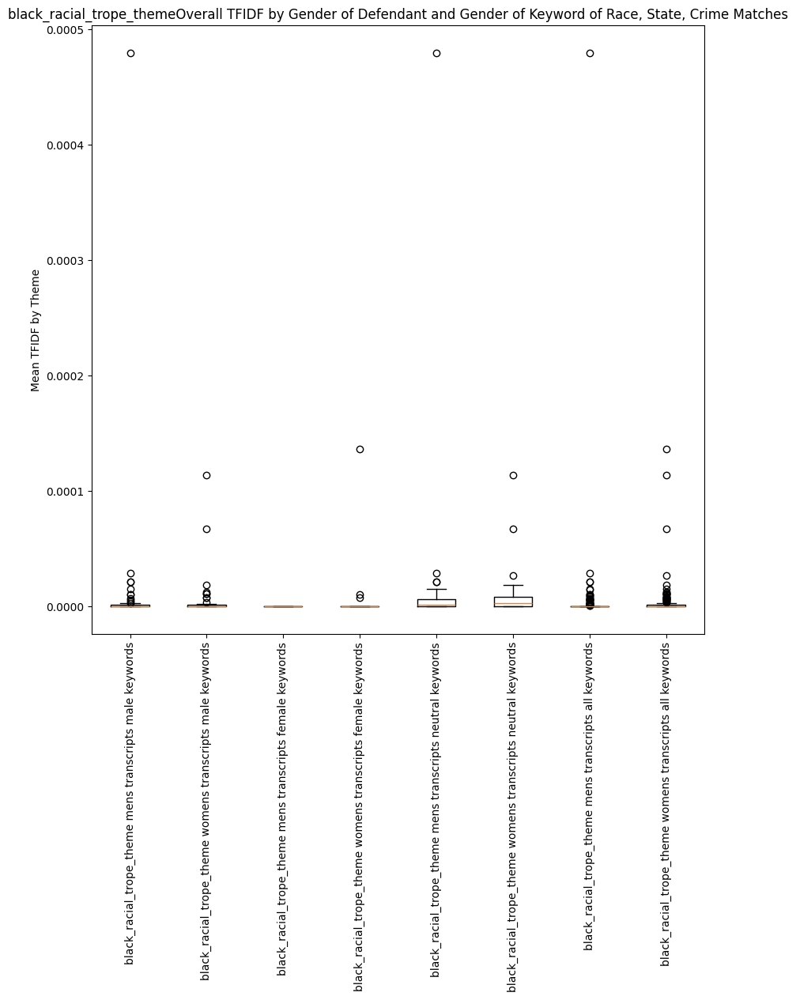

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


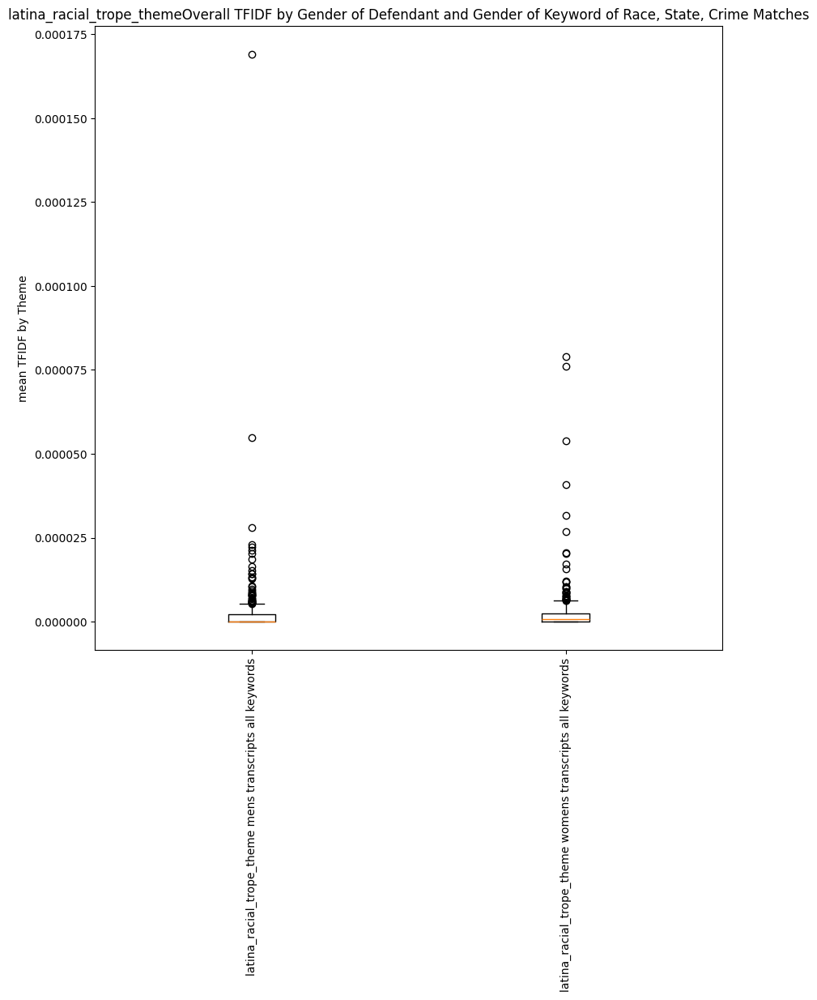

In [ ]:
#

generate_boxplots( raw_counts[raw_counts['race_state_crime_match']== True] , theme_types, 'overall_tfidf_11_25', 'Race, State, Crime Matches')


/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


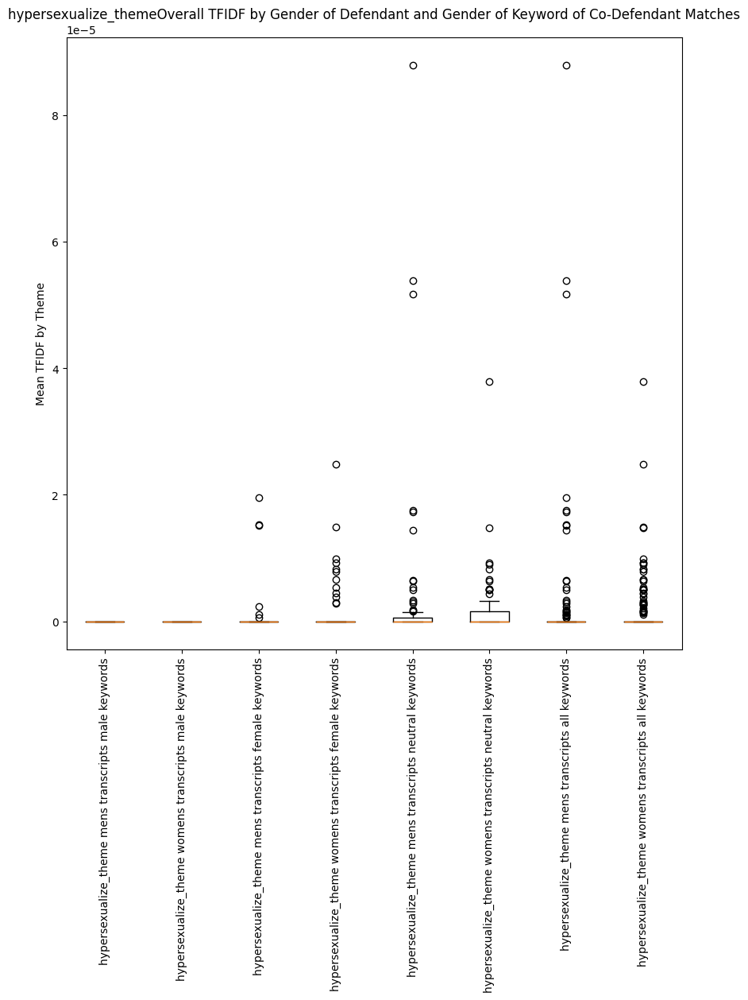

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


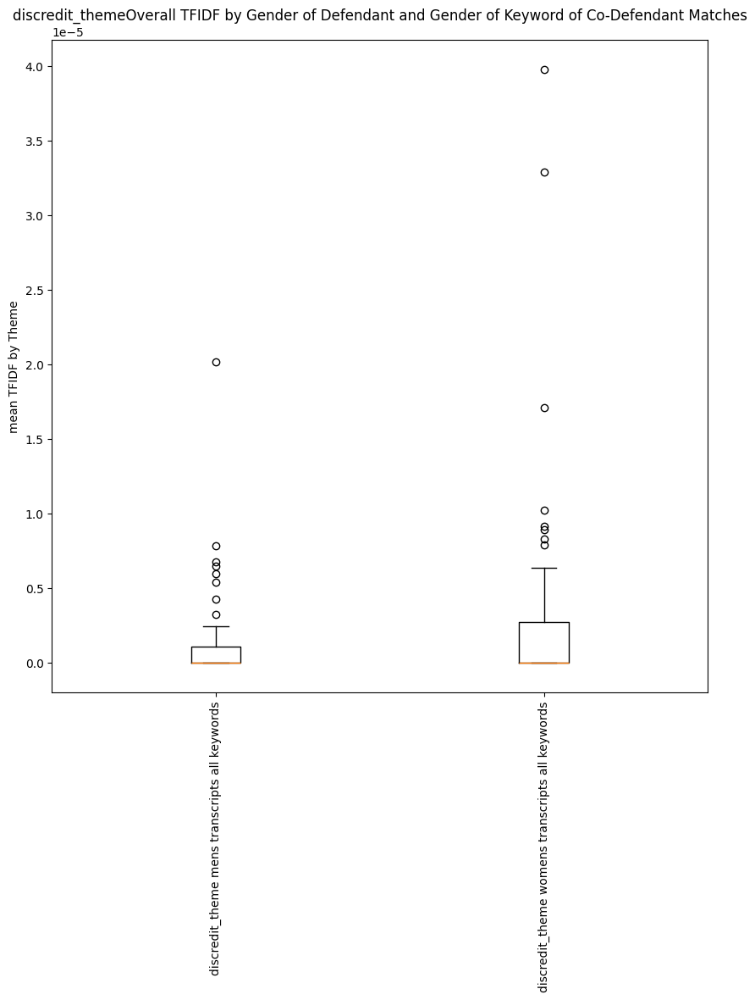

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


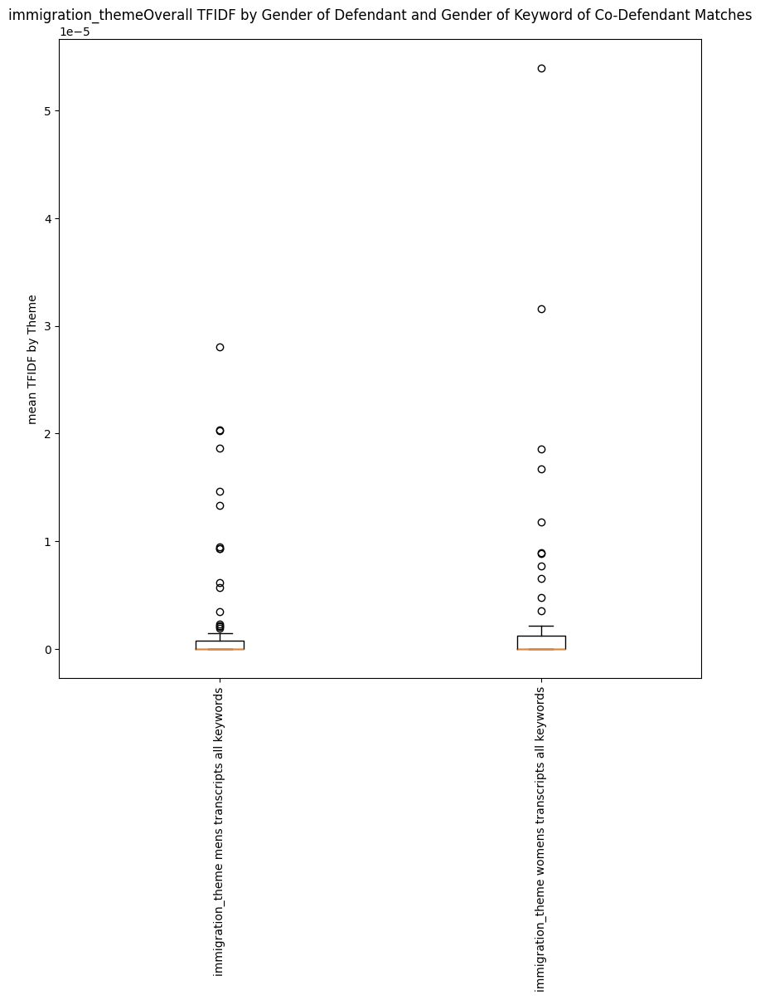

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


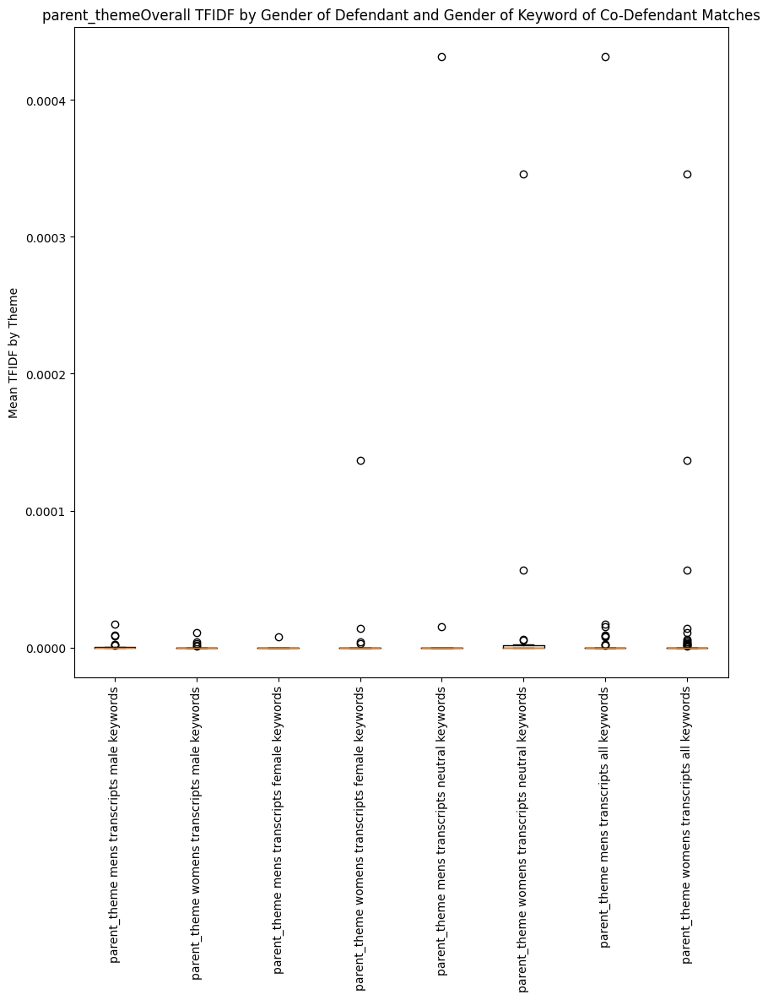

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


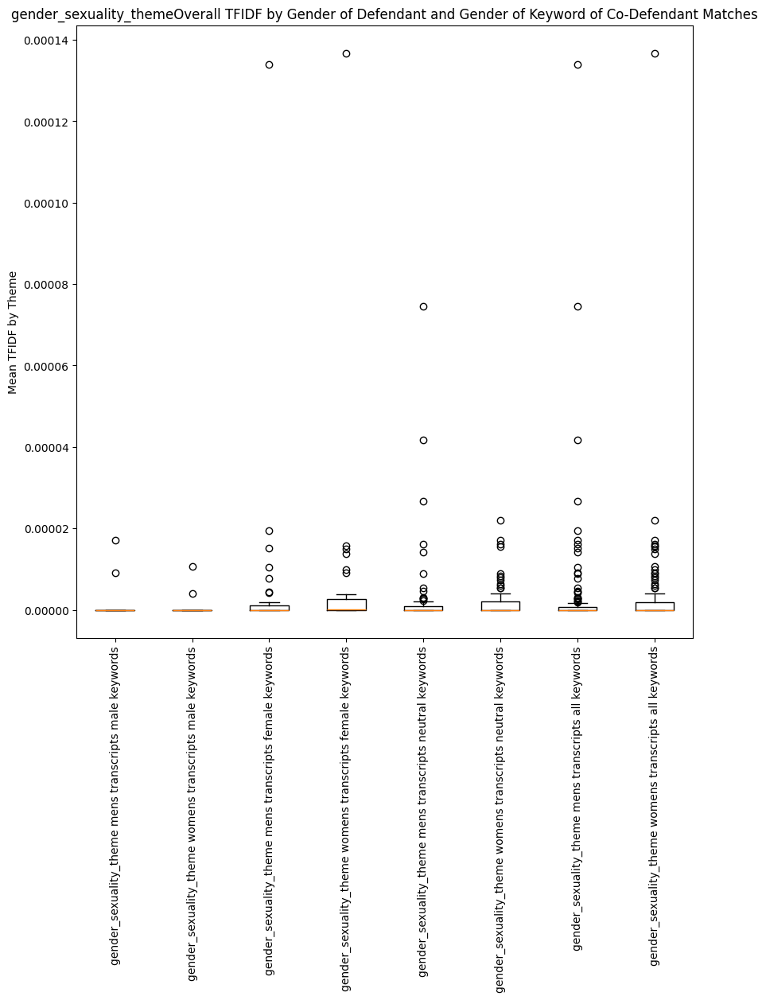

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


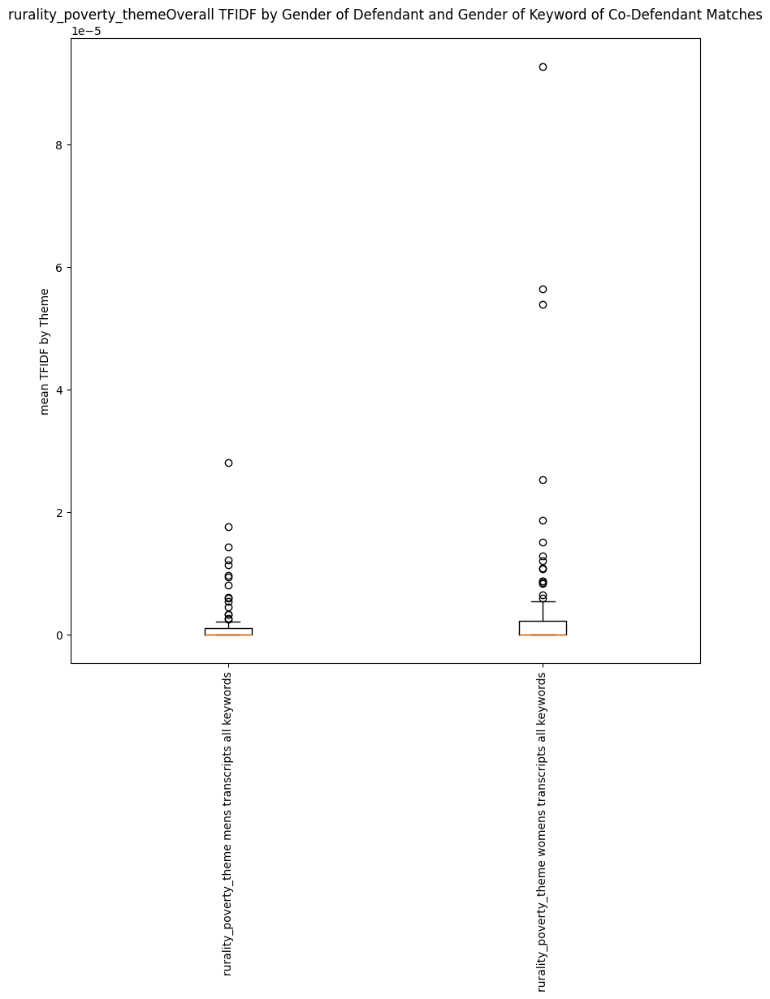

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


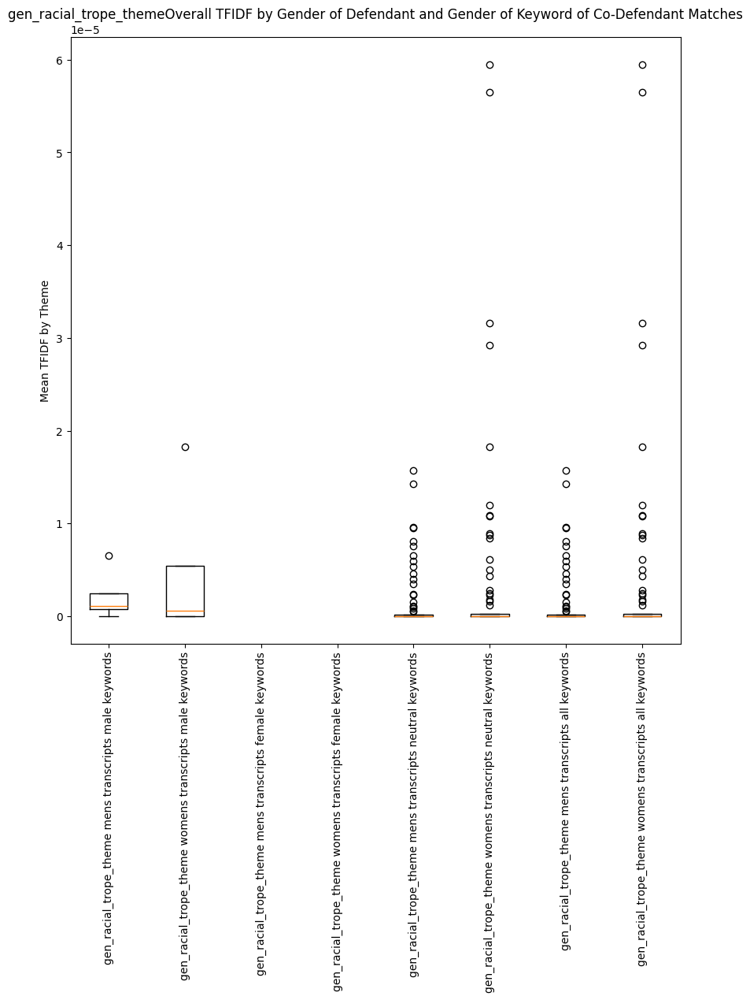

/tmp/ipython-input-1566462987.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


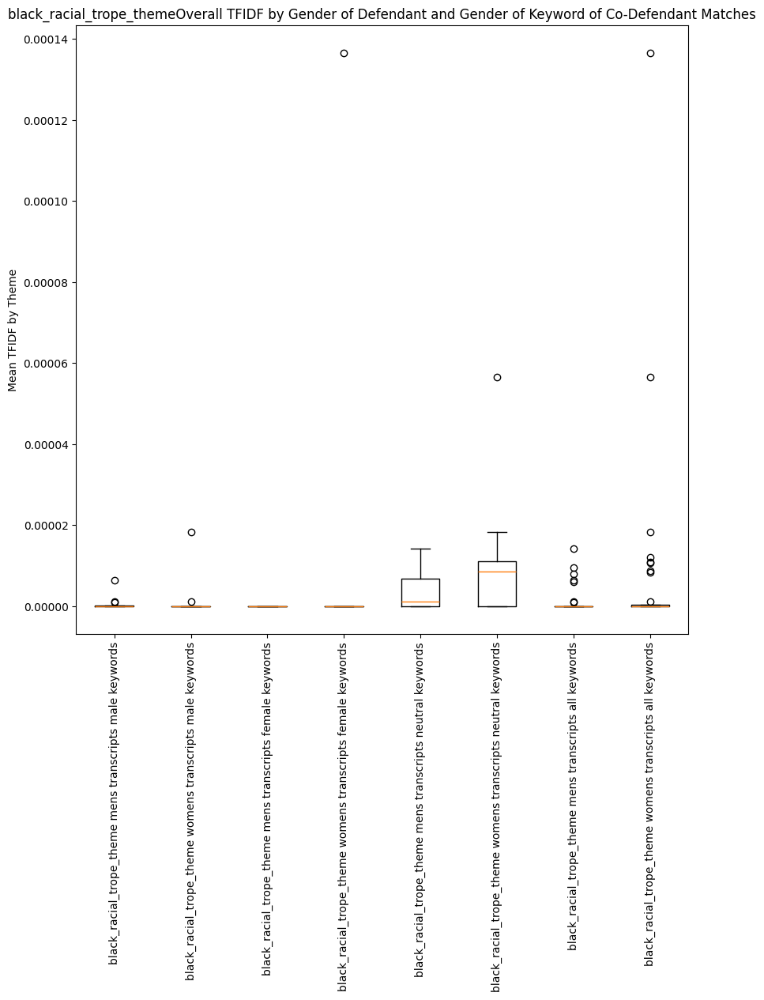

/tmp/ipython-input-1566462987.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


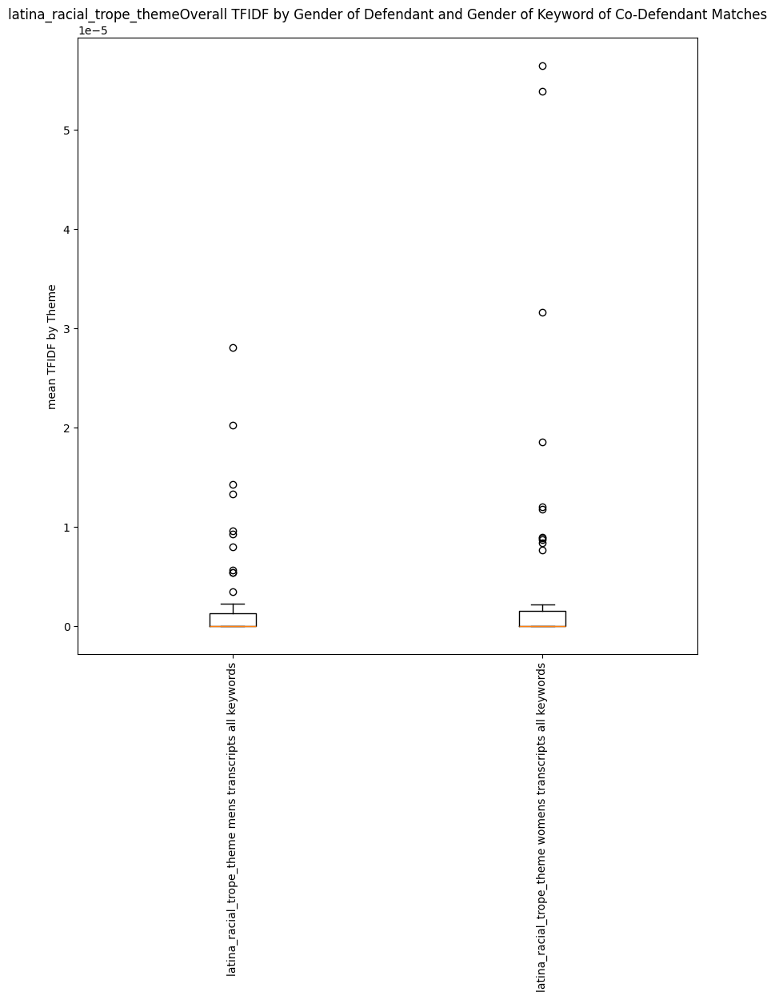

In [ ]:
#boxpolts of co-defendant matches
generate_boxplots( raw_counts[raw_counts['co_defendant_match']== True] , theme_types, 'overall_tfidf_11_25', 'Co-Defendant Matches')


In [121]:
def generate_boxplots(df, theme_types, plotting_column, subset, plotting_colum_name = "Overall TF-IDF"):
  for col in theme_types:
    men = df[df['gender']== 'man']
    women = df[df['gender']== 'woman']

    #mean count of each theme by gender

    men_theme_m =  men[(men[col]==True) & men['gendered_keyword_male'] == True][plotting_column]
    men_theme_f = men[(men[col]==True) & men['gendered_keyword_female'] == True][plotting_column]
    men_theme_n = men[(men[col]==True) & men['gender_neutral_keyword'] == True][plotting_column]
    men_theme_all = men[(men[col]==True)][plotting_column]


    women_theme_m = women[(women[col]==True) & women['gendered_keyword_male'] == True][plotting_column]
    women_theme_f = women[(women[col]==True) & women['gendered_keyword_female'] == True][plotting_column]
    women_theme_n = women[(women[col]==True) & women['gender_neutral_keyword'] == True][plotting_column]
    women_theme_all = women[(women[col]==True)][plotting_column]


    plt.figure(figsize=(10, 10))

    if len(men_theme_m) > 0:

      plt.boxplot([men_theme_m, women_theme_m,
                  men_theme_f,  women_theme_f ,
                  men_theme_n, women_theme_n,
                  men_theme_all, women_theme_all], labels=[

                                                                      col + ' mens transcripts ' + 'male keywords',
                                                                      col + ' womens transcripts ' + 'male keywords',


                                                                      col + ' mens transcripts ' + 'female keywords',
                                                                      col + ' womens transcripts ' + 'female keywords',


                                                                      col + ' mens transcripts ' + 'neutral keywords',
                                                                      col + ' womens transcripts ' + 'neutral keywords',


                                                                      col + ' mens transcripts ' + 'all keywords',

                                                                      col + ' womens transcripts ' + 'all keywords']
      )




      plt.xticks(rotation=90)

      # Adding a title and labels
      plt.title(col + plotting_colum_name +  ' by Gender of Defendant and Gender of Keyword of ' + subset)
      plt.ylabel('Mean TFIDF by Theme')

      # Display the plot
      plt.show()

    else:

      plt.boxplot([


                  men_theme_all, women_theme_all], labels=[
                                                                                                                col + ' mens transcripts ' + 'all keywords',

                                                                                                                col + ' womens transcripts ' + 'all keywords']
      )




      plt.xticks(rotation=90)

      # Adding a title and labels
      plt.title(col + 'Overall TFIDF by Gender of Defendant and Gender of Keyword of ' + subset)
      plt.ylabel('mean TFIDF by Theme')

      # Display the plot
      plt.show()

In [ ]:
copy = raw_counts[raw_counts['race_state_crime_match']== True]

/tmp/ipython-input-3496885002.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


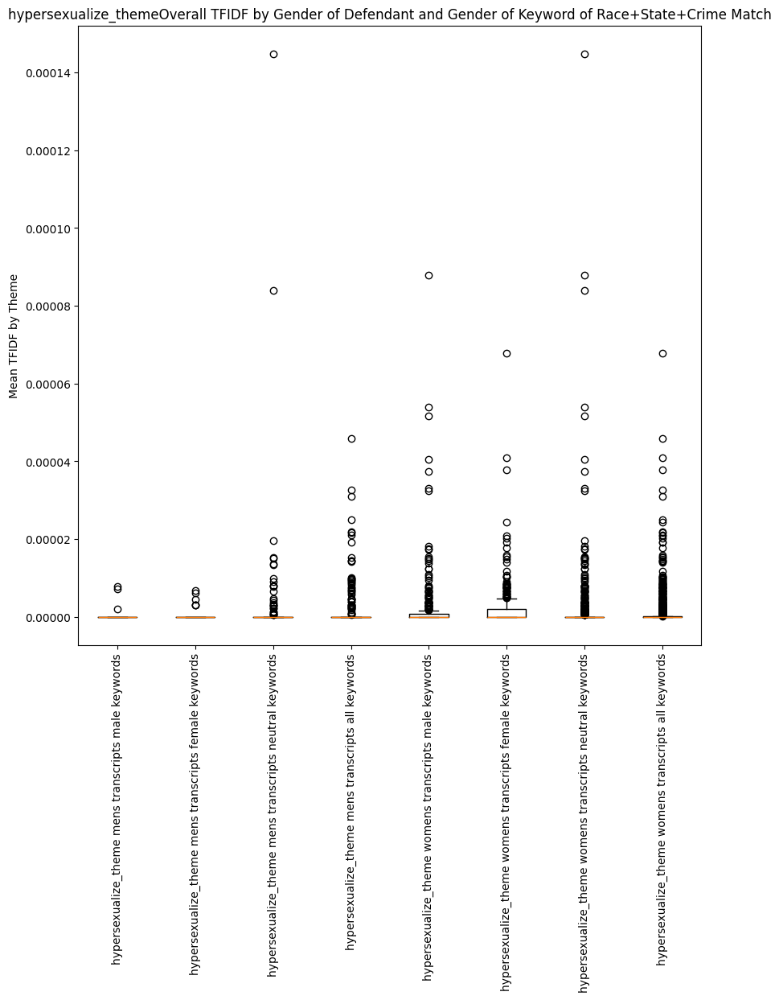

/tmp/ipython-input-3496885002.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


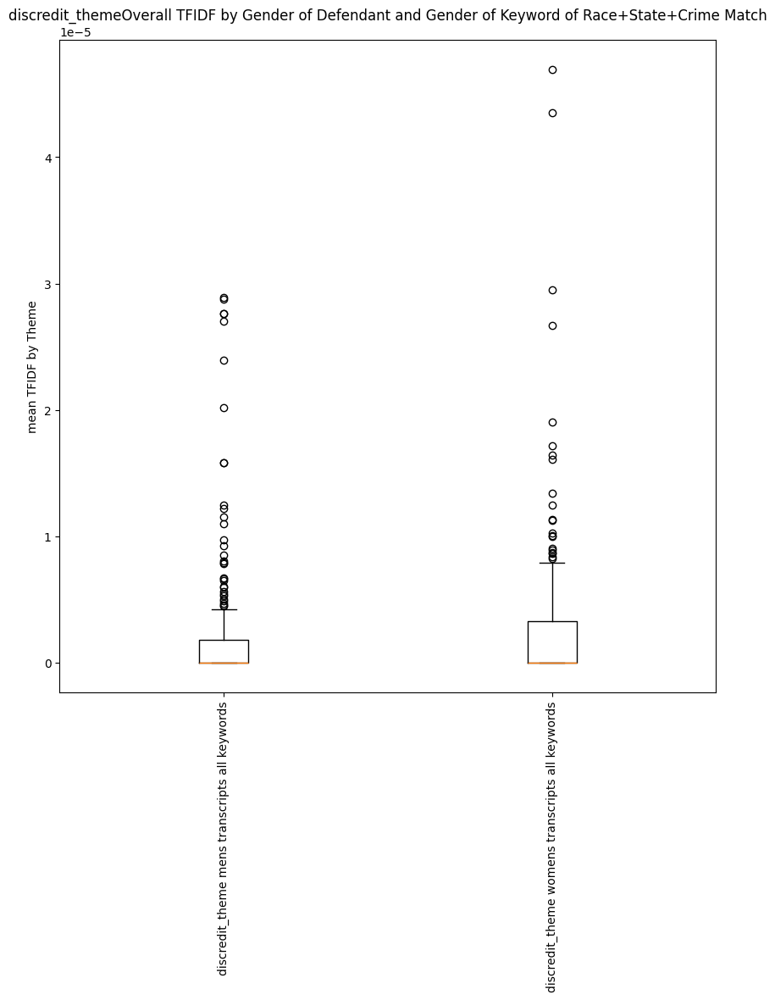

/tmp/ipython-input-3496885002.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


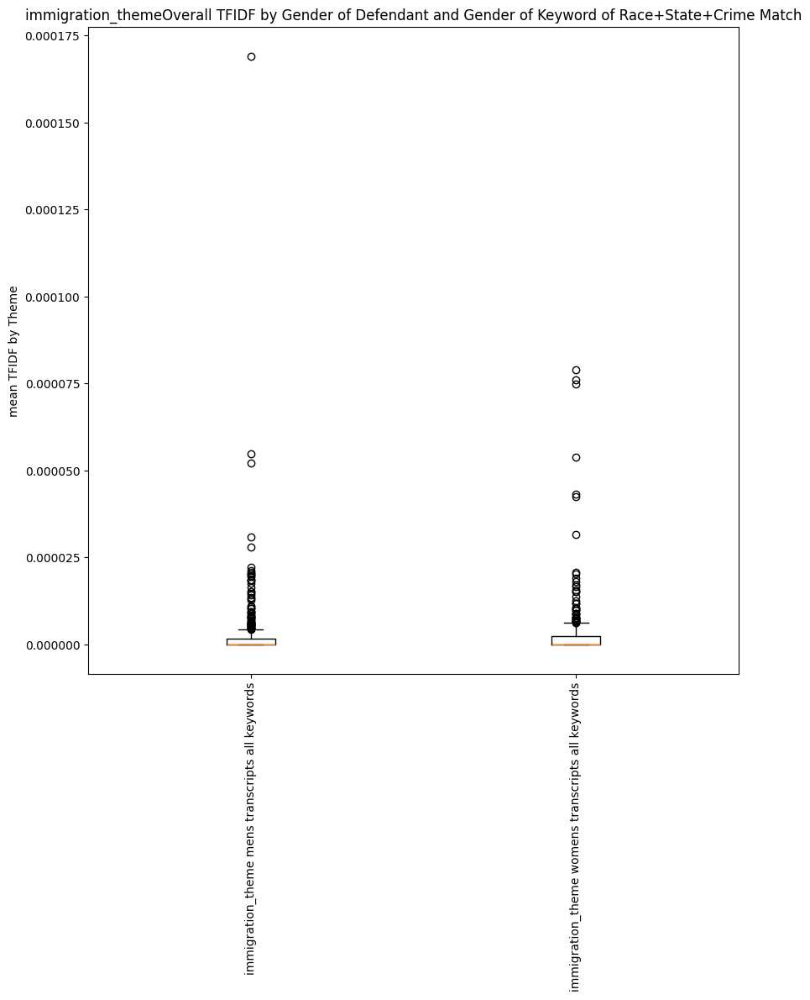

/tmp/ipython-input-3496885002.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


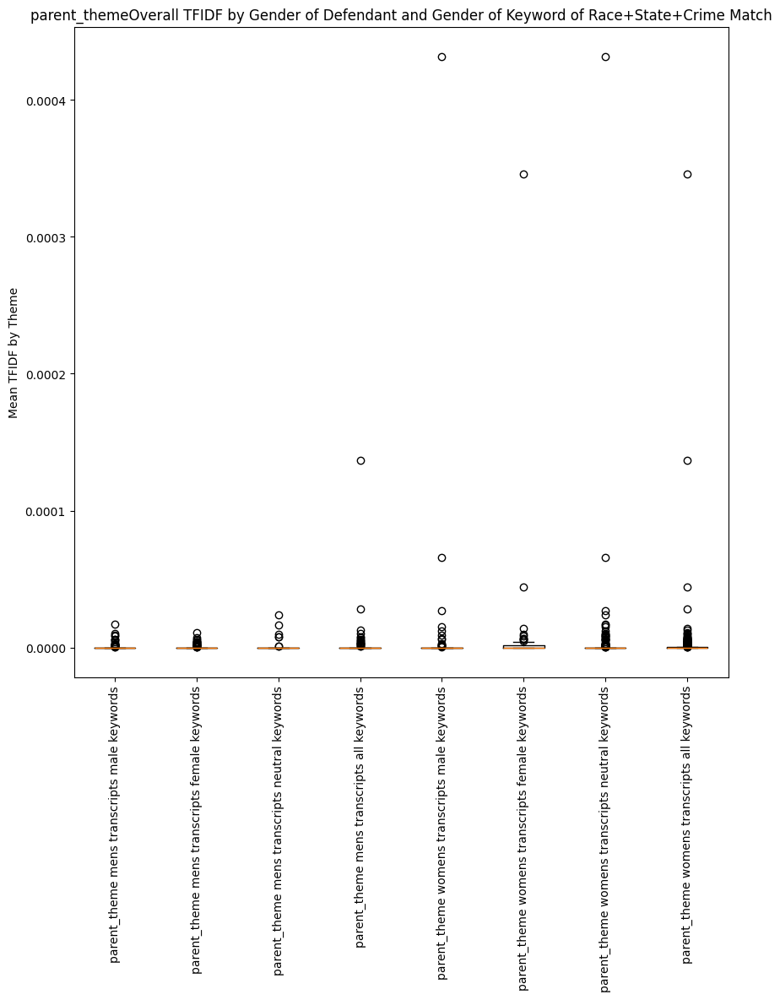

/tmp/ipython-input-3496885002.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


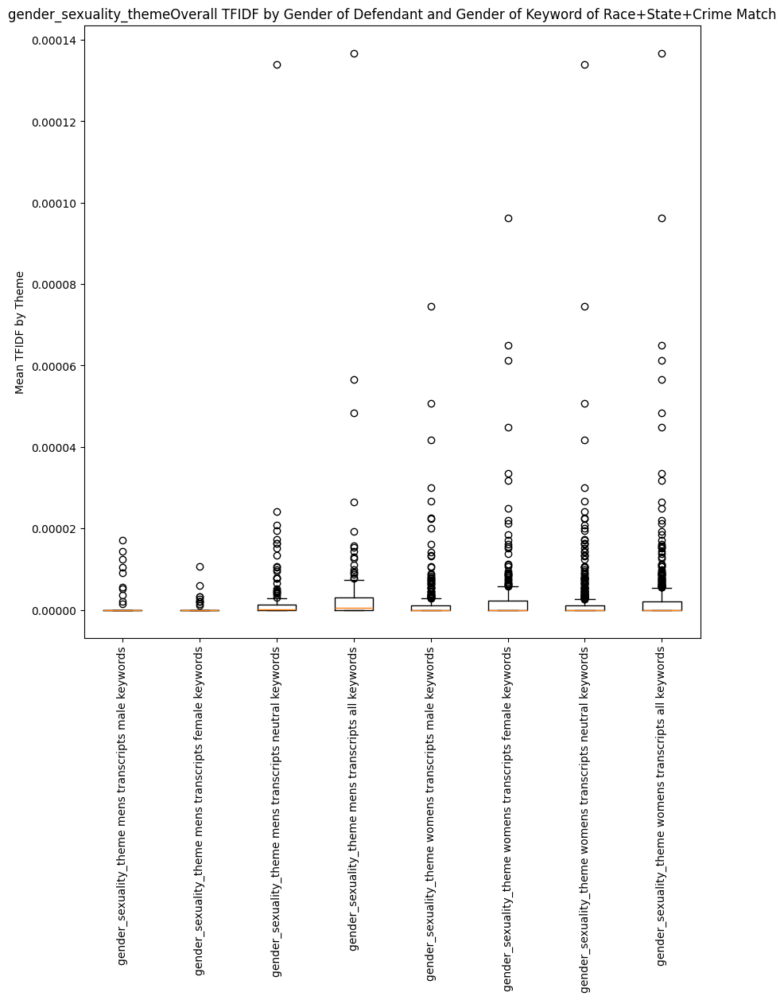

/tmp/ipython-input-3496885002.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


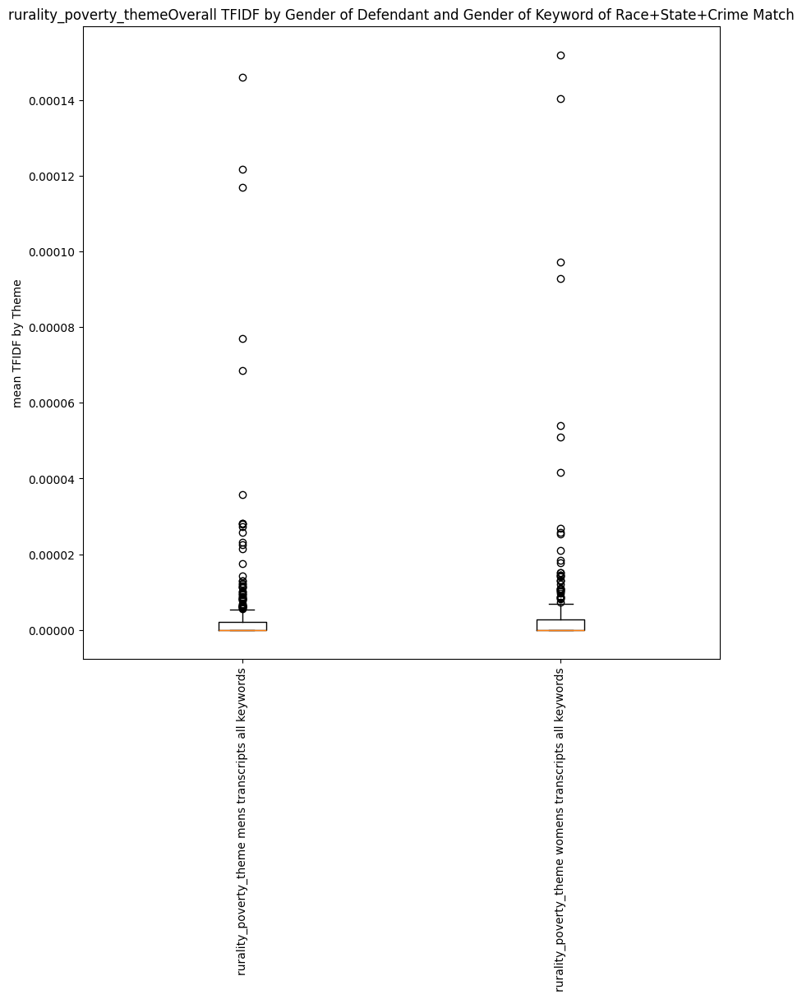

/tmp/ipython-input-3496885002.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


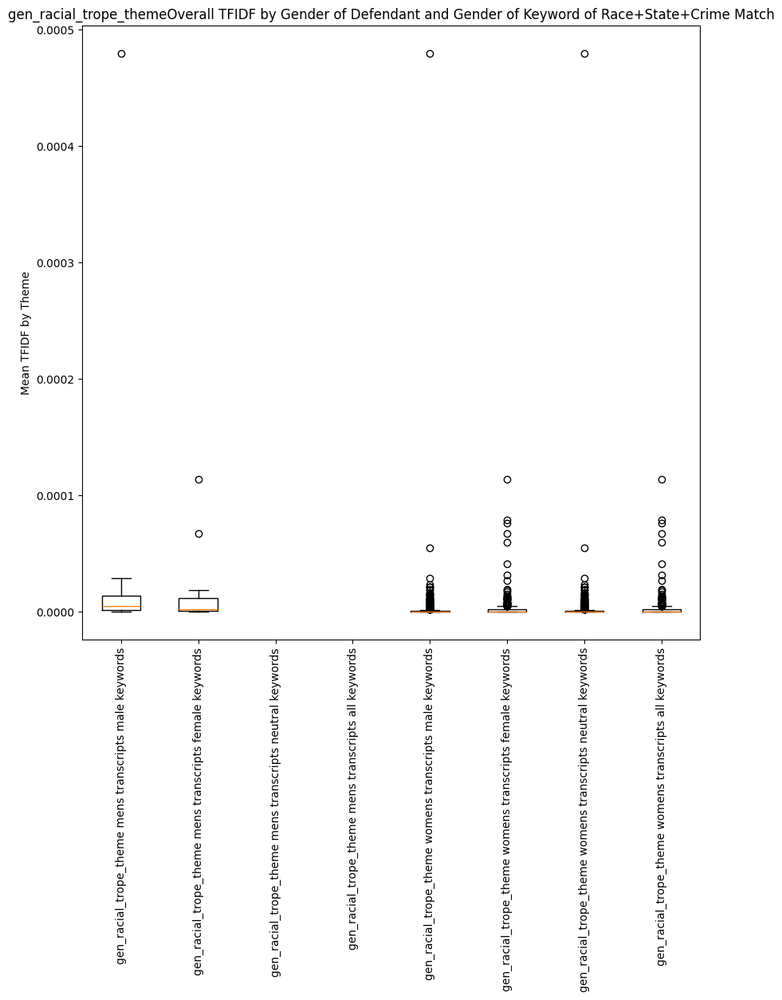

/tmp/ipython-input-3496885002.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


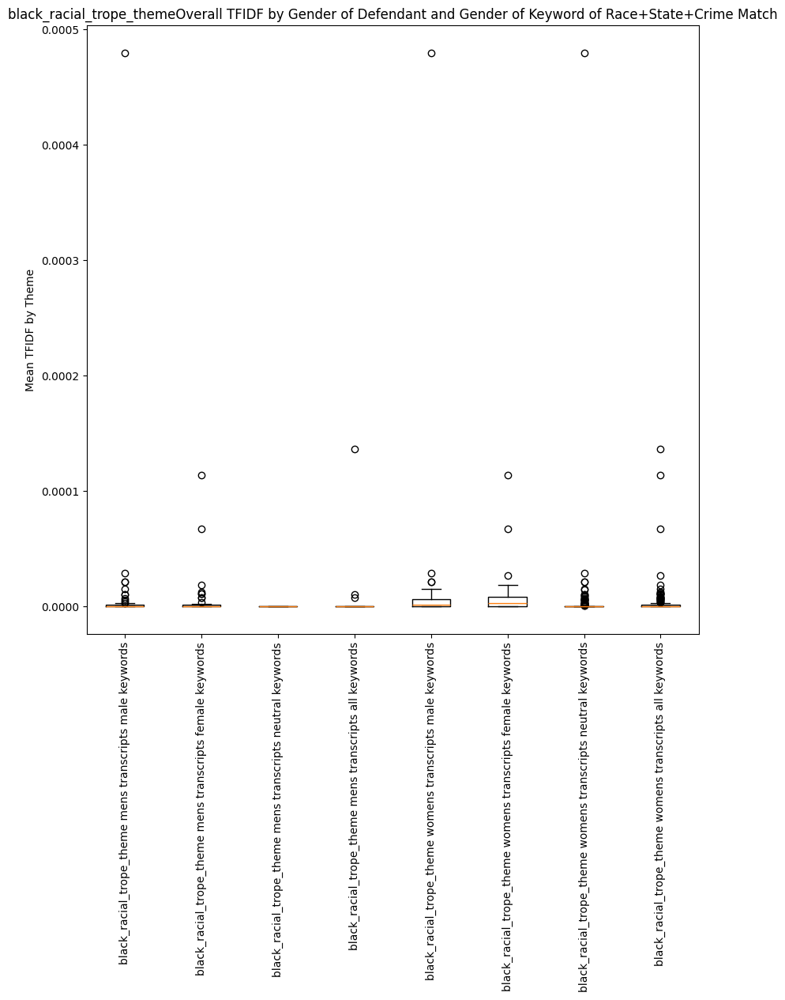

/tmp/ipython-input-3496885002.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


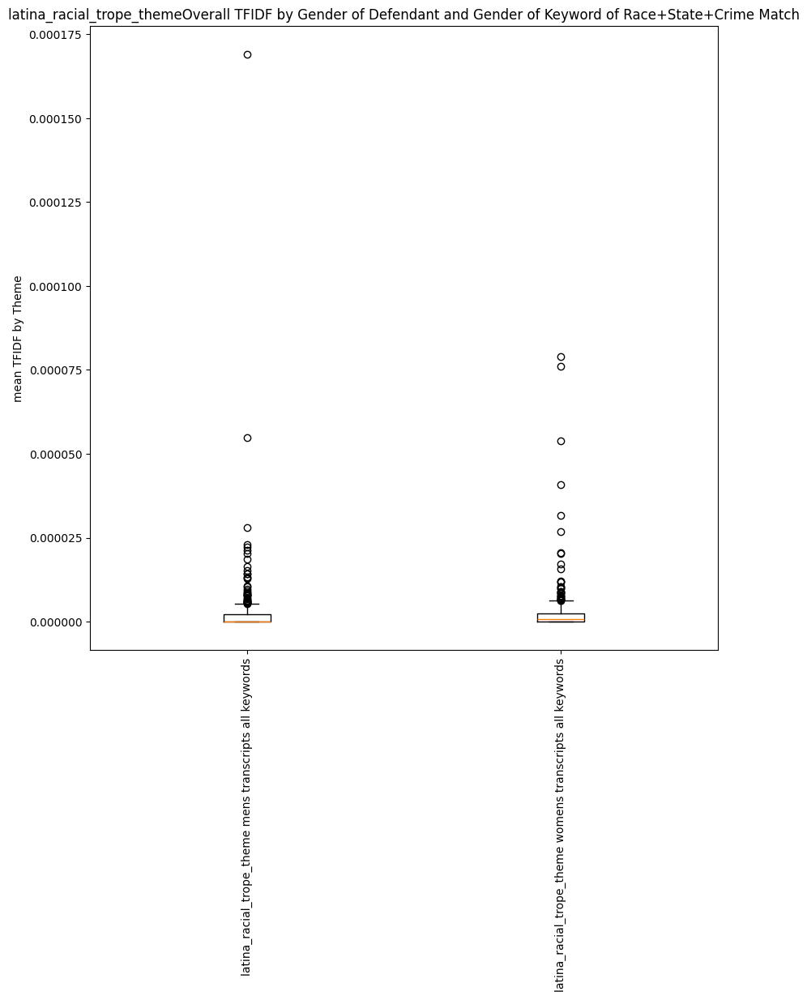

In [ ]:
for col in theme_types:
  men = copy[copy['gender']== 'man']
  women = copy[copy['gender']== 'woman']

  #mean count of each theme by gender

  men_theme_m =  men[(men[col]==True) & men['gendered_keyword_male'] == True]['overall_tfidf_11_24']
  men_theme_f = men[(men[col]==True) & men['gendered_keyword_female'] == True]['overall_tfidf_11_24']
  men_theme_n = men[(men[col]==True) & men['gender_neutral_keyword'] == True]['overall_tfidf_11_24']
  men_theme_all = men[(men[col]==True)]['overall_tfidf_11_24']


  women_theme_m = women[(women[col]==True) & women['gendered_keyword_male'] == True]['overall_tfidf_11_24']
  women_theme_f = women[(women[col]==True) & women['gendered_keyword_female'] == True]['overall_tfidf_11_24']
  women_theme_n = women[(women[col]==True) & women['gender_neutral_keyword'] == True]['overall_tfidf_11_24']
  women_theme_all = women[(women[col]==True)]['overall_tfidf_11_24']


  plt.figure(figsize=(10, 10))

  if len(men_theme_m) > 0:

    plt.boxplot([men_theme_m, women_theme_m,

                 men_theme_f,
                 women_theme_m,
                  women_theme_f ,
                men_theme_n, women_theme_n,
                men_theme_all, women_theme_all], labels=[
                                                                                                               col + ' mens transcripts ' + 'male keywords',
                                                                                                               col + ' womens transcripts ' + 'male keywords',
                                                                                                              col + ' mens transcripts ' + 'female keywords',
                                                                                                              col + ' mens transcripts ' + 'neutral keywords',
                                                                                                              col + ' mens transcripts ' + 'all keywords',

                                                                                                              col + ' womens transcripts ' + 'female keywords',
                                                                                                              col + ' womens transcripts ' + 'neutral keywords',
                                                                                                              col + ' womens transcripts ' + 'all keywords']
    )




    plt.xticks(rotation=90)

    # Adding a title and labels
    plt.title(col + 'Overall TFIDF by Gender of Defendant and Gender of Keyword of Race+State+Crime Match')
    plt.ylabel('Mean TFIDF by Theme')

    # Display the plot
    plt.show()

  else:

    plt.boxplot([


                men_theme_all, women_theme_all], labels=[
                                                                                                              col + ' mens transcripts ' + 'all keywords',

                                                                                                              col + ' womens transcripts ' + 'all keywords']
    )




    plt.xticks(rotation=90)

    # Adding a title and labels
    plt.title(col + 'Overall TFIDF by Gender of Defendant and Gender of Keyword of Race+State+Crime Match')
    plt.ylabel('mean TFIDF by Theme')

    # Display the plot
    plt.show()

#Heatmaps of counts by Theme

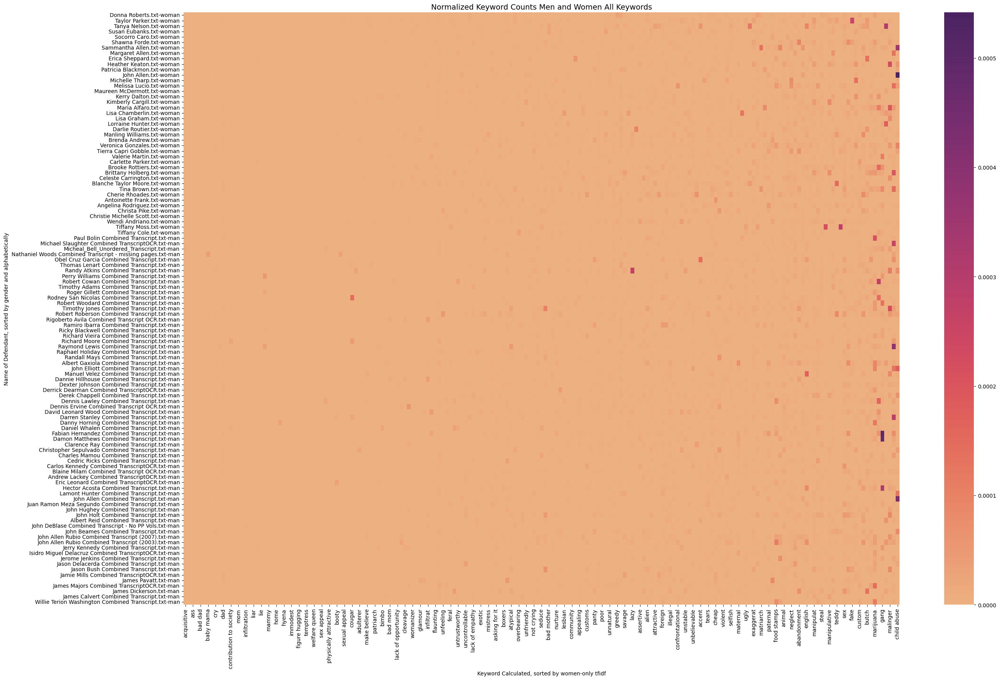

In [ ]:
heatmap_data = raw_counts.pivot_table(
        index=['document_name','gender'],
        columns='keyword',
        values='overall_tfidf_11_24')


sorted_pivot = heatmap_data.sort_values(by='gender', ascending=False)


#sorted_y_axis = heatmap_data.mean(axis=1).sort_values(ascending=False)



#sorted_pivot_df = sorted_pivot.reindex(index=sorted_y_axis)


fig, axes = plt.subplots(1, 1, figsize=(30, 20), sharex=True, sharey=True)


sort_order_x = raw_counts.groupby('keyword')['women_only_tfidf_11_24'].mean().sort_values().index


df_pivot_sorted = sorted_pivot.reindex(columns=sort_order_x)


sns.heatmap(df_pivot_sorted, ax=axes, cmap="flare",  cbar=True) #




# sns.heatmap(sorted_pivot, ax=axes, cmap="Spectral",  cbar=True ) #,xticklabels=True, yticklabels=True) #, vmin= v_min, vmax= v_max)


# yticklabels1 = sorted(normalized_keyword_analysis_women_df[normalized_keyword_analysis_women_df['Race/Ethnicity'] == 'White'].Name.unique())

axes.set_title(f'Normalized Keyword Counts Men and Women All Keywords', fontsize=14)
axes.set_ylabel('Name of Defendant, sorted by gender and alphabetically')
axes.set_xlabel('Keyword Calculated, sorted by women-only tfidf')

#axes.set_yticklabels(yticklabels1)

plt.show()

In [ ]:
theme_types

['hypersexualize_theme',
 'discredit_theme',
 'immigration_theme',
 'parent_theme',
 'gender_sexuality_theme',
 'rurality_poverty_theme',
 'gen_racial_trope_theme',
 'black_racial_trope_theme',
 'latina_racial_trope_theme']

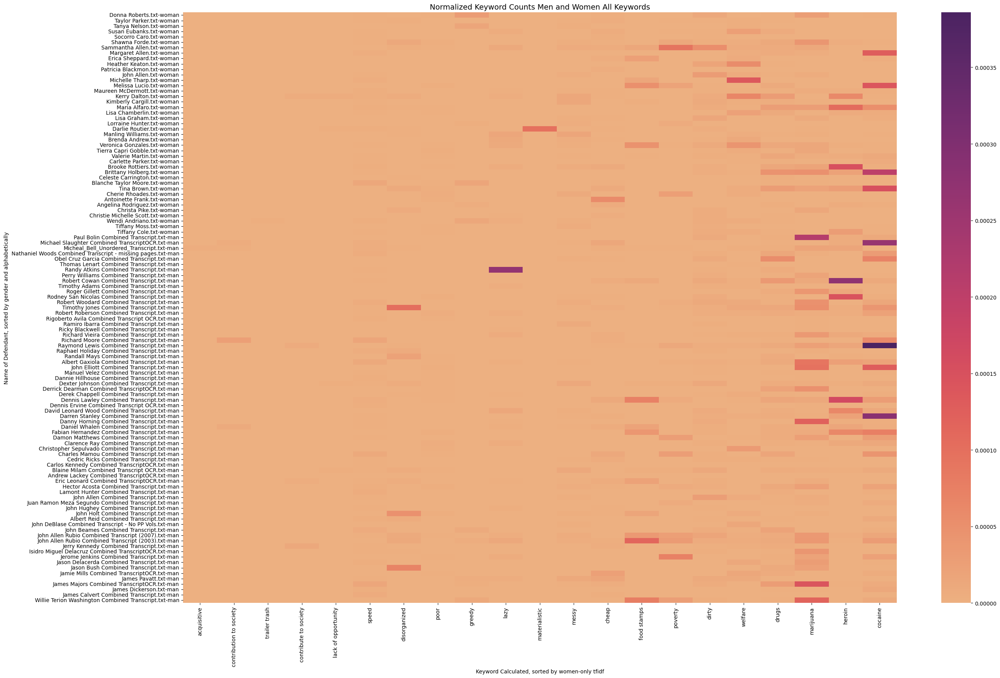

In [ ]:
heatmap_data = raw_counts[raw_counts['rurality_poverty_theme']==True].pivot_table(
        index=['document_name','gender'],
        columns='keyword',
        values='overall_tfidf_11_24')


sorted_pivot = heatmap_data.sort_values(by='gender', ascending=False)


#sorted_y_axis = heatmap_data.mean(axis=1).sort_values(ascending=False)



#sorted_pivot_df = sorted_pivot.reindex(index=sorted_y_axis)


fig, axes = plt.subplots(1, 1, figsize=(30, 20), sharex=True, sharey=True)


sort_order_x = raw_counts[raw_counts['rurality_poverty_theme']==True].groupby('keyword')['women_only_tfidf_11_24'].mean().sort_values().index


df_pivot_sorted = sorted_pivot.reindex(columns=sort_order_x)


sns.heatmap(df_pivot_sorted, ax=axes, cmap="flare",  cbar=True) #




# sns.heatmap(sorted_pivot, ax=axes, cmap="Spectral",  cbar=True ) #,xticklabels=True, yticklabels=True) #, vmin= v_min, vmax= v_max)


# yticklabels1 = sorted(normalized_keyword_analysis_women_df[normalized_keyword_analysis_women_df['Race/Ethnicity'] == 'White'].Name.unique())

axes.set_title(f'Normalized Keyword Counts Men and Women All Keywords', fontsize=14)
axes.set_ylabel('Name of Defendant, sorted by gender and alphabetically')
axes.set_xlabel('Keyword Calculated, sorted by women-only tfidf')

#axes.set_yticklabels(yticklabels1)

plt.show()

In [ ]:
raw_counts.head()

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,co_defendant_match,race_state_crime_match,word_count,unique_word_count,doc_word_count,doc_unique_word_count,term_frequency,women_only_tfidf_11_24,men_only_tfidf_11_24,overall_tfidf_11_24
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,True,1078612,26789,1078612,26789,0.000000,0.000000,0.0,0.000000
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,False,True,1078612,26789,1078612,26789,0.000028,0.000037,0.0,0.000041
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,False,True,1078612,26789,1078612,26789,0.000000,0.000000,0.0,0.000000
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,True,1078612,26789,1078612,26789,0.000000,0.000000,0.0,0.000000
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,True,1078612,26789,1078612,26789,0.000453,0.000000,0.0,0.000000


#Create (updated) nationally representative sample

In [8]:
W_national_rep ={
      'Heather Keaton.txt',
      'Wendi Andriano.txt',
      'Sammantha Allen.txt',
 'Shawna Forde.txt',
'Kerry Dalton.txt',
 'Cherie Rhoades.txt',
'Tina Brown.txt',
'Tiffany Moss.txt',
'Antoinette Frank.txt',
      'Christie Michelle Scott.txt',
'Donna Roberts.txt',
'Blanche Taylor Moore.txt',
      'Kimberly Cargill.txt',
      'Brittany Holberg.txt',
      'Melissa Lucio.txt',
      'Erica Sheppard.txt',
      'Maureen McDermott.txt',
 'Valerie Martin.txt',
       'Brooke Rottiers.txt',
       'Tierra Capri Gobble.txt',
      'Patricia Blackmon.txt','Socorro Caro.txt', 'Taylor Parker.txt', 'Maria Alfaro.txt',

 'Manling Williams.txt','Tanya Nelson.txt', 'Celeste Carrington.txt', 'Darlie Routier.txt',  'Lisa Chamberlin.txt','Carlette Parker.txt'
       'Lorraine Hunter.txt',
 'Antoinette Frank.txt',
 'Donna Roberts.txt',
       'Veronica Gonzales.txt',
 'Lisa Graham.txt',
       'Brenda Andrew.txt',
       'Christa Pike.txt'}

M_national_rep = {
      'John DeBlase Combined Transcript - No PP Vols.txt',
'Timothy Jones Combined Transcript.txt',
 'John Allen.txt',
       'Jason Bush Combined Transcript.txt',
'Eric Leonard Combined TranscriptOCR.txt',
      'Robert Roberson Combined Transcript.txt',
      'David Leonard Wood Combined Transcript.txt',
      'Micheal_Bell_Unordered_Transcript.txt',
      'Robert Cowan Combined Transcript.txt',
      'Dennis Ervine Combined Transcript OCR.txt',
'Dannie Hillhouse Combined Transcript.txt',
      'John Holt Combined Transcript.txt',
'Danny Horning Combined Transcript.txt',
'Raymond Lewis Combined Transcript.txt',
      'Rodney San Nicolas Combined Transcript.txt',
'Michael Slaughter Combined TranscriptOCR.txt',
      'Richard Vieira Combined Transcript.txt',
'Daniel Whalen Combined Transcript.txt',
'Ricky Blackwell Combined Transcript.txt',

 'Jason Delacerda Combined Transcript.txt',
       'Isidro Miguel Delacruz Combined TranscriptOCR.txt',



 'Ricky Blackwell Combined Transcript.txt',
 'Dexter Johnson Combined Transcript.txt',
       'Damon Matthews Combined Transcript.txt',

 'Obel Cruz Garcia Combined Transcript.txt',
       'Charles Mamou Combined Transcript.txt',
 'Ramiro Ibarra Combined Transcript.txt',
       'Paul Bolin Combined Transcript.txt',


 'David Leonard Wood Combined Transcript.txt',
 'Raphael Holiday Combined Transcript.txt',

 'James Calvert Combined Transcript.txt',
 'Raymond Lewis Combined Transcript.txt',
       'Derek Chappell Combined Transcript.txt',

 'Hector Acosta Combined Transcript.txt', 'Robert Woodard Combined Transcript.txt',
 'Timothy Adams Combined Transcript.txt',
       'James Pavatt.txt',
       'Perry Williams Combined Transcript.txt',
 'Cedric Ricks Combined Transcript.txt',
 'Timothy Jones Combined Transcript.txt',
       'Randall Mays Combined Transcript.txt',

 'Rigoberto Avila Combined Transcript OCR.txt',
 'John Allen Rubio Combined Transcript (2003).txt',

 'John Allen Rubio Combined Transcript (2007).txt',


 'Daniel Whalen Combined Transcript.txt',


 'Jerome Jenkins Combined Transcript.txt',
 'Richard Vieira Combined Transcript.txt',
'Randy Atkins Combined Transcript.txt',
       'Blaine Milam Combined Transcript OCR.txt',
        'Fabian Hernandez Combined Transcript.txt'



}


In [ ]:
no_longer_death_row = {


 'Susan Eubanks.txt': (590834, 27644),

 'Tiffany Cole.txt': (225102, 13747),

 'Michelle Tharp.txt': (112156, 8882),

 'Angelina Rodriguez.txt': (464617, 19810),

 'Margaret Allen.txt': (188978, 12795),

 'Willie Terion Washington Combined Transcript.txt': (198112, 13426),

 'James Dickerson.txt': (131399, 13087),

 'Darren Stanley Combined Transcript.txt': (400182, 21683),



 'Carlos Kennedy Combined TranscriptOCR.txt': (87633, 8592),
 'Derrick Dearman Combined TranscriptOCR.txt': (123616, 9679),
 'Albert Reid Combined Transcript.txt': (197909, 13471),
 'Micheal_Bell_Unordered_Transcript.txt': (873532, 30592),
 'Rodney San Nicolas Combined Transcript.txt': (510672, 26311),


 'Clarence Ray Combined Transcript.txt': (184345, 18895),

 'James Majors Combined TranscriptOCR.txt': (509880, 24370),

 'Manuel Velez Combined Transcript.txt': (173476, 10812),
 'Albert Gaxiola Combined Transcript.txt': (694736, 25178),

 'Christopher Sepulvado Combined Transcript.txt': (153270, 11706),
 'Juan Ramon Meza Segundo Combined Transcript.txt': (345592, 61715),

 'John Hughey Combined Transcript.txt': (343007, 15493),
 'Richard Moore Combined Transcript.txt': (128614, 14934),

 'Dennis Lawley Combined Transcript.txt': (369792, 20731),

 'John Beames Combined Transcript.txt': (225639, 14989),

 'John DeBlase Combined Transcript - No PP Vols.txt': (869695, 28863),



 'John Elliott Combined Transcript.txt': (213499, 12562),
 'James Pavatt.txt': (410173, 20887),
 'Perry Williams Combined Transcript.txt': (133449, 6627),
 'Lamont Hunter Combined Transcript.txt': (113696, 8099),
 'Cedric Ricks Combined Transcript.txt': (326841, 17000),
 'Nathaniel Woods Combined Transcript - missing pages.txt': (236801, 15438),
 'Jerry Kennedy Combined Transcript.txt': (272024, 16567),
 'Jamie Mills Combined TranscriptOCR.txt': (117466, 10025),
 'Andrew Lackey Combined TranscriptOCR.txt': (158387, 11034),
 'Randall Mays Combined Transcript.txt': (267376, 13691),
 'Rigoberto Avila Combined Transcript OCR.txt': (212696, 11316),

 'Roger Gillett Combined Transcript.txt': (175797, 11398),
 'Thomas Lenart Combined Transcript.txt': (315152, 33633),

}

In [122]:
keyword_counts

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count,term_frequency,women_only_tfidf_11_24,women_only_tfidf_11_25,men_only_tfidf_11_25,overall_tfidf_11_25,national_rep_sample
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,False,True,1078612,26789,0.000028,0.000037,0.000037,0.000000,0.000041,True
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,True,1078612,26789,0.000000,0.000000,0.000000,0.000000,0.000000,True
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,True,1078612,26789,0.000453,0.000000,0.000000,0.000000,0.000000,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20596,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,...,False,True,920115,30899,0.000004,0.000000,0.000000,0.000002,0.000001,True
20597,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,...,False,True,920115,30899,0.000073,0.000000,0.000000,0.000020,0.000020,True
20598,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,...,False,True,920115,30899,0.000000,0.000000,0.000000,0.000000,0.000000,True
20599,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,...,False,True,920115,30899,0.000002,0.000000,0.000000,0.000003,0.000003,True


/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


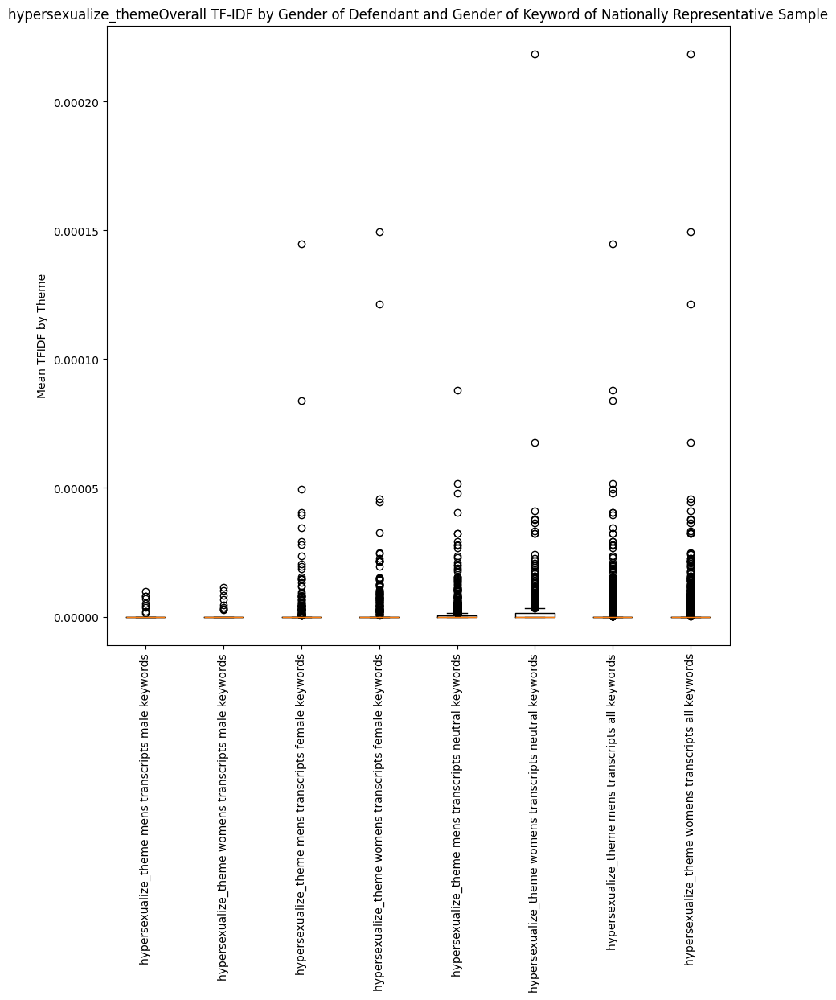

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


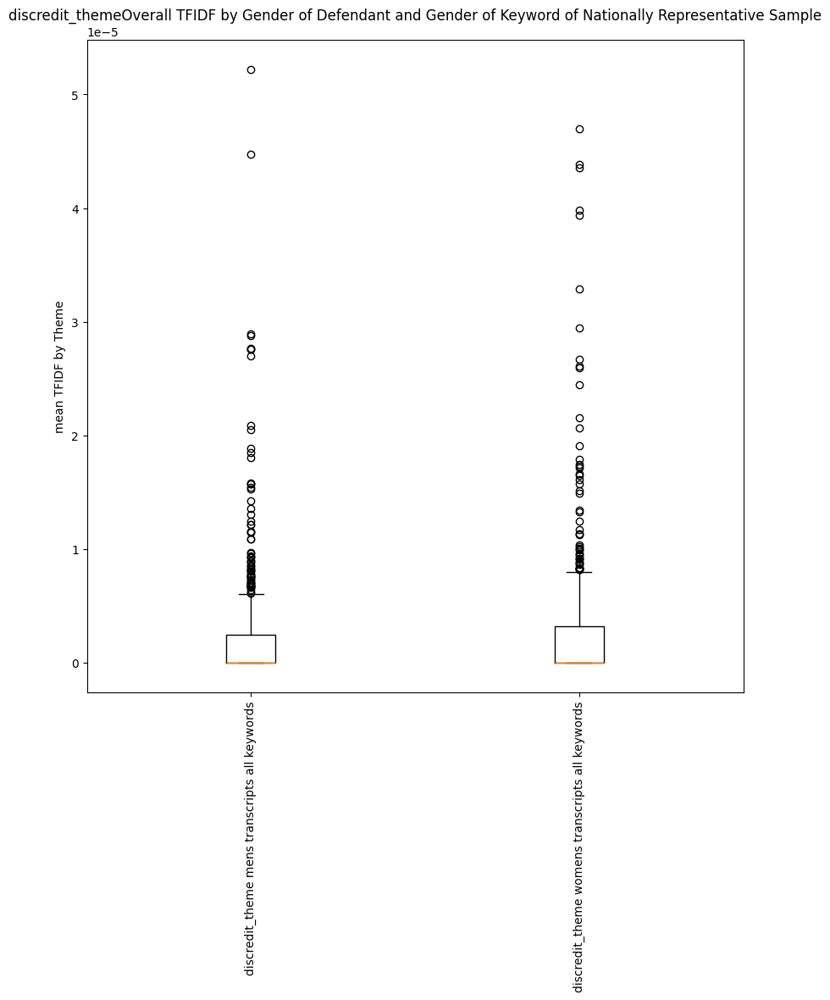

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


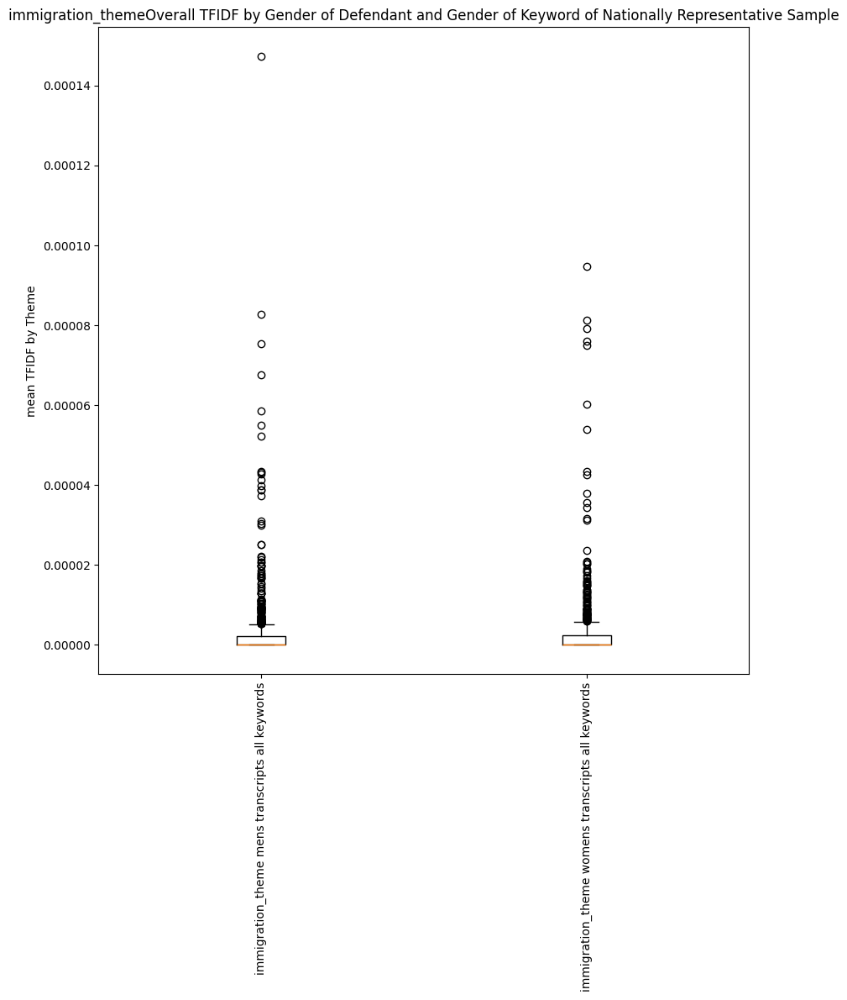

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


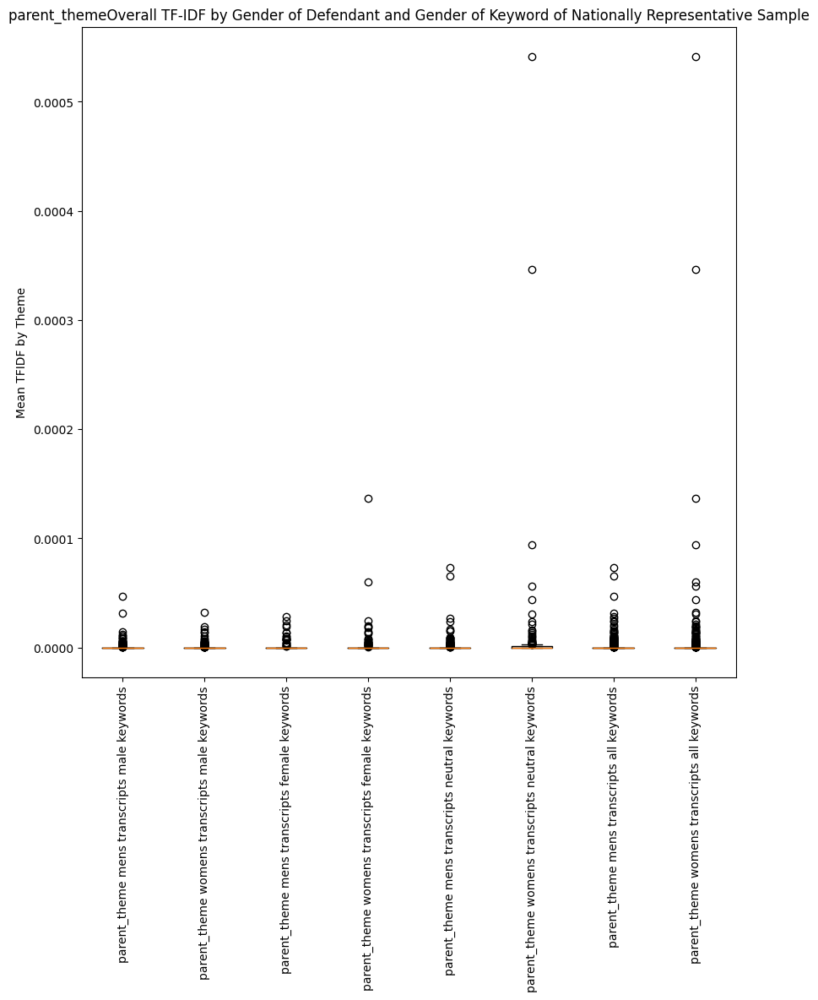

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


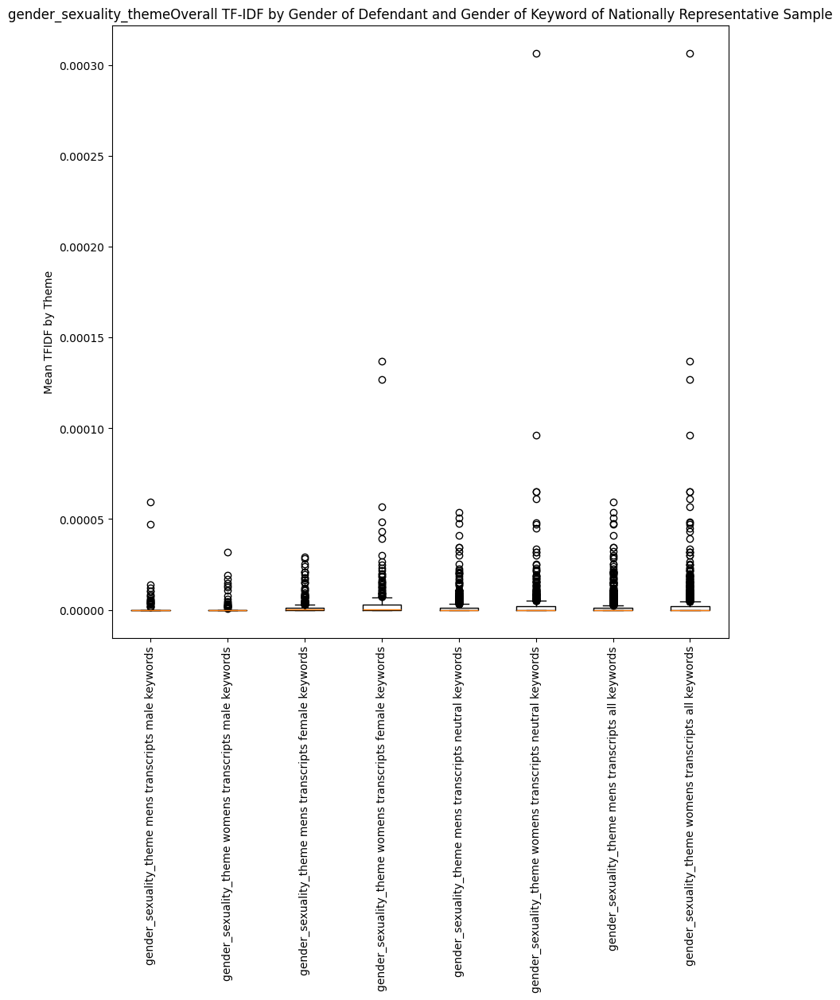

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


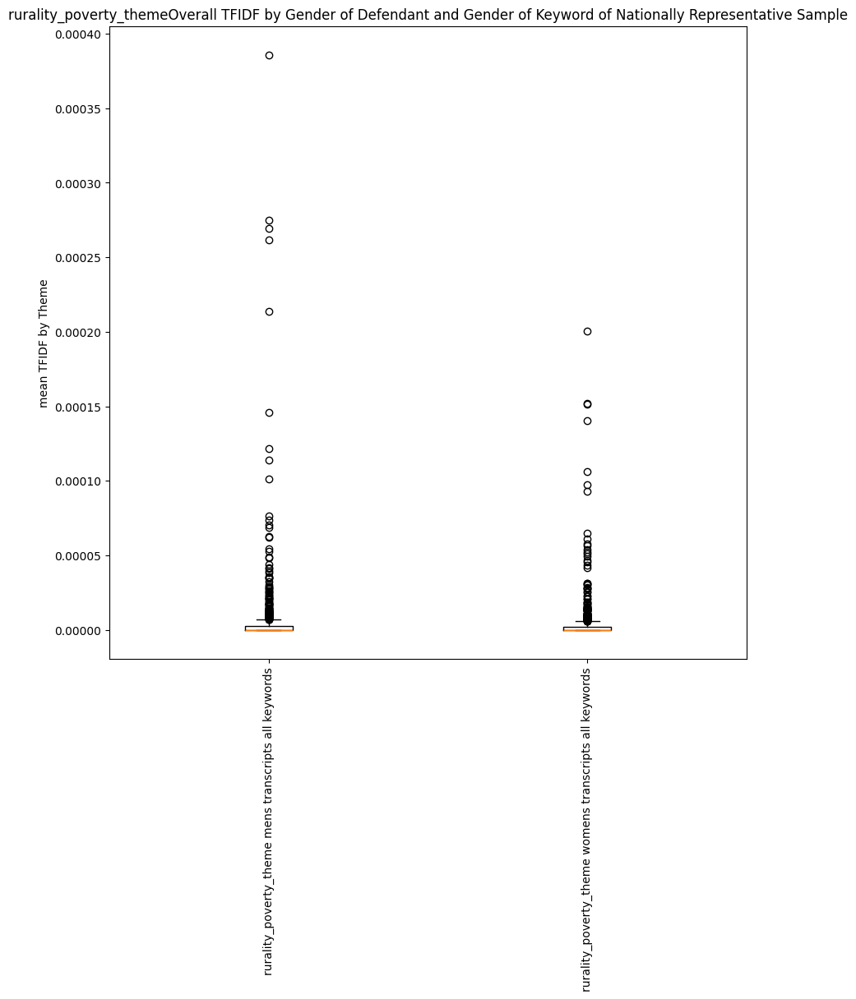

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


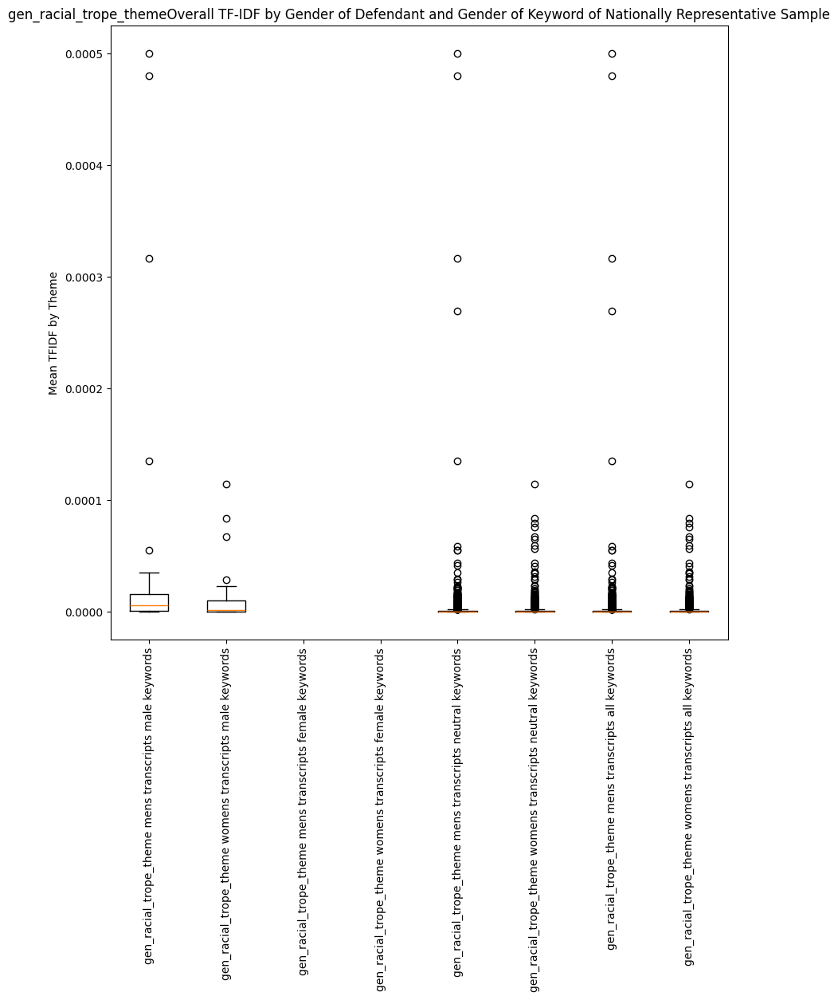

/tmp/ipython-input-1076980289.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([men_theme_m, women_theme_m,


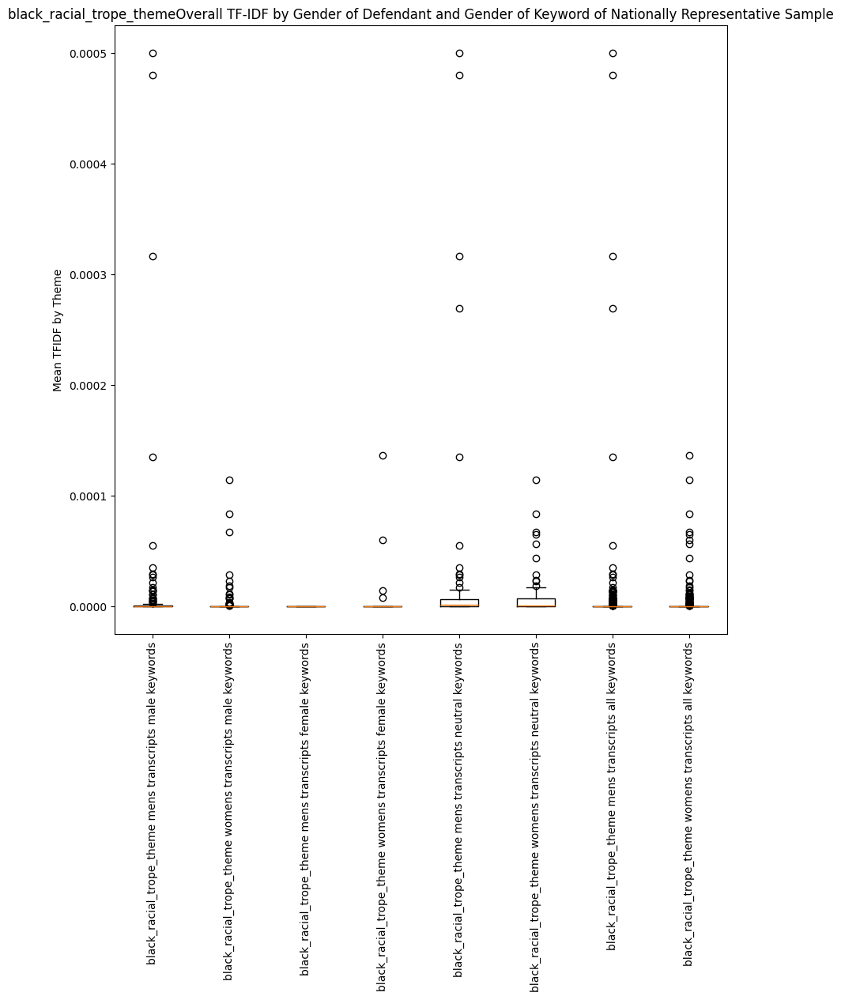

/tmp/ipython-input-1076980289.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([


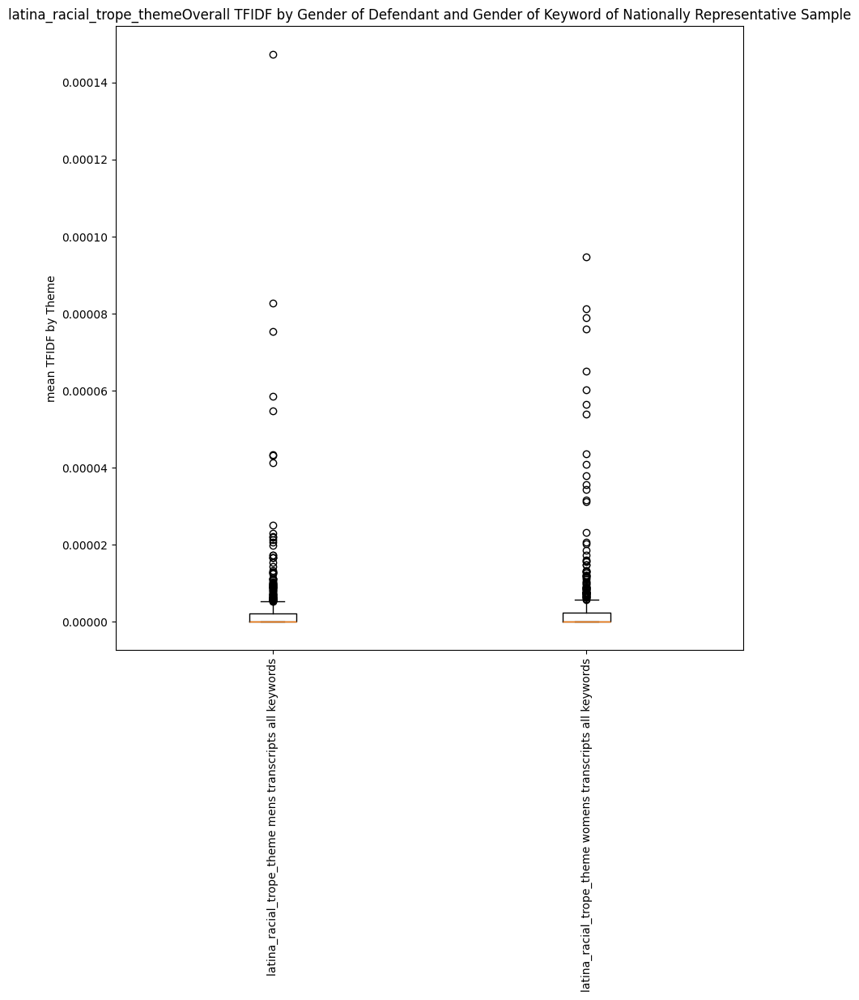

In [125]:
generate_boxplots( keyword_counts[keyword_counts['national_rep_sample']== True] , theme_types, 'overall_tfidf_11_25', 'Nationally Representative Sample')


#Findings from Nationally Representatitive Sample with Themes

*   'general racial trope' theme used more for men compared to women
*   'gender and sexuality', 'discredit', 'hypersexualize' keyowrds for women than men



#Contingency Table, Statistical Signficance Test

Group transcripts by length for contingency tables

Men Transcripts above 500,000 words and Women Transcripts above 500,000 words,

Men Transcripts between 100,00-500,000 and Women transcripts  between 100,00-500000,


Men Transcripts below 100,000 and Women Transcripts below 100,000

In [ ]:
word_count_dict = {key_tuple: value[0] for key_tuple, value in file_counts.items()}


In [ ]:
a_above_500k = {key_tuple: value for key_tuple, value in word_count_dict.items() if  500000 <= value}

b_below_500k = {key_tuple: value for key_tuple, value in word_count_dict.items() if  500000 > value}

# c_below_100k ={key_tuple: value for key_tuple, value in word_count_dict.items() if   100000 > value}



In [ ]:
a_above_500k

{'Wendi Andriano.txt': 1078612,
 'Maureen McDermott.txt': 1430217,
 'Valerie Martin.txt': 593480,
 'Brooke Rottiers.txt': 739572,
 'Blanche Taylor Moore.txt': 517945,
 'Kimberly Cargill.txt': 800318,
 'Susan Eubanks.txt': 590834,
 'Socorro Caro.txt': 2091311,
 'Taylor Parker.txt': 1157376,
 'Manling Williams.txt': 1211606,
 'Celeste Carrington.txt': 633515,
 'Christie Michelle Scott.txt': 632062,
 'Darlie Routier.txt': 917420,
 'Maria Alfaro.txt': 754467,
 'Lorraine Hunter.txt': 505206,
 'Heather Keaton.txt': 579454,
 'Veronica Gonzales.txt': 1449674,
 'Brenda Andrew.txt': 798438,
 'Isidro Miguel Delacruz Combined TranscriptOCR.txt': 887293,
 'Ricky Blackwell Combined Transcript.txt': 653400,
 'Dexter Johnson Combined Transcript.txt': 920115,
 'Micheal_Bell_Unordered_Transcript.txt': 873532,
 'Rodney San Nicolas Combined Transcript.txt': 510672,
 'Eric Leonard Combined TranscriptOCR.txt': 1111862,
 'James Majors Combined TranscriptOCR.txt': 509880,
 'David Leonard Wood Combined Transcr

In [ ]:
# contingency table -
#columns are 4 groups, men below 500k. women below 500k. men 500K or above, women 500k or above
# 1 row per keyword

contingency_table =  pd.DataFrame(columns=['keyword', 'women_above_500k', 'men_above_500k', 'women_below_500k', 'men_below_500k']
    )

In [ ]:
contingency_table

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k


In [ ]:
raw_counts[(raw_counts['gender']=='woman') & (raw_counts['document_name'].isin(a_above_500k) & (raw_counts['keyword']=='cry'))]


,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,gender_neutral_keyword,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count,term_frequency,women_only_tfidf_11_24,women_only_tfidf_11_25,men_only_tfidf_11_25,overall_tfidf_11_25
8,Wendi Andriano.txt,woman,168,cry,True,False,False,False,False,False,...,True,False,True,1078612,26789,0.000156,0.0,0.0,0.0,1.435547e-06
197,Maureen McDermott.txt,woman,63,cry,True,False,False,False,False,False,...,True,False,True,1430217,46806,0.000044,0.0,0.0,0.0,4.059868e-07
386,Valerie Martin.txt,woman,126,cry,True,False,False,False,False,False,...,True,False,True,593480,24092,0.000212,0.0,0.0,0.0,1.956761e-06
575,Brooke Rottiers.txt,woman,22,cry,True,False,False,False,False,False,...,True,False,True,739572,28190,0.00003,0.0,0.0,0.0,2.741672e-07
953,Blanche Taylor Moore.txt,woman,74,cry,True,False,False,False,False,False,...,True,False,False,517945,30105,0.000143,0.0,0.0,0.0,1.316805e-06
1142,Kimberly Cargill.txt,woman,57,cry,True,False,False,False,False,False,...,True,False,True,800318,28853,0.000071,0.0,0.0,0.0,6.564257e-07
1331,Susan Eubanks.txt,woman,48,cry,True,False,False,False,False,False,...,True,False,True,590834,27644,0.000081,0.0,0.0,0.0,7.487711e-07
2465,Socorro Caro.txt,woman,87,cry,True,False,False,False,False,False,...,True,False,False,2091311,53511,0.000042,0.0,0.0,0.0,3.834193e-07
2654,Taylor Parker.txt,woman,153,cry,True,False,False,False,False,False,...,True,False,True,1157376,36444,0.000132,0.0,0.0,0.0,1.218401e-06
2843,Manling Williams.txt,woman,127,cry,True,False,False,False,False,False,...,True,False,True,1211606,33635,0.000105,0.0,0.0,0.0,9.660857e-07


In [ ]:
raw_counts.keyword.unique()

array(['lingerie', 'flirt', 'negro', 'matriarch', 'mother',
       'make believe', 'booty', 'lack of opportunity', 'cry',
       'asking for it', 'baby mama', 'figure hugging', 'sex',
       'contribute to society', 'messy', 'lure', 'adulterer', 'bisexual',
       'bad father', 'unreliable', 'heroin', 'appealing', 'revealing',
       'mom', 'bad mother', 'infiltration', 'illegal', 'trailer trash',
       'community', 'breast', 'contribution to society', 'sacrificial',
       'seduce', 'patriarch', 'short skirt', 'maternal', 'bra', 'bad mom',
       'citizenship', 'english', 'welfare queen', 'acquisitive',
       'wetback', 'lack of empathy', 'boxers', 'cleavage', 'fake',
       'inhuman', 'sexy', 'promiscu', 'feminine', 'uncontrollable',
       'unbelievable', 'unnatural', 'aggressive', 'bitch', 'hyena',
       'butch', 'abandonment', 'wolves', 'mammy', 'jackal', 'man',
       'drugs', 'physically attractive', 'sex appeal', 'exaggerat',
       'not crying', 'lie', 'assertive', 'unfeeli

In [ ]:
for word in raw_counts.keyword.unique():

  #get the count of that word for every doc in each of the four subsets

  #women above 500k
  women_above_500 = raw_counts[(raw_counts['gender']=='woman') & (raw_counts['document_name'].isin(a_above_500k) & (raw_counts['keyword']==word))]
  women_above_500_sum = women_above_500.raw_keyword_count.sum()

  #women below 500k
  w_below_500 = raw_counts[(raw_counts['gender']=='woman') & (raw_counts['document_name'].isin(b_below_500k) & (raw_counts['keyword']==word))]
  w_below_500_sum = w_below_500.raw_keyword_count.sum()

  #men above 500k
  men_above_500 = raw_counts[(raw_counts['gender']=='man') & (raw_counts['document_name'].isin(a_above_500k) & (raw_counts['keyword']==word))]
  men_above_500_sum = men_above_500.raw_keyword_count.sum()
  #men below 500k
  m_below_500 = raw_counts[(raw_counts['gender']=='man') & (raw_counts['document_name'].isin(b_below_500k) & (raw_counts['keyword']==word))]
  m_below_500_sum = m_below_500.raw_keyword_count.sum()




  new_row_data = {"keyword": word, "women_above_500k": women_above_500_sum, 'men_above_500k': men_above_500_sum,  "women_below_500k": w_below_500_sum, 'men_below_500k': m_below_500_sum  }

  # Convert the new row data to a DataFrame
  new_row_df = pd.DataFrame([new_row_data])

  # Concatenate the original DataFrame with the new row DataFrame
  contingency_table = pd.concat([contingency_table, new_row_df], ignore_index=True)

In [ ]:
contingency_table

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k
0,untrustworthy,11,3,1,7
1,lingerie,9,0,20,0
2,flirt,62,21,5,19
3,negro,6,9,1,6
4,matriarch,5,0,24,0
...,...,...,...,...,...
185,neglect,200,117,196,137
186,border,372,623,182,334
187,hysteri,158,65,57,52
188,atypical,13,60,1,15


In [ ]:
women_above_500k_col_total = contingency_table['women_above_500k'].sum()
men_above_500k_col_total = contingency_table['men_above_500k'].sum()

women_bel_500k_col_total = contingency_table['women_below_500k'].sum()
men_bel_500k_col_total = contingency_table['men_below_500k'].sum()

grand_total = women_above_500k_col_total + men_above_500k_col_total + women_bel_500k_col_total + men_bel_500k_col_total

Calculate the expected value E


E = (Total occurrences in corpus * total words in corpus) / total of all words in all corpora)

E = (row total * column total)/ grand total  
where grand total = sum of all contengency talble values




In [ ]:
contingency_table[contingency_table['keyword']=='untrustworthy'].women_above_500k.value + contingency_table[contingency_table['keyword']=='untrustworthy'].men_above_500k.value

AttributeError: 'Series' object has no attribute 'value'

In [ ]:
contingency_table[contingency_table['keyword']=='untrustworthy'].sum(axis=1, numeric_only=True)


,0
0,0.0
189,0.0


In [ ]:
E_table = pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
E_table

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k


In [ ]:
for word in raw_counts.keyword.unique():
  #get the count of that word for every doc in each of the four subsets


  row_sum = (contingency_table[contingency_table['keyword']==word].women_above_500k.values +
             contingency_table[contingency_table['keyword']==word].men_above_500k.values +
              contingency_table[contingency_table['keyword']==word].women_below_500k.values +
                contingency_table[contingency_table['keyword']==word].men_below_500k.values ).astype(float)


  new_row_data = {"keyword": word, "women_above_500k": (row_sum[0] * women_above_500k_col_total) / grand_total,
                  'men_above_500k': (row_sum[0] * men_above_500k_col_total) / grand_total,
                  "women_below_500k":( row_sum[0] * women_bel_500k_col_total  )/ grand_total,
                  'men_below_500k': (row_sum[0]  * men_bel_500k_col_total) / grand_total }

  # Convert the new row data to a DataFrame
  new_row_df = pd.DataFrame([new_row_data])

  # Concatenate the original DataFrame with the new row DataFrame
  E_table = pd.concat([E_table, new_row_df], ignore_index=True)


/tmp/ipython-input-12381192.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  E_table = pd.concat([E_table, new_row_df], ignore_index=True)


In [ ]:
E_table

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k
0,lingerie,10.358370,7.132921,3.808791,7.699917
1,flirt,38.218815,26.318020,14.053127,28.410038
2,negro,7.858074,5.411182,2.889428,5.841316
3,matriarch,10.358370,7.132921,3.808791,7.699917
4,mother,6411.474080,4415.032345,2357.510598,4765.982978
...,...,...,...,...,...
184,neglect,232.170371,159.875823,85.369465,172.584342
185,border,539.706815,371.649798,198.451171,401.192216
186,hysteri,118.585482,81.659651,43.604096,88.150772
187,atypical,31.789482,21.890690,11.689050,23.630779


In [ ]:
#sanity check, manually calculate E for a few words

untrustworthy_aw =  (22*women_above_500k_col_total)/ grand_total

untrustworthy_bm = (22*men_bel_500k_col_total) /grand_total

matriarch_bw = (29 * women_bel_500k_col_total) / grand_total

In [ ]:
untrustworthy_aw

7.858074080803784

In [ ]:
untrustworthy_bm

5.841316184502043

In [ ]:
matriarch_bw

3.808791494686244

In [ ]:
E_table.to_csv('expected_value_keyword_11_25.csv')

In [ ]:
contingency_table

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k
0,untrustworthy,11,3,1,7
1,lingerie,9,0,20,0
2,flirt,62,21,5,19
3,negro,6,9,1,6
4,matriarch,5,0,24,0
...,...,...,...,...,...
185,neglect,200,117,196,137
186,border,372,623,182,334
187,hysteri,158,65,57,52
188,atypical,13,60,1,15


In [ ]:
E_table[E_table['keyword']=='mammy']

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k
60,mammy,0.0,0.0,0.0,0.0


Calulate CHI squared values and degrees of freedom


sum of (o-e)**2 / e

In [ ]:
contingency_table[contingency_table['keyword']=='lingerie'].women_above_500k.values

array([9], dtype=object)

In [ ]:
E_table[E_table['keyword']=='lingerie'].women_above_500k.values

array([10.35837038])

In [ ]:
((9 - 10.35837038)**2) / 10.35837038

0.17813324119245724

In [ ]:
e_men_below_500k==0

np.True_

In [ ]:
chi_table = pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])


In [ ]:
o_e_sums = 0
excluded_words= {}

for word in raw_counts.keyword.unique():
#(observed - expected)**2 / expected
  print(word)
  o_women_above_500k = 	contingency_table[contingency_table['keyword']==word].women_above_500k.values[0]
  o_men_above_500k = contingency_table[contingency_table['keyword']==word].men_above_500k.values[0]
  o_women_below_500k = contingency_table[contingency_table['keyword']==word].women_below_500k.values[0]
  o_men_below_500k = contingency_table[contingency_table['keyword']==word].men_below_500k.values[0]

  e_women_above_500k = 	E_table[E_table['keyword']==word].women_above_500k.values[0]
  e_men_above_500k = E_table[E_table['keyword']==word].men_above_500k.values[0]
  e_women_below_500k = E_table[E_table['keyword']==word].women_below_500k.values[0]
  e_men_below_500k = E_table[E_table['keyword']==word].men_below_500k.values[0]


#exclude words that are less than 5 expected value in each corpus
  if ( e_women_above_500k < 2) or (e_men_above_500k< 2) or (e_women_below_500k< 2) or (e_men_below_500k  < 2):
    excluded_words[word]= (e_women_above_500k , e_men_above_500k, e_women_below_500k, e_men_below_500k)
    pass

  else:
    val1  = (o_women_above_500k - e_women_above_500k)**2 /e_women_above_500k

    val2  = (o_men_above_500k - e_men_above_500k)**2 /e_men_above_500k
    val3  = (o_women_below_500k - e_women_below_500k)**2 /e_women_below_500k
    val4  = (o_men_below_500k - e_men_below_500k)**2/ e_men_below_500k

    print((val1 + val2 + val3+ val4))

    o_e_sums += (val1 + val2 + val3+ val4)

    new_row_data = {"keyword": word, "women_above_500k": val1,
                    'men_above_500k':val2 ,
                    "women_below_500k": val3,
                    'men_below_500k':val4

                    }

    # Convert the new row data to a DataFrame
    new_row_df = pd.DataFrame([new_row_data])

    # Concatenate the original DataFrame with the new row DataFrame
    chi_table = pd.concat([chi_table, new_row_df])

lingerie
83.83995117032755
flirt
24.82105326445275
negro
4.0593629450509905
matriarch
124.64257822043017
mother
405.4012548188133
make believe
booty
lack of opportunity
cry
23.36036709807795
asking for it
2.6063112562280004
baby mama
figure hugging
sex
11.926696163238596
contribute to society
messy
11.981601543961347
lure
111.18440873660532
adulterer
bisexual
bad father
unreliable
52.13136897392283
heroin
20.05688282601054
appealing
8.457882485336645
revealing
8.76145084384685
mom
329.21756496416253
bad mother
20.242783536174805
infiltration
illegal
48.506840698649796
trailer trash
community
128.43254236851584
breast
10.101335783785343
contribution to society
sacrificial
seduce
3.5773635024338106
patriarch
short skirt
maternal
71.02967619694738
bra
3960.251186988263
bad mom
citizenship
21.788962478616224
english
146.23066456888856
welfare queen
acquisitive
wetback
lack of empathy
9.847203140821064
boxers
13.668380374460487
cleavage
fake
753.0411681226342
inhuman
76.69402618617785
sexy


/tmp/ipython-input-340196159.py:45: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  chi_table = pd.concat([chi_table, new_row_df])


In [ ]:
chi_table

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k
0,lingerie,0.178133,7.132921,68.828980,7.699917
0,flirt,14.797549,1.074600,5.832091,3.116814
0,negro,0.439349,2.380186,1.235517,0.004311
0,matriarch,2.771877,7.132921,107.037863,7.699917
0,mother,160.218193,179.019869,32.426743,33.736450
...,...,...,...,...,...
0,neglect,4.457643,11.498525,143.366430,7.336966
0,border,52.112694,169.990471,1.363766,11.253443
0,hysteri,13.100291,3.398790,4.115445,14.825489
0,atypical,11.105705,66.344166,9.774600,3.152260


In [ ]:
o_e_sums

np.float64(22883.83552534671)

In [ ]:
#sanity check, sums of col_sums should equal  o_e_sums

chi_table.women_above_500k.sum() + chi_table.men_above_500k.sum() + chi_table.women_below_500k.sum() + chi_table.men_below_500k.sum()

np.float64(22883.8355253467)

In [ ]:
chi_table.to_csv('chi_vals_11_25.csv')

Calculate critical value


In [ ]:
chi_table.shape

(100, 5)

In [ ]:
(chi_table.shape[0] - 1) *(4-1)

384

(expected val <5)
with a CHI square value of 22301.209837927316 and a critical value of 297 we can reject thee null hypothesis and conclude that there is strong evidence for the existence of genuine differences in the
frequencies of gender stereotyping keywowrds across length and gender of transcripts.

(expected val < 2)
with a CHI square value of 22883.8355253467 and a critical value of 384 we can reject thee null hypothesis and conclude that there is strong evidence for the existence of genuine differences in the
frequencies of gender stereotyping keywowrds across length and gender of transcripts.




In [ ]:
excluded_words.keys()

dict_keys(['make believe', 'booty', 'lack of opportunity', 'baby mama', 'figure hugging', 'contribute to society', 'adulterer', 'bisexual', 'bad father', 'infiltration', 'trailer trash', 'contribution to society', 'sacrificial', 'patriarch', 'short skirt', 'bad mom', 'welfare queen', 'acquisitive', 'wetback', 'cleavage', 'hyena', 'wolves', 'mammy', 'jackal', 'physically attractive', 'sex appeal', 'unfeeling', 'unlawful presence', 'temptress', 'bimbo', 'lesbian', 'immodest', 'busty', 'feral', 'sexual appeal', 'american hospitality', 'oversexed', 'baby daddy', 'mistress', 'dyke', 'skank', 'floozy', 'womanizer', 'emotionally abusive', 'cries wolf', 'untamable', 'brute', 'low cut', 'flaunting', 'queer', 'tight fitting', 'jezebel', 'overbearing', 'deranged', 'infiltrat', 'glamour', 'had it coming', 'family oriented', 'insincere', 'bad dad'])

In [ ]:

contingency_table[contingency_table['keyword']=='mistress']

,keyword,women_above_500k,men_above_500k,women_below_500k,men_below_500k
101,mistress,12,1,0,0


In [ ]:
def create_contingency_table(raw_counts, contingency_table, E_table, chi_table ):


  for word in raw_counts.keyword.unique():

    #get the count of that word for every doc in each of the four subsets

    #women above 500k
    women_above_500 = raw_counts[(raw_counts['gender']=='woman') & (raw_counts['document_name'].isin(a_above_500k) & (raw_counts['keyword']==word))]
    women_above_500_sum = women_above_500.raw_keyword_count.sum()

    #women below 500k
    w_below_500 = raw_counts[(raw_counts['gender']=='woman') & (raw_counts['document_name'].isin(b_below_500k) & (raw_counts['keyword']==word))]
    w_below_500_sum = w_below_500.raw_keyword_count.sum()

    #men above 500k
    men_above_500 = raw_counts[(raw_counts['gender']=='man') & (raw_counts['document_name'].isin(a_above_500k) & (raw_counts['keyword']==word))]
    men_above_500_sum = men_above_500.raw_keyword_count.sum()
    #men below 500k
    m_below_500 = raw_counts[(raw_counts['gender']=='man') & (raw_counts['document_name'].isin(b_below_500k) & (raw_counts['keyword']==word))]
    m_below_500_sum = m_below_500.raw_keyword_count.sum()




    new_row_data = {"keyword": word, "women_above_500k": women_above_500_sum, 'men_above_500k': men_above_500_sum,  "women_below_500k": w_below_500_sum, 'men_below_500k': m_below_500_sum  }

    # Convert the new row data to a DataFrame
    new_row_df = pd.DataFrame([new_row_data])

    # Concatenate the original DataFrame with the new row DataFrame
    contingency_table = pd.concat([contingency_table, new_row_df], ignore_index=True)

  for word in raw_counts.keyword.unique():
    #get the count of that word for every doc in each of the four subsets


    row_sum = (contingency_table[contingency_table['keyword']==word].women_above_500k.values +
              contingency_table[contingency_table['keyword']==word].men_above_500k.values +
                contingency_table[contingency_table['keyword']==word].women_below_500k.values +
                  contingency_table[contingency_table['keyword']==word].men_below_500k.values ).astype(float)


    new_row_data = {"keyword": word, "women_above_500k": (row_sum[0] * women_above_500k_col_total) / grand_total,
                    'men_above_500k': (row_sum[0] * men_above_500k_col_total) / grand_total,
                    "women_below_500k":( row_sum[0] * women_bel_500k_col_total  )/ grand_total,
                    'men_below_500k': (row_sum[0]  * men_bel_500k_col_total) / grand_total }

    # Convert the new row data to a DataFrame
    new_row_df = pd.DataFrame([new_row_data])

    # Concatenate the original DataFrame with the new row DataFrame
    E_table = pd.concat([E_table, new_row_df], ignore_index=True)

    o_e_sums = 0
  excluded_words= {}

  for word in raw_counts.keyword.unique():
  #(observed - expected)**2 / expected
    # print(word)
    o_women_above_500k = 	contingency_table[contingency_table['keyword']==word].women_above_500k.values[0]
    o_men_above_500k = contingency_table[contingency_table['keyword']==word].men_above_500k.values[0]
    o_women_below_500k = contingency_table[contingency_table['keyword']==word].women_below_500k.values[0]
    o_men_below_500k = contingency_table[contingency_table['keyword']==word].men_below_500k.values[0]

    e_women_above_500k = 	E_table[E_table['keyword']==word].women_above_500k.values[0]
    e_men_above_500k = E_table[E_table['keyword']==word].men_above_500k.values[0]
    e_women_below_500k = E_table[E_table['keyword']==word].women_below_500k.values[0]
    e_men_below_500k = E_table[E_table['keyword']==word].men_below_500k.values[0]


  #exclude words that are less than 5 expected value in each corpus
    if ( e_women_above_500k < 2) or (e_men_above_500k< 2) or (e_women_below_500k< 2) or (e_men_below_500k  < 2):
      excluded_words[word]= (e_women_above_500k , e_men_above_500k, e_women_below_500k, e_men_below_500k)
      pass

    else:
      val1  = (o_women_above_500k - e_women_above_500k)**2 /e_women_above_500k

      val2  = (o_men_above_500k - e_men_above_500k)**2 /e_men_above_500k
      val3  = (o_women_below_500k - e_women_below_500k)**2 /e_women_below_500k
      val4  = (o_men_below_500k - e_men_below_500k)**2/ e_men_below_500k

      # print((val1 + val2 + val3+ val4))

      o_e_sums += (val1 + val2 + val3+ val4)

      new_row_data = {"keyword": word, "women_above_500k": val1,
                      'men_above_500k':val2 ,
                      "women_below_500k": val3,
                      'men_below_500k':val4

                      }

      # Convert the new row data to a DataFrame
      new_row_df = pd.DataFrame([new_row_data])

      # Concatenate the original DataFrame with the new row DataFrame
      chi_table = pd.concat([chi_table, new_row_df])

      degrees_of_freedom = (chi_table.shape[0] - 1) *(4-1)

  return o_e_sums, degrees_of_freedom, excluded_words

In [ ]:
l2_match = raw_counts[raw_counts['race_state_crime_match']==True]

In [ ]:
l2_match

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,gender_neutral_keyword,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count,term_frequency,women_only_tfidf_11_24,women_only_tfidf_11_25,men_only_tfidf_11_25,overall_tfidf_11_25
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,False,True,1078612,26789,0.0,0.0,0.000000,0.000000,0.000000
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,True,False,True,1078612,26789,0.000028,0.000037,0.000037,0.000000,0.000041
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,True,False,True,1078612,26789,0.0,0.0,0.000000,0.000000,0.000000
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,False,True,1078612,26789,0.0,0.0,0.000000,0.000000,0.000000
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,False,True,1078612,26789,0.000453,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,...,True,False,True,920115,30899,0.000004,0,0.000000,0.000002,0.000001
20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,...,True,False,True,920115,30899,0.000073,0,0.000000,0.000020,0.000020
20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,...,True,False,True,920115,30899,0.0,0,0.000000,0.000000,0.000000
20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,...,True,False,True,920115,30899,0.000002,0,0.000000,0.000003,0.000003


In [ ]:
l2o_e, l2degrees_of_freedom, l2excluded_words = create_contingency_table(l2_match, pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
, pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
, pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
 )


/tmp/ipython-input-2639577869.py:53: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  E_table = pd.concat([E_table, new_row_df], ignore_index=True)
/tmp/ipython-input-2639577869.py:99: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  chi_table = pd.concat([chi_table, new_row_df])


In [ ]:
l2o_e

np.float64(33938.51191865638)

In [ ]:
l2degrees_of_freedom

315

In [ ]:
l2excluded_words.keys()

dict_keys(['lingerie', 'negro', 'make believe', 'booty', 'lack of opportunity', 'baby mama', 'figure hugging', 'contribute to society', 'adulterer', 'bisexual', 'bad father', 'bad mother', 'infiltration', 'trailer trash', 'contribution to society', 'sacrificial', 'seduce', 'patriarch', 'short skirt', 'bad mom', 'citizenship', 'welfare queen', 'acquisitive', 'wetback', 'lack of empathy', 'boxers', 'cleavage', 'inhuman', 'sexy', 'feminine', 'hyena', 'wolves', 'mammy', 'jackal', 'physically attractive', 'sex appeal', 'not crying', 'unfeeling', 'unlawful presence', 'temptress', 'bimbo', 'uncaring', 'lesbian', 'immodest', 'busty', 'greedy', 'feral', 'sexual appeal', 'american hospitality', 'oversexed', 'baby daddy', 'mistress', 'dyke', 'skank', 'floozy', 'customs', 'womanizer', 'emotionally abusive', 'cries wolf', 'untamable', 'brute', 'exotic', 'manly', 'low cut', 'flaunting', 'queer', 'masculine', 'tight fitting', 'jezebel', 'overbearing', 'scheming', 'deranged', 'infiltrat', 'glamour', '

In [ ]:
raw_counts

,document_name,gender,raw_keyword_count,keyword,pathologize_theme,hypersexualize_theme,discredit_theme,immigration_theme,parent_theme,gender_sexuality_theme,...,gender_neutral_keyword,co_defendant_match,race_state_crime_match,document_word_count,document_unique_word_count,term_frequency,women_only_tfidf_11_24,women_only_tfidf_11_25,men_only_tfidf_11_25,overall_tfidf_11_25
0,Wendi Andriano.txt,woman,0,lingerie,False,True,False,False,False,False,...,False,False,True,1078612,26789,0.0,0.0,0.000000,0.000000,0.000000
1,Wendi Andriano.txt,woman,30,flirt,False,True,False,False,False,False,...,True,False,True,1078612,26789,0.000028,0.000037,0.000037,0.000000,0.000041
2,Wendi Andriano.txt,woman,0,negro,False,False,False,False,False,False,...,True,False,True,1078612,26789,0.0,0.0,0.000000,0.000000,0.000000
3,Wendi Andriano.txt,woman,0,matriarch,False,False,False,False,True,False,...,False,False,True,1078612,26789,0.0,0.0,0.000000,0.000000,0.000000
4,Wendi Andriano.txt,woman,489,mother,False,False,False,False,True,False,...,False,False,True,1078612,26789,0.000453,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20785,Blaine Milam Combined Transcript OCR.txt,man,4,neglect,False,False,False,False,False,True,...,True,False,True,920115,30899,0.000004,0,0.000000,0.000002,0.000001
20786,Blaine Milam Combined Transcript OCR.txt,man,67,border,False,False,False,True,False,False,...,True,False,True,920115,30899,0.000073,0,0.000000,0.000020,0.000020
20787,Blaine Milam Combined Transcript OCR.txt,man,0,hysteri,True,False,True,False,False,False,...,True,False,True,920115,30899,0.0,0,0.000000,0.000000,0.000000
20788,Blaine Milam Combined Transcript OCR.txt,man,2,atypical,False,False,True,False,False,False,...,True,False,True,920115,30899,0.000002,0,0.000000,0.000003,0.000003


In [ ]:
l1_match = raw_counts[raw_counts['co_defendant_match']==True]

l1o_e, l1degrees_of_freedom, l1excluded_words = create_contingency_table(l1_match, pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
, pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
, pd.DataFrame(columns= ['keyword'	,'women_above_500k'	,'men_above_500k',	'women_below_500k'	,'men_below_500k'])
 )
print(l1o_e)
print(l1degrees_of_freedom)

/tmp/ipython-input-2639577869.py:53: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  E_table = pd.concat([E_table, new_row_df], ignore_index=True)
/tmp/ipython-input-2639577869.py:99: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  chi_table = pd.concat([chi_table, new_row_df])


11255.57428780425
183


In [ ]:
33938.51191865638